
# <font size="+3"><span style='color:#2994ff'> **P5 - Segmentez des clients d'un site e-commerce** </span></font>


<a id='LOADING_LIBRARIES'></a>

---

---

<font size="+1"> **LOADING THE LIBRARIES** </font>

---

In [3]:

# ----------------
# Packages Update
# ----------------
# !pip install --upgrade sklearn
# !pip install Jinja2

# General libraries
import os
import glob
import pandas as pd
# import geopandas as gpd
import numpy as np
# import random
import csv
from pprint import pprint
# from functools import reduce
import time
from collections import Counter
from math import pi

# Data preprocessing
import sklearn
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
# from category_encoders import TargetEncoder


# Dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, Isomap

# Clustering
from sklearn import cluster, metrics
from sklearn import decomposition
from sklearn.metrics.cluster import adjusted_rand_score
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
import statistics


# Data visualisation
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
# import plotly as plotly
import plotly.express as px
import squarify
# import folium
# import webbrowser
import scipy.stats as stats
%pylab inline

# Validation code PEP8
%load_ext pycodestyle_magic
%pycodestyle_on

# Warnings
import warnings
from warnings import simplefilter
warnings.filterwarnings(action='once')
# simplefilter(action='ignore', category=FutureWarning)
# simplefilter(action='ignore', category=ValueError)
# simplefilter(action='ignore', category=UserWarning)


'''
# -------------------------------------------------------------
# Checking the version numbers of the installed packages
# -------------------------------------------------------------
'''
print('Librairies version : \n')


print('Pandas      : ' + pd.__version__)
# print('Geopandas      : ' + gpd.__version__)
print('NumPy       : ' + np.version.full_version)
print('Csv         : ' + csv.__version__ + '\n')

print('Matplotlib  : ' + mpl.__version__)
print('Seaborn     : ' + sns.__version__ + '\n')

print('Sklearn     : ' + sklearn.__version__)
# print('LightGBM    : ' + lightgbm.__version__)
# print('Shap        : ' + shap.__version__+ '\n')


import datetime
now = datetime.datetime.now().isoformat()
print('Launched on      : ' + now)

Populating the interactive namespace from numpy and matplotlib
Librairies version : 

Pandas      : 1.5.3
NumPy       : 1.23.5
Csv         : 1.0

Matplotlib  : 3.7.1
Seaborn     : 0.12.2

Sklearn     : 1.0.2
Launched on      : 2023-04-14T12:54:28.335744


/home/raquelsp/anaconda3/lib/python3.9/site-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['pi']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


<a id='USED_PARAMETERS'></a>
<br>

---
---

<font size="+1"> **PARAMETERS USED IN THIS NOTEBOOK** </font>

---

In [4]:
# Definition of parameters used in this project

seed = 84

palette4 = ["#253d85", "#618576", "#cba87d", "#faec4d"]

palette5 = ["#253d85", "#618576", "#9595b1", "#cba87d", "#faec4d"]

palette6 = ["#253d85", "#618576", "#9595b1", "#cba87d", "#dcd2a3", "#faec4d"]

palette7 = ["#253d85", "#618576", "#9595b1", "#cba87d", "#dcd2a3", "#faec4d",
            "#ffa600"]


<a id='USED_FUNCTIONS'></a>


<br>


---
---

<font size="+1"> **FUNCTIONS USED IN THIS NOTEBOOK** </font>

---


In [5]:
%pycodestyle_off

In [6]:
# ---------------------------------------------
#  CUSTOMER SEGMENT SIZE ANALYSIS
# ---------------------------------------------


def segment_size(dataframe, feature, paletteN,
                   tableau=True, graphDistsrib=True):

    """
     Displays the frequency table and a bar graph with the frequency
     of the words
    @Params IN :
        dataframe : DataFrame, required
        feature : categorical variables to be analyzed, required
        paletteN : list of colors to use in the graph
        tableau : booléen, True = displays the frequency table
        graphDistsrib : booléen,  True = displays the percentage distribution
        graph"""

    if tableau:
        df = dataframe[feature].value_counts().to_frame().reset_index()
        df = df.rename(columns={'index':feature, feature:'num_entries'})
        df['Frequency_%'] = 100*df['num_entries']/((dataframe.shape[0]))
        display(df.head(10).style.hide(axis="index"))

    if graphDistsrib:
        plt.figure(figsize=(4,4))
        df_graph = df.sort_values("Frequency_%", ascending=False).head(20)
        sns.barplot(data= df_graph, x= feature, y= "Frequency_%" ,
                    palette = paletteN)
        plt.title("Distribution of " + feature)
        plt.show()

In [7]:
# ---------------------------
#  COMPUTING K-Means METRICS
# ---------------------------

def compute_kmeans_metrics(data, dataframe_metrics, analyzed_data, scaling,
                           random_seed, n_clusters, n_init, init):
    '''
    K-means metrics are calculated as a function of different parameters.
    ------------
    #Parameters
    #-----------
    data : data
    dataframe_metrics : dataframe for saving the results
    analyzed_data : Name of analyzed data
    scaling : scaler used
    random_seed : random number for reproducibility
    n_clusters : list of number of clusters
    n_init : number of clusters to initialize
    init : Method for initialization : 'k-means++' ou 'random'.
    #--------
    #Returns
    ---------
    dataframe_metrics : dataframe with the results of the different
                        combinations of parameters
    '''
    # This function helps to identify the optimal number of clusters
    # for the analysis: the silhouette coefficient, dispersion,
    # davies_bouldin index

    silhouette = []
    dispersion = []
    davies_bouldin = []
    calin_harabs = []
    analz_data = []
    scal = []
    chrono = []

    result_clusters = []
    result_ninit = []
    result_init_method = []

    # Hyperparameter tunning
    n_clusters = n_clusters
    num_init = n_init
    init_method = init

    # Model test
    for num_clusters in n_clusters:

        for init in num_init:

            for i in init_method:
                # Starts the time counter
                time_start = time.time()

                # Initialize the algorithm
                cls = cluster.KMeans(n_clusters=num_clusters,
                                     n_init=init, init=i,
                                     random_state=random_seed)

                # Training the algorithm
                cls.fit(data)

                # Predictions
                preds = cls.predict(data)

                # Stops the time counter
                time_end = time.time()

                # Calculate silhouette coefficient score
                silh = metrics.silhouette_score(data, preds)
                # Calculate the inertia
                disp = cls.inertia_
                # Calculate the Davies-Bouldin index
                db = metrics.davies_bouldin_score(data, preds)
                # Calculate the Calisnki_Harabasz index
                ch = metrics.calinski_harabasz_score(data, preds)
                # Computing Time
                computing_time = time_end - time_start

                silhouette.append(silh)
                dispersion.append(disp)
                davies_bouldin.append(db)
                calin_harabs.append(ch)
                analz_data.append(analyzed_data)
                scal.append(scaling)
                chrono.append(computing_time)

                result_clusters.append(num_clusters)
                result_ninit.append(init)
                result_init_method.append(i)

    dataframe_metrics = pd.concat([dataframe_metrics, (pd.DataFrame(
                                    {"Analyzed_data": analz_data,
                                     "Scaler" : scal,
                                     "Num_clusters": result_clusters,
                                     "n_init": result_ninit,
                                     "init_method": result_init_method,
                                     "coef_silh": silhouette,
                                     "inertia": dispersion,
                                     "Davies_Bouldin": davies_bouldin,
                                     "Calinski_Harabasz" : calin_harabs,
                                     "Computing_time_s": chrono }))], axis =0)

    return dataframe_metrics

In [8]:
# ---------------------------------------
#  HYPERPARAMETER GRID SEARCH FOR DBScan
# ---------------------------------------

def dbscan_grid_search(X_data, analyzed_data, scaling,
                       dataframe_metrics,
                       eps_space=0.5, min_samples_space=5,
                       min_clust=0, max_clust=10,
                       show_table=True):

    """Performs a hyperparameter grid search for DBSCAN.
       -------------------------------------------------
        * X_data      : data used to fit the DBSCAN instance
        * analyzed_data : Name of analyzed data
        * scaling : scaler used
        * dataframe_metrics : dataframe for saving the metrics
        * eps_space   : the range values for the eps parameter
        * min_samples_space : the range values for the min_samples parameter
        * min_clust   : the minimum number of clusters required after each
                        search iteration in order for a result to be appended
                        to the dataframe
        * max_clust   : the maximum number of clusters required after each
                        search iteration in order for a result to be appended
                        to the dataframe
        * show_table  : booleen displays the result table
    """

    # List to store the results of the grid search
    lst = []
    # a list to store the number sampls per cluster
    clst_count = []

    silhouette = []
    davies_bouldin = []
    calin_harab = []
    analz_data = []
    scal = []
    num_cluster = []
    comp_time = []

    result_eps = []
    result_minsamples = []

    # Looping over each combination of hyperparameters
    for eps_val in eps_space:

        for samples_val in min_samples_space:

            # Starting the time counter
            time_start = time.time()

            dbscan_grid = cluster.DBSCAN(eps=eps_val,
                                         min_samples=samples_val,
                                         n_jobs=-1)

            # fit_transform
            clusters = dbscan_grid.fit_predict(X_data)

            # Ending the time counter
            time_end = time.time()

            # Saving the number of clusters
            n_clusters = sum(abs(np.unique(clusters)))

            # Appending the lst each time n_clusters criteria is reached
            if n_clusters >= min_clust and n_clusters <= max_clust:

                # Calculate silhouette coefficient score
                silh = metrics.silhouette_score(X_data, clusters)
                # Calculate the Davies-Bouldin index
                db = metrics.davies_bouldin_score(X_data, clusters)
                # Calculate the Calinski-Harabasz score
                cal_har = metrics.calinski_harabasz_score(X_data, clusters)
                # Computing Time
                computing_time = time_end - time_start

                silhouette.append(silh)
                davies_bouldin.append(db)
                calin_harab.append(cal_har)
                analz_data.append(analyzed_data)
                scal.append(scaling)
                num_cluster.append(n_clusters)
                comp_time.append(computing_time)

                result_eps.append(eps_val)
                result_minsamples.append(samples_val)

    dataframe_metrics = pd.concat([dataframe_metrics, (pd.DataFrame(
                                {"Analyzed_data": analz_data,
                                 "Scaler" : scal,
                                 "Num_cluster" : num_cluster,
                                 "eps" : result_eps,
                                 "min_samples": result_minsamples,
                                 "coef_silh": silhouette,
                                 "Davies_Bouldin": davies_bouldin,
                                 "Calinski_Harabasz" : calin_harab,
                                 "Computing_time_s": comp_time }))],
                                  axis=0)

    return dataframe_metrics

In [9]:
# -----------------------------------------------------------------
# DENDROGRAM FOR HIERARCHICAL CLUSTERING USING WARDS METHOD #1/2#
# -----------------------------------------------------------------


def hierarchical_clustering_ini(X_data, method, scaler):

    """First stage of two to perform a hierarchical cluster analysis
       using dendrograms
       ------------
       @Parameters:
       X_data : dataset for clustering
       method : The linkage algorithm to use
       scaler : scaler used during pre-processing
       ------------
       @Return:
       A dendrogram to assist in cluster number selection
       """

    # Starting the time counter
    time_start = time.time()
    # Linkage
    Z = linkage(X_data, method)

    # Dendrogramme
    fig, ax = plt.subplots(1, 1, figsize=(4, 6))
    _ = dendrogram(Z, ax=ax,
                   orientation="left", no_labels=True)
    plt.title("Hierarchical clustering using Ward method, " + str(scaler))
    ax.set_xlabel("Distance")
    ax.set_ylabel("Customer")
    ax.tick_params(axis='x', which='major', labelsize=9)

    plt.tight_layout()
    plt.show()

In [10]:
# -----------------------------------------------------------------
# HIERARCHICAL CLUSTERING USING WARDS METHOD METRICS #2/2#
# -----------------------------------------------------------------

def hierarchical_clustering_end(X_data, analyzed_data, scaler, method, k,
                                criterion, Y_data, df_metrics):

    """Second stage of two to perform a hierarchical cluster analysis
       using dendrograms
       ------------
       @Parameters:
       * X_data : dataset for clustering
       * Analyzed_data : name to describe the analyzed data
       * scaler : scaler used during pre-processing
       * method : The linkage algorithm to use
       * k : Number of clusters
       * criterion : The criterion to use in forming flat clusters
       * Y_data : dataset labels
       * df_metrics : dataframe for saving the metrics
       ------------
       @Return:
       The dendrogram resulting from the selected parameter settings,
       the number of items per cluster is indicated.
       """
    analz_data = []
    scal = []
    meth = []
    n_clusters = []
    criteria = []
    chrono = []

    # Starting the time counter
    time_start = time.time()

    # Clustering:
    Z = linkage(X_data, method)
    clusters = fcluster(Z, t=k, criterion=criterion)

    # Dendrogramme
    fig, ax = plt.subplots(1, 1, figsize=(4, 6))
    _ = dendrogram(Z, p=k, ax=ax, orientation="left",
                   no_labels=False, truncate_mode="lastp")

    plt.title("Hierarchical clustering using Ward method " + str(scaler))
    ax.set_xlabel("Distance")
    ax.set_ylabel("Customer")
    ax.tick_params(axis='x', which='major', labelsize=9)
    ax.tick_params(axis='y', which='major', labelsize=6)

    plt.tight_layout()
    plt.show()

    # Ending the time counter
    time_end = time.time()
    computing_time = round((time_end - time_start), 2)

    analz_data.append(analyzed_data)
    scal.append(scaler)
    meth.append(method)
    n_clusters.append(k)
    criteria.append(criterion)
    chrono.append(computing_time)

    # Data frame with metrics information
    df_metrics = pd.concat([df_metrics, (pd.DataFrame(
                            {"Analyzed_data": analz_data,
                             "Scaler" : scal,
                             "Method" : meth,
                             "Num_clusters": n_clusters,
                             "Criterion" : criteria,
                             "Computing_time_s": chrono},
                            index=[0]))], axis=0)

    return df_metrics

In [11]:
# -----------------------------------
# Metrics for algorithms comparison
# -----------------------------------

def clust_comparison(clust_method, data, dataset, pred,
                     df_comparison, chrono):
    '''
    Calcul des métriques pour comparer les différents algorithmes
    de  clustering.
    ----------
    @Parameters
    * clust_method : Clustering method
    * data : data to analyse
    * dataset : name of the dataset
    * pred : prediction results
    * df_comparison : dataframe for saving the results
    * chrono : computing time
    ----------
    @Returns
    -------
    df_metics : metrics results
    '''

    silhouette = []
    davies_bouldin = []
    calin_harab = []
    algor = []
    dataName = []
    chronot = []
    nb_cluster = []

    numcluster = len(set(pred))

    # Calculate the silhouette coefficient
    silh = metrics.silhouette_score(data, pred)
    # Calculate the Davies-Bouldin index
    db = metrics.davies_bouldin_score(data, pred)
    # Calculate the  index
    cal_har = metrics.calinski_harabasz_score(data, pred)

    silhouette.append(silh)
    davies_bouldin.append(db)
    calin_harab.append(cal_har)
    algor.append(clust_method)
    dataName.append(dataset)
    chronot.append(chrono)
    nb_cluster.append(numcluster)

    df_comparison = pd.concat([df_comparison, (pd.DataFrame({
        "Cluster_method": algor,
        "Dataset" : dataName,
        "Num_clusters": nb_cluster,
        "coef_silh": silhouette,
        "davies_bouldin": davies_bouldin,
        "calinski_harabasz": calin_harab,
        "Computing_time": chronot
    }))], axis =0)

    return df_comparison


In [12]:
# ---------------------------------------
# CRÉATION GRAPHIQUE DE CORRELATION, PCA
# ---------------------------------------

# Bloc de code extrait du cours OC "Réalisez une
# analyse exploratoire de données"

def correlation_graph(pca, x_y, features) :
    """Affiche le graphe des correlations

    Positional arguments :
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher,
        exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features
        (ie des dimensions) à représenter
    """

    # Extrait x et y
    x,y=x_y

    fig, ax = plt.subplots(figsize=(5, 5))

    # Pour chaque composante :
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0,
                pca.components_[x, i],
                pca.components_[y, i],
                head_width=0.07,
                head_length=0.07,
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])

    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('PC{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('PC{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    plt.title("Cercle des corrélations (PC{} et PC{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    plt.axis('equal')
    plt.show(block=False)

In [13]:

# ----------------------------------------------------------------------------
# CRÉATION DU GRAPHIQUE DE PROJECTION DES INDIVIDUS SUR LE
# GRAPHIQUE DE CORRELATION, PCA
# ----------------------------------------------------------------------------

# Bloc de code extrait du cours OC "Réalisez une analyse
# exploratoire de données"

def display_factorial_planes(X_projected,
                             x_y,
                             paletteN,
                             pca=None,
                             labels=None,
                             clusters=None,
                             alpha=1,
                             figsize=[10, 8],
                             marker="."):
    """
    Affiche la projection des individus
    ------------------------------
    @ Positional arguments :
    * X_projected : np.array, pd.DataFrame, list of list :
                la matrice des points projetés
    * x_y : list ou tuple : le couple x,y des plans à afficher,
            exemple [0,1] pour F1, F2

    @ Optional arguments :
    * pca : sklearn.decomposition.PCA : un objet PCA qui a été fit,
            cela nous permettra d'afficher la variance de chaque composante,
            default = None
    * labels : list ou tuple : les labels des individus à projeter,
                default = None
    * clusters : list ou tuple : la liste des clusters auquel appartient
                chaque individu, default = None
    * alpha : float in [0,1] : paramètre de transparence, 0=100% transparent,
                1=0% transparent, default = 1
    * figsize : list ou tuple : couple width, height qui définit
                la taille de la figure en inches, default = [10,8]
    * marker : str : le type de marker utilisé pour représenter les individus,
             points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize:
        figsize = (7, 6)

    # On gère les labels
    if labels is None :
        labels = []
    try :
        len(labels)
    except Exception as e :
        raise e

    # On vérifie la variable axis
    if not len(x_y) ==2 :
        raise AttributeError("2 axes sont demandées")
    if max(x_y )>= X_.shape[1] :
        raise AttributeError("la variable axis n'est pas bonne")

    # on définit x et y
    x, y = x_y

    # Initialisation de la figure
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters

    # Les points
    # plt.scatter(X_[:, x], X_[:, y], alpha=alpha,
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, palette ="mako")

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe
    if pca :
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else :
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'PC{x+1} {v1}')
    ax.set_ylabel(f'PC{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y + 0.05, labels[i], fontsize='14',
                     ha='center',va='center')

    # Titre et display
    plt.title(f"Projection des individus (sur PC{x+1} et PC{y+1})")
    plt.show()

In [14]:
# --------------------------------------------------------------------
# METRICS FOR THE CALCULATION OF CLUSTERS INITIALITATION STABILITY
# --------------------------------------------------------------------
def initialitation_stability(clust_method, Analyzed_data, scaler, model, data,
                             df_results, num_iter=5):
    '''
    CALCUL DES METRIQUES pour évaluer la stabilité d'initialisation.
    ---------------
    @ Parameters
    * clust_method : Clustering method
    * Analyzed_data : name to describe the analyzed data
    * scaler : scaler used during pre-processing
    * model : Instantiation of the model configuration whose initialization
            stability is to be analyzed
    * data : data to analyse
    * df_results : dataframe for saving the metrics
    * num_iter : number of iterations (defautl=5)
    ---------------
    @ Returns
    * df_results : dataframe for saving the metrics
    '''

    # Initialize the partition list
    partitions = []

    # Loop on the selected number of iterations
    for i in range(num_iter):
        model.fit(data)
        partitions.append(model.labels_)

    # Computing the ARI scores between partitions
    # --------------------------------------------------------

    # Initialize the ARI scores list
    ARI_scores = []
    # For each partition, except last one
    for i in range(num_iter - 1):
        # Compute the ARI score with other partitions
        for j in range(i + 1, num_iter):
            ARI_score = adjusted_rand_score(partitions[i], partitions[j])
            ARI_scores.append(ARI_score)

    # Compute the mean and standard deviation of ARI scores
    ARI_mean = statistics.mean(ARI_scores)
    ARI_std = statistics.stdev(ARI_scores)

    df_results = pd.concat([df_results, (pd.DataFrame({
        "Cluster_method": [clust_method],
        "Dataset": [Analyzed_data],
        "Scaler": [scaler],
        "ARI_mean": [ARI_mean],
        "ARI_std": [ARI_std]}))], axis=0)

    return df_results



<font size="+3"><span style='color:#2994ff'> **P5 - Segmentez des clients d'un site e-commerce** </span></font>



This notebook is part of the customer segmentation project of the **olist** e-commerce site ; the objective is to understand the different types of users.


## <font color = '#0085dd'>**Table of content**</font>


[Librairies loading](#LOADING_LIBRARIES)<br>

[Parameters used in this notebook](#USED_PARAMETERS)<br>

[Functions used in this notebook](#USED_FUNCTIONS)<br>

---

[**Presentation of the techniques**](#presentation_techniques)
 * [Clustering methods](#cluster_methods)
   * [K-means clustering](#K_means)
   * [DBScan](#dbscan)
   * [Hierarchical clustering with Wards' method, Scipy Dendogram](#hiearchical_ward)
 * [Dimensionality reduction techniques](#dimen_reduc)<br> 
<br>
---

[**Dataset**](#dataset)
 * [Subsample creation](#subsample_creation)
 * [Scaling](#scaling)<br> 
<br>

[**Dimensionality reduction**](#dimensionality_reduc)
 * [PCA](#PCA)
 * [Isomap](#isomap)  
 * [t-SNE](#tsne)   
 * [Dimensionality reduction conclusions](#dimens_reduc_conclusions)<br> 
<br>  

[**RFM Clustering tests**](#rfm_cluster_test)
 * [RFM K-means clustering](#K_means_rfm)
 * [RFM DBScan](#dbscan_rfm)  
 * [RFM Hierarchical Scipy Dendogram](#hiearchical_rfm)<br> 
<br>
 
[**Quantitative data, clustering test**](#quantitative_data_clustering_test)
 * [Quantitative data K-means clustering](#K_means_quanti)
 * [Quantitative data : DBScan](#dbscan_quanti)  
 * [Quantitative data, Hierarchical Scipy Dendogram](#hiearchical_quanti)<br> 
<br> 

[**Quantitative & Qualitative data, clustering test**](#quanti_quali_data_clustering_test)
 * [Quanti&Quali data K-means clustering](#K_means_quanti_quali)
 * [Quanti&Quali data : DBScan](#dbscan_quanti_quali)  
 * [Quanti&Quali data, Hierarchical Scipy Dendogram](#hiearchical_quanti_quali)<br> 
<br>  

[**Comparison of the algorithms performances**](#rfm_comp_algo_perform)
 * [K-means tests](#kmeans_test)
 * [DBScan tests](#dbscan_test)  
 * [Hierarchical clustering using Wards' method, tests](#hier_wards_test)<br>
 * [Performances visualization](#performances_visualization)
 * [Cluster initialitation stability](#cluster_stability_initialitation)  
 * [Preliminary analysis of selected configurations](#prelim_analysis_selec_config)<br> 
 * [Summary](#performances_summary)<br> 
<br>

---



This notebook is part of the customer segmentation project of the **olist** e-commerce site.<br>
In these notebook several **clustering and dimensionality reduction methods are explored**.<br>
The objective is to identify the methods and combinations of hyperparameters that allow to segregate and interpret in the best possible way the identified customer groups.<br>

<center><img src="./img/logo_olist.png" style="height: 100px;"/></center>


This notebook is organized in two large blocks.
 * The first block (Sections 4 to 7) explores and adjusts the techniques necessary for the implementation of **unsupervised machine learning** to the creation of groups of customers.
 * The second block (Section 8) selects the optimal method and configuration for customer segmentation.<br>

**Unsupervised machine learning**:
Consists of inferring knowledge from the data:
- [X] Based on training samples only,
- [X] No target, search for natural structures in the data.<br>
<br>

Different tasks are associated with unsupervised machine learning :
 * **Clustering** (**segmentation**, **clustering**): building classes automatically based on available examples. Unsupervised learning is very often synonymous with clustering.
 * **Dimension reduction**.

<a id='presentation_techniques'></a>

---
---

# <span style='background:#2994ff'><span style='color:white'>**Presentation of the techniques** </span></span>


---
---
<a id="cluster_methods"></a>

## <font color = "#0085dd"> Clustering methods </font>


Cluster analysis or clustering is the task of grouping a set of objects in such a way that objects in the same group (called a cluster) are more similar (in some sense) to each other than to those in other groups (clusters).<br>

There are many cluster algorithms that differ significantly in their understanding of what constitutes a cluster and how to efficiently find them. Popular notions of clusters include groups with small distances between cluster members, dense areas of the data space, intervals or particular statistical distributions. Clustering can therefore be formulated as a multi-objective optimization problem. 

In the present study, three clustering methods belonging to three different families have been selected.

* **Hierarchical agglomerative clustering using Ward's method**
  * Hierarchical cluster analysis belong to the connectivity models family. These methods seek to build a hierarchy of clusters. Strategies for hierarchical clustering generally fall into two categories: Agglomerative and Divisive. Agglomerative methods have a "bottom-up" approach: Each observation starts in its own cluster, and pairs of clusters are merged as one moves up the hierarchy.
  * Ward's method is a criterion applied in hierarchical cluster analysis. In this technique the criterion for choosing the pair of clusters to merge at each step is based on the optimal value of an objective function. Ward's minimum variance method is a special case of the objective function approach.<br>
<br>  

* **k-means clusstering**
  * This method belongs to the centroid models family.
  * K-means clustering is a method of vector quantization, that aims to partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean, serving as a prototype of the cluster. k-means clustering minimizes within-cluster variances (squared Euclidean distances).<br>
<br>

* **DBSCAN**, Density-based spatial clustering of applications with noise (DBSCAN)
  * This method belongs to the density models family.
  * Given a set of points in some space, the DBSCAN algorithm groups together points that are closely packed together (points with many nearby neighbors), marking as outliers points that lie alone in low-density regions (whose nearest neighbors are too far away).


---
---
<a id='K_means'></a>

### <span style='background:#0075bc'><span style='color:white'>K-means clustering</span></span>

**Hyper-parameters** :

- **n_clusters** : The number of clusters to form as well as the number of centroids to generate (int, optional, default=8).
- **init** : Method for initialization: ({‘k-means++’, ‘random’},optional, default=’k-means++’)
  * *k-means++* : selects initial cluster centroids using sampling based on an empirical probability distribution of the points’ contribution to the overall inertia. This technique speeds up convergence. The algorithm implemented is *greedy k-means++*. It differs from the vanilla *k-means++* by making several trials at each sampling step and choosing the best centroid among them. 
  * *random*: choose n_clusters observations (rows) at random from data for the initial centroids.
- **n_init** : Number of times the k-means algorithm is run with different centroid seeds. The final results is the best output of n_init consecutive runs in terms of inertia (‘auto’ or int, optional, default=10).
- **max_iter** : Maximum number of iterations of the k-means algorithm for a single run (int, optional default=300).
- **random_state** : Determines the random number generator (int, RandomState instance or None, optional, default=None).

<span style='background:#c1d0f6'>The hyperparameters that will be adjusted are :  number of clusters (k) and the method of initialization (init) and the number of clusters to initialize (n_init).</span>



Several metrics are useful to obtain the optimal number of clusters:<br>
 - **elbow method**, The method consists of plotting the explained variance as a function of the number of clusters and picking the elbow of the curve as the number of clusters to use. 
 - [X] **silhouette coefficient**: a measure of the quality of a partition of a data set. For each point, its silhouette coefficient is the difference between the average distance to points in the same group as it (cohesion, homogeneity) and the average distance to points in other neighboring groups (separation). If this difference is negative, the point is on average closer to the neighboring group than to its own: it is thus badly classified. Conversely, if this difference is positive, the point is on average closer to its group than to the neighboring group: it is therefore well ranked. The silhouette coefficient itself is the average of the silhouette coefficient for all points (-1: worst cluster assignment, 1: satisfactory assignment). 
 - **Davies Bouldin Index** : is a metric for evaluating clustering algorithms. It is the average of the maximum ratio between the distance of a point to the center of its group and the distance between two group centers. The Davies-Bouldin index varies between 0 (best classification) and +infinity (worst classification).
 - **Inertia** : Sum of squared distances of samples to their closest cluster center, weighted by the sample weights if provided. Lower values of inertia, close to 0, are asociated to the better classifications.
 - [X] **Calinski and Harabasz score** : The score is defined as ratio of the sum of between-cluster dispersion and of within-cluster dispersion.  The higher the score , the better the performances.


The **silhouette coefficient** and the **Calinski and Harabasz score** have been selected for the determination of the optimal number of clusters. These metrics have  higher values when clusters are dense and well separated, which relates to a standard concept of a cluster. In addition, the identification of the optimal number with these metrics is less subjective than with others (e.g. the elbow method).


---
---
<a id='dbscan'></a>

### <span style='background:#0075bc'><span style='color:white'>DBScan</span></span>

**Hyper-parameters** :

- **eps** : The maximum distance between two samples for one to be considered as in the neighborhood of the other. This is the most important DBSCAN parameter to choose appropriately for your data set and distance function (float, default=0.5). 
- **min_samples** : The number of samples (or total weight) in a neighborhood for a point to be considered as a core point. This includes the point itself (int, default=5).
- **metric** : Additional keyword arguments for the metric function (dict, default=None).

<span style='background:#c1d0f6'>These three hyperparameters will be adjusted.</span>

The **silhouette coefficient** and the **Calinski-Harabasz score** will be used for the determination of the optimal number of clusters. 


---
---
<a id='hiearchical_ward'></a>

### <span style='background:#0075bc'><span style='color:white'>Hierarchical clustering with Wards' method, Scipy Dendogram</span></span>

**Linkage Hyper-parameters** :

- **y** : A condensed distance matrix. A condensed distance matrix is a flat array containing the upper triangular of the distance matrix. 
- **method** :The linkage algorithm to use (optional). 
  * *average* : UPGMA algorithm
  * *weighted* : WPGMA algorithm
  * *ward* : Ward method<br>
  <br>
- **metric** : The distance metric to use in the case that y is a collection of observation vectors; ignored otherwise (default ='euclidean", optional).
  * The distance function can be ‘braycurtis’, ‘canberra’, ‘chebyshev’, ‘cityblock’, ‘correlation’, ‘cosine’, ‘dice’, ‘euclidean’, ‘hamming’, ‘jaccard’, ‘jensenshannon’, ‘kulczynski1’, ‘mahalanobis’, ‘matching’, ‘minkowski’, ‘rogerstanimoto’, ‘russellrao’, ‘seuclidean’, ‘sokalmichener’, ‘sokalsneath’, ‘sqeuclidean’, ‘yule’.<br>
  <br>
- **optimal_ordering** : Boolean, if True, the linkage matrix will be reordered so that the distance between successive leaves is minimal. This results in a more intuitive tree structure when the data are visualized (optional, defaults to False).

---

**Dendrogram Hyper-parameters** :

- **Z** : The linkage matrix encoding the hierarchical clustering to render as a dendrogram.
- **p** : The p parameter for truncate_mode (int, optional).
- **truncate_mode** : The dendrogram can be hard to read when the original observation matrix from which the linkage is derived is large. Truncation is used to condense the dendrogram. There are several modes:
  * None : No truncation is performed (default). 
  * *lastp* : The last p non-singleton clusters formed in the linkage are the only non-leaf nodes in the linkage.
  * *level* : No more than p levels of the dendrogram tree are displayed. 
- **color_threshold** : For brevity, let $t$ be the color_threshold. Colors all the descendent links below a cluster node $k$ the same color if $k$ is the first node below the cut threshold $t$.
- **orientation** : The direction to plot the dendrogram, which can be any of the following strings: "top", "bottom", "left", "right".
- **count_sort** : For each node n, the order (visually, from left-to-right) n’s two descendent links are plotted is determined by this parameter, which can be any of the following values: False, "ascending" or True, "descending"
- **distance_sort** : 
- **show_leaf_counts** : When True, leaf nodes representing $k$>1 original observation are labeled with the number of observations they contain in parentheses.
- **no_labels** : When True, no labels appear next to the leaf nodes in the rendering of the dendrogram.


---


**fcluster Hyper-parameters** :
- **Z** : The hierarchical clustering encoded with the matrix returned by the linkage function.
- **criterion** : The criterion to use in forming flat clusters. This can be any of the following values:
  * *inconsistent* : If a cluster node and all its descendants have an inconsistent value less than or equal to $t$, then all its leaf descendants belong to the same flat cluster. 
  * *distance* : Forms flat clusters so that the original observations in each flat cluster have no greater a cophenetic distance than $t$.
  * *maxclust* : Finds a minimum threshold $r$ so that the cophenetic distance between any two original observations in the same flat cluster is no more than $r$ and no more than $t$ flat clusters are formed.
- **t** : 
  * For criteria *"inconsistent"* or *"distance"* : this is the threshold to apply when forming flat clusters.
  * For *"maxclust"* criterion : this would be max number of clusters requested.
---

<span style='background:#c1d0f6'>Since some clustering methods can be very expensive in computational resources, the evaluation of the most efficient method will be performed on a 10% subsample of the original dataset.</span>


---
---
<a id="dimen_reduc"></a>

## <font color = "#0085dd"> Dimensionality reduction techniques</font>


Dimensionality reduction, or dimension reduction, is the transformation of data from a high-dimensional space into a low-dimensional space so that the low-dimensional representation retains some meaningful properties of the original data.

Although the use of dimension reduction techniques implies the loss of a percentage of the initial variability of the data, their use is still advantageous due to several reasons:
 * A lower number of dimensions in data means less training time and less computational resources and increases the overall performance of machine learning algorithms.
 * Dimensionality reduction is extremely useful for data visualization. When we reduce the dimensionality of higher dimensional data into two or three components, then the data can easily be plotted on a 2D or 3D plot. 
 * Dimensionality reduction takes care of multicollinearity.
 * Dimensionality reduction removes noise in the data.
 
There are several dimensionality reduction methods that can be used with different types of data for different requirements. 
In the present project we will explore three different methods, all of which look for combinations of new features, applying an appropriate transformation to the set of features.

 * **PCA**, Principal Component Analysis
   * PCA is a linear dimensionality reduction technique that transforms a set of correlated variables into a smaller number of uncorrelated variables, called principal components, while retaining as much of the variation in the original dataset as possible.<br>
<br>
 
 * **Isomap**, Isometric mapping,
   * It is a Manifold learning method
   * This method performs non-linear dimensionality reduction through Isometric mapping. It connects each instance by calculating the curved or geodesic distance to its nearest neighbors and reduces dimensionality. <br>
<br>
 
 
 * **t-SNE**, t-distributed Stochastic Neighbor Embedding
   * It is a Manifold learning method
   * The t-SNE algorithm comprises two main stages. First, t-SNE constructs a probability distribution over pairs of high-dimensional objects in such a way that similar objects are assigned a higher probability while dissimilar points are assigned a lower probability. Second, t-SNE defines a similar probability distribution over the points in the low-dimensional map, and it minimizes divergence between the two distributions with respect to the locations of the points in the map. 
   * This is a non-linear dimensionality reduction method mostly used for data visualization.
 


<a id='dataset'></a>

---
---

# <span style='background:#2994ff'><span style='color:white'>**Dataset** </span></span>


In [15]:

# Define the folder containing the files with the project data
P5_cleaned = '/home/raquelsp/Documents/Openclassrooms/P5_segment_clients_eComerc/P5_travail/p5_cleaned'
os.chdir(P5_cleaned)

# .csv files number and name
allFilesCsv = glob.glob("*.csv")

# -----------------------------
# File upload:
# -----------------------------
df_alldata = pd.read_csv("customers_info_for_clustering.csv",
                         low_memory=False, encoding="utf-8",
                         sep="\t")

df_for_clustering = df_alldata.copy()

---
---
<a id='subsample_creation'></a>

## <font color = '#0085dd'>Subsample creation</font>

<span style='color:#00547a'>**RFM features**</span>

In [16]:
df_RFM = df_for_clustering.copy()
df_RFM = df_RFM[["customer_unique_id", "Recency", "Frequency", "Monetary"]]
df_RFM = df_RFM.set_index("customer_unique_id")

# Data matrix
X_rfm = df_RFM.values
# Index
Y_rfm = df_RFM.index
# Feature names
features_rfm = df_RFM.columns

<span style='color:#00547a'>**Quantitative features**</span>

In [17]:
df_custom_quanti = df_for_clustering.copy()
df_custom_quanti = df_custom_quanti.set_index("customer_unique_id")
df_custom_quanti = df_custom_quanti.select_dtypes(include=["float64",
                                                           "int64"])
df_quanti = df_custom_quanti.reset_index()

# Data matrix
X_quanti = df_custom_quanti.values
# Index
Y_quanti = df_custom_quanti.index
# Feature names
features_quanti = df_custom_quanti.columns

<span style='color:#00547a'>**Quantitative features and quanlitative features dummy transformed**</span>

In [18]:
quali_feat = df_for_clustering.select_dtypes(include=["object"])
quali_feat.columns

Index(['customer_unique_id', 'frequentmost_category', 'frequentmost_pay_type',
       'frequentmost_month_purchase', 'frequentmost_weekday_purchase'],
      dtype='object')

In [19]:
# Qualitative features encoding
encod_category = pd.get_dummies(quali_feat["frequentmost_category"])\
                                                          .astype("int64")
encod_payType = pd.get_dummies(quali_feat["frequentmost_pay_type"])\
                                                          .astype("int64")
encod_freqMonth = pd.get_dummies(quali_feat["frequentmost_month_purchase"])\
                                                          .astype("int64")
encod_freqDay = pd.get_dummies(quali_feat["frequentmost_weekday_purchase"])\
                                                          .astype("int64")

In [20]:
# Join dummy features to quantitative features, "customer_unique_id" as index
df_dummies = encod_category.join(encod_payType)
df_dummies = df_dummies.join(encod_freqMonth)
df_dummies = df_dummies.join(encod_freqDay)

df_dummies = df_dummies.set_index(df_for_clustering["customer_unique_id"])

df_customID_quanti = df_custom_quanti.reset_index()
df_quantiquali = df_customID_quanti.merge(df_dummies, on="customer_unique_id",
                                          how="left")

df_quantiquali_custom = df_quantiquali.set_index("customer_unique_id")

In [21]:
# Data matrix
X_qq = df_quantiquali_custom.values
# Index
Y_qq = df_quantiquali_custom.index
# Feature names
features_qq = df_quantiquali_custom.columns

<span style='color:#00547a'>**10% Data selection**</span>

In [22]:
# The rfm_reduced is loaded below
df_customers_subsample = pd.read_csv('df_customers_subsample.csv',
                                     sep='\t', low_memory=False,
                                     encoding='utf-8')

df_customers_subsample.shape[0]

9116

In [23]:
quali_feat_ss = df_customers_subsample.select_dtypes(include=["object"])
quali_feat_ss.columns

Index(['customer_unique_id', 'frequentmost_category', 'frequentmost_pay_type',
       'frequentmost_month_purchase', 'frequentmost_weekday_purchase'],
      dtype='object')

In [24]:
# Qualitative features encoding
encod_category_ss = pd.get_dummies(quali_feat_ss["frequentmost_category"])
encod_payType_ss = pd.get_dummies(quali_feat_ss["frequentmost_pay_type"])
encod_freqMonth_ss = pd.get_dummies(
    quali_feat_ss["frequentmost_month_purchase"])
encod_freqDay_ss = pd.get_dummies(
    quali_feat_ss["frequentmost_weekday_purchase"])

<span style='color:#00547a'>**10%  Sub-sample RFM**</span>

In [25]:
df_RFM = df_customers_subsample.copy()
# Data matrix
rfm = df_RFM[["customer_unique_id", "Recency", "Frequency", "Monetary"]]
rfm = rfm.set_index("customer_unique_id")

In [26]:
# Data matrix
X_rfm_reduced = rfm.values
# Index
Y_rfm_reduced = rfm.index
# Feature names
features_rfm_reduced = rfm.columns

<span style='color:#00547a'>**10% Sub-sample quantitative**</span>

In [27]:
df_ss_quanti = df_customers_subsample.copy()

# Data matrix
X_ss_quanti = df_ss_quanti.select_dtypes(include=["float64", "int64"]).values
# Index
Y_ss_quanti = df_ss_quanti["customer_unique_id"].values
# Feature names
features_ss_quanti = df_ss_quanti.select_dtypes(
                                        include=["float64", "int64"]).columns

<span style='color:#00547a'>**10% Sub-sample quantiquali**</span>

In [28]:
df_ss_dum = df_customers_subsample.copy()
df_ss_num = df_ss_dum.select_dtypes(include=["float64", "int64"])

# Join dummy features
df_ss_dum = df_ss_num.join(encod_category_ss)
df_ss_dum = df_ss_dum.join(encod_payType_ss)
df_ss_dum = df_ss_dum.join(encod_freqMonth_ss)
df_ss_dum = df_ss_dum.join(encod_freqDay_ss)


df_ss_qq = df_ss_dum.set_index(df_customers_subsample["customer_unique_id"])

# Data matrix
X_ss_qq = df_ss_qq.values
# Index
Y_ss_qq = df_ss_qq.index
# Feature names
features_ss_qq = df_ss_qq.columns

---
---
<a id='scaling'></a>

## <font color = '#0085dd'>Scaling</font>

In [29]:
# ------------------------------------
# Data normalization - MinMax scaler
# ------------------------------------
scaler_MinMax = MinMaxScaler(feature_range=(0, 1))

# ----------------------
# Quantitative features
# ----------------------
X_quanti_MM = scaler_MinMax.fit_transform(X_quanti)
# Dataframe
df_quanti_MM = pd.DataFrame(X_quanti_MM,
                            index=Y_quanti,
                            columns=features_quanti)

# ----------------------
# Quanti&Quali features
# ----------------------
X_qq_MM = scaler_MinMax.fit_transform(X_qq)
# Dataframe
df_qq_MM = pd.DataFrame(X_qq_MM,
                        index=Y_qq,
                        columns=features_qq)

# -----
# 10% RFM
# -----
X_rfm_ss_MM = scaler_MinMax.fit_transform(X_rfm_reduced)
# Dataframe
df_rfm_reduced_MM = pd.DataFrame(X_rfm_ss_MM,
                                 index=Y_rfm_reduced,
                                 columns=features_rfm_reduced)

# -----------------------
# 10% Quantitative features
# -----------------------
X_ss_quanti_MM = scaler_MinMax.fit_transform(X_ss_quanti)
# Dataframe
df_ss_quanti_MM = pd.DataFrame(X_ss_quanti_MM,
                               index=Y_ss_quanti,
                               columns=features_ss_quanti)

# -----------------------
# 10% Quanti&Quali features
# -----------------------
X_ss_qq_MM = scaler_MinMax.fit_transform(X_ss_qq)
# Dataframe
df_ss_qq_MM = pd.DataFrame(X_ss_qq_MM, index=Y_ss_qq, columns=features_ss_qq)

In [30]:
# ------------------------------------
# Data normalization - RobustScaler
# ------------------------------------
scaler_RobS = RobustScaler()

# -------------
# RFM features
# -------------
X_rfm_RS = scaler_RobS.fit_transform(X_rfm)
# Dataframe
df_rfm_RS = pd.DataFrame(X_rfm_RS,
                         index=Y_rfm,
                         columns=features_rfm)

# ----------------------
# Quantitative features
# ----------------------
X_quanti_RS = scaler_RobS.fit_transform(X_quanti)
# Dataframe
df_quanti_RS = pd.DataFrame(X_quanti_RS,
                            index=Y_quanti,
                            columns=features_quanti)

# ----------------------
# Quanti&Quali features
# ----------------------
X_qq_RS = scaler_RobS.fit_transform(X_qq)
# Dataframe
df_qq_RS = pd.DataFrame(X_qq_RS,
                        index=Y_qq,
                        columns=features_qq)

# -----
# 10% RFM
# -----
X_rfm_ss_RS = scaler_RobS.fit_transform(X_rfm_reduced)
# Dataframe
df_rfm_reduced_RS = pd.DataFrame(X_rfm_ss_RS, index=Y_rfm_reduced,
                                 columns=features_rfm_reduced)

# -----------------------
# 10% Quantitative features
# -----------------------
X_ss_quanti_RS = scaler_RobS.fit_transform(X_ss_quanti)
# Dataframe
df_ss_quanti_RS = pd.DataFrame(X_ss_quanti_RS,
                               index=Y_ss_quanti,
                               columns=features_ss_quanti)

# -----------------------
# 10% Quanti&Quali features
# -----------------------
X_ss_qq_RS = scaler_RobS.fit_transform(X_ss_qq)
# Dataframe
df_ss_qq_RS = pd.DataFrame(X_ss_qq_RS, index=Y_ss_qq, columns=features_ss_qq)

In [31]:
# ------------------------------------
# Data normalization - StandardScaler
# ------------------------------------
scaler_stdS = StandardScaler()

# -------------
# RFM features
# -------------
X_rfm_stdS = scaler_stdS.fit_transform(X_rfm)
# Dataframe
df_rfm_stdS = pd.DataFrame(X_rfm_stdS,
                           index=Y_rfm,
                           columns=features_rfm)

# ----------------------
# Quantitative features
# ----------------------
X_quanti_stdS = scaler_stdS.fit_transform(X_quanti)
# Dataframe
df_quanti_stdS = pd.DataFrame(X_quanti_stdS,
                              index=Y_quanti,
                              columns=features_quanti)

# ----------------------
# Quanti&Quali features
# ----------------------
X_qq_stdS = scaler_stdS.fit_transform(X_qq)
# Dataframe
df_qq_stdS = pd.DataFrame(X_qq_stdS,
                          index=Y_qq,
                          columns=features_qq)

# -----
# 10% RFM
# -----
X_rfm_ss_stdS = scaler_stdS.fit_transform(X_rfm_reduced)
# Dataframe
df_rfm_reduced_stdS = pd.DataFrame(X_rfm_ss_stdS,
                                   index=Y_rfm_reduced,
                                   columns=features_rfm_reduced)

# -----------------------
# 10% Quantitative features
# -----------------------
X_ss_quanti_stdS = scaler_stdS.fit_transform(X_ss_quanti)
# Dataframe
df_ss_quanti_stdS = pd.DataFrame(X_ss_quanti_stdS,
                                 index=Y_ss_quanti,
                                 columns=features_ss_quanti)

# -----------------------
# 10% Quanti&Quali features
# -----------------------
X_ss_qq_stdS = scaler_stdS.fit_transform(X_ss_qq)
# Dataframe
df_ss_qq_stdS = pd.DataFrame(X_ss_qq_stdS, index=Y_ss_qq,
                             columns=features_ss_qq)

<a id="dimensionality_reduc"></a>

---
---

# <font color = '#26467a'>**Dimensionality reduction** </font>
    

---
---
<a id="PCA"></a>

## <font color = '#0085dd'>PCA</font>

<a id='pca_quanti'></a>

### <span style='background:#0075bc'><span style='color:white'>PCA : quantitative features</span></span>


In [32]:
# ----------------------
# Number of components
num_comp = len(features_quanti)
# -------------------
# PCA Instantiation:
pca = PCA(n_components=num_comp)
# ------------------------
# Scaled data training :
pca.fit(df_quanti_stdS)

PCA(n_components=14)

In [33]:
# -------------------------------------
# Variance captured by each component
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()
# print(scree)
print(scree_cum)

[ 22.  40.  51.  60.  69.  77.  83.  89.  94.  98.  99. 100. 100. 100.]


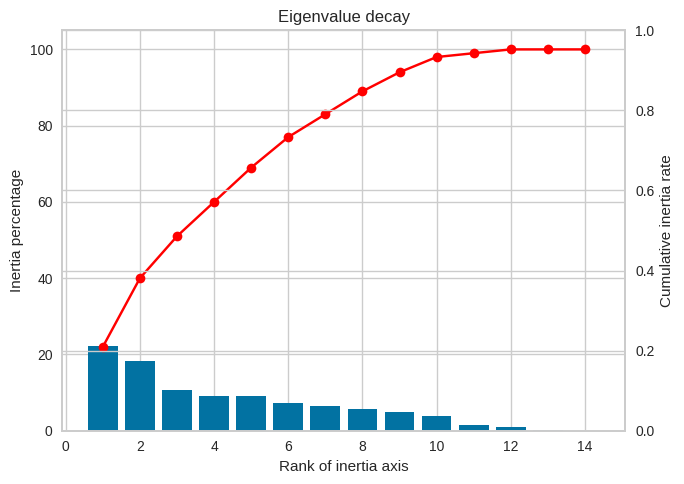

In [34]:
# Components list :
x_list = range(1, num_comp+1)

fig = plt.figure(figsize=(7, 5))

plt.bar(x_list, scree)
plt.plot(x_list, scree_cum, c="red", marker='o')
ax1 = plt.gca()
ax2 = ax1.twinx()
ax2.set_ylabel("Cumulative inertia rate")
ax1.set_xlabel("Rank of inertia axis")
ax1.set_ylabel("Inertia percentage")

plt.title("Eigenvalue decay")

plt.tight_layout()
plt.show(block=False)

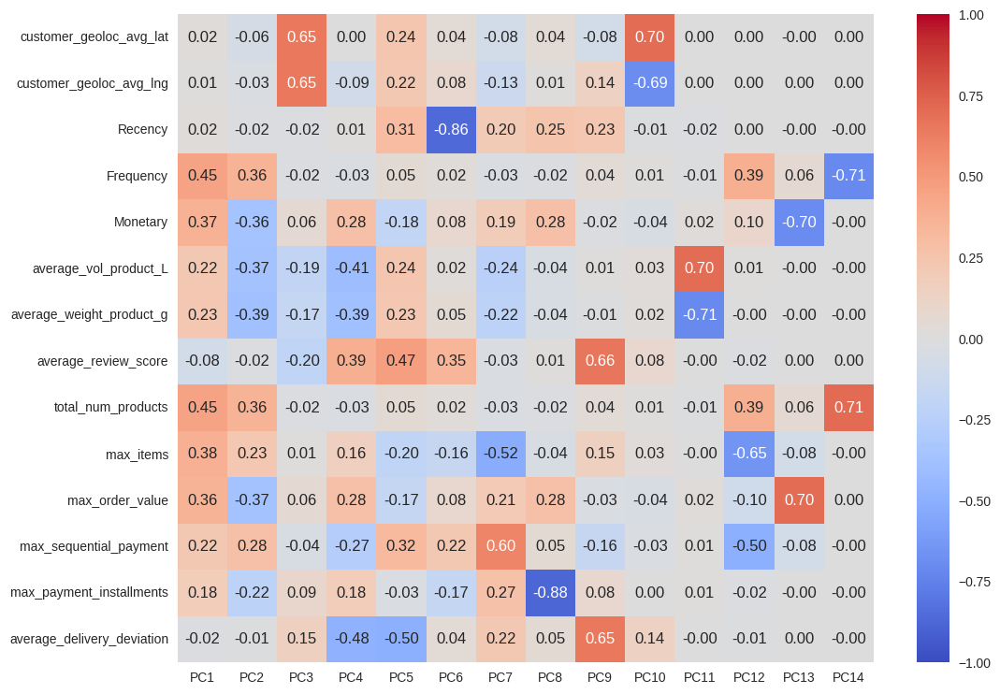

In [35]:
# ------------------------------------------------------
# Table with the proportion of the variability of each
# principal component explained by each variable
pcs = pd.DataFrame(pca.components_.round(2),
                   index=[f"PC{i}" for i in x_list],
                   columns=features_quanti).T

# -------------------------------------------------------------
# Correlation graph between variables and principal components
fig, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(pcs, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")
plt.show(block=False)

To retain 95% of the variability of the data, the first 10 components must be considered.
 * The two first components represent 33% of the variability. They result from the combination of several features, those are:
   * *Frequency*, *total number of products*, *max items*, *Moneteary*, *max order value*, *average volumn*, *average weight*, *max sequential payment* an *max payment installments*
 * The third component results from the combination of geolocation features, *latitude* and *longitude*
 * The fourth and fifth components share the variables that define them, although the weights are slightly different.
   * The most importants are : *delivery deviation*, *review score*, *average volumn*, *average weight* and *max sequential payment*
 * The sixth component results mainly from *Recency*
 

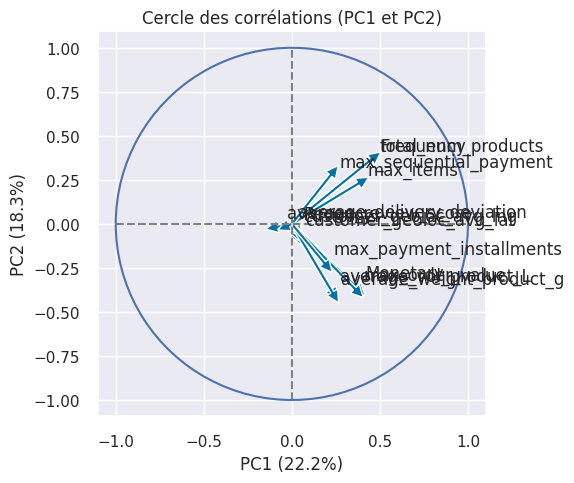

In [36]:
# --------------------------
# Correlation plot
# --------------------------
# PC1 et PC2
sns.set()
x_y = (0, 1)
correlation_graph(pca, x_y, features_quanti)

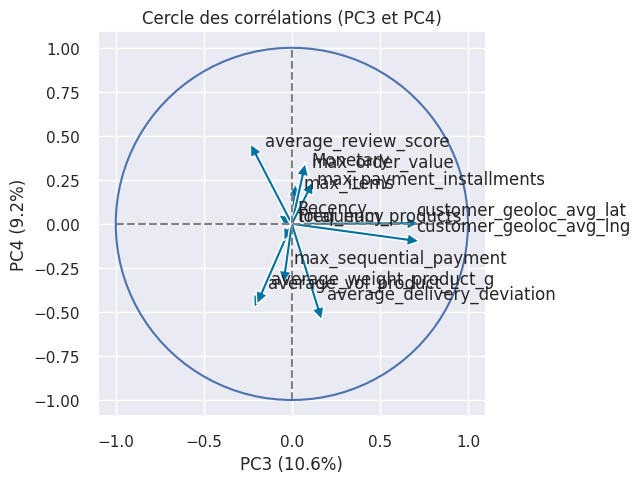

In [37]:
# PC3 et PC4
x_y = (2, 3)
correlation_graph(pca, x_y, features_quanti)

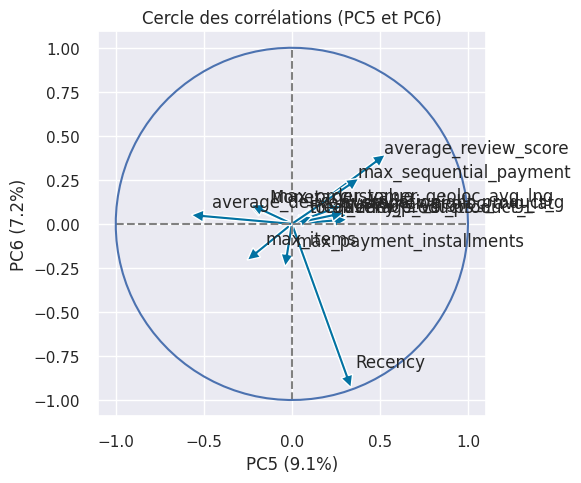

In [38]:
# PC5 et PC6
x_y = (4, 5)
correlation_graph(pca, x_y, features_quanti)

In [39]:
# PCA with 10 components
n_comp_log = 10
pca_10 = PCA(n_components=n_comp_log)
pca_10.fit(df_quanti_stdS)
X_quanti_pca_10 = pca_10.transform(df_quanti_stdS)

/tmp/ipykernel_44440/917686151.py:76: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, palette ="mako")


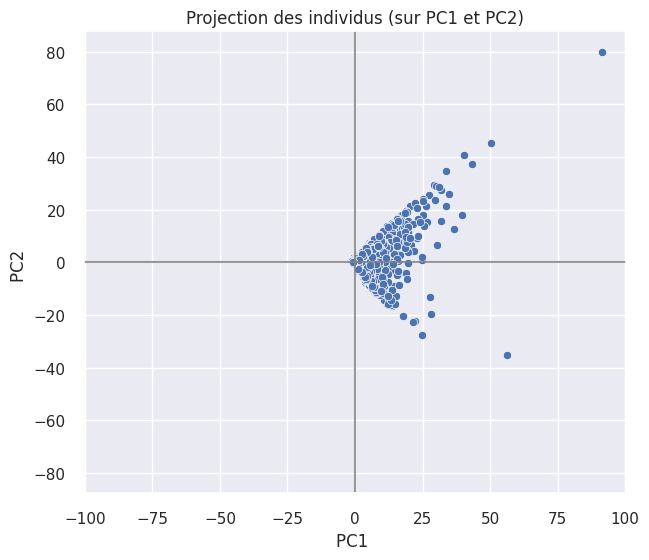

In [40]:
# -------------------
# Customers plotting over PC1 and PC2
x_y = [0, 1]
display_factorial_planes(X_quanti_pca_10, x_y, "blues", figsize=(7, 6))

/tmp/ipykernel_44440/917686151.py:76: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, palette ="mako")


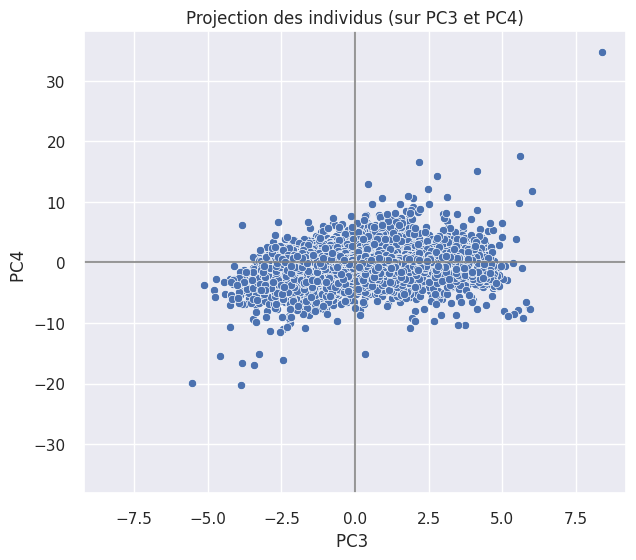

In [41]:
# -------------------
# Customers plotting over PC3 and PC4
x_y = [2, 3]
display_factorial_planes(X_quanti_pca_10, x_y, "blues", figsize=(7, 6))

/tmp/ipykernel_44440/917686151.py:76: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, palette ="mako")


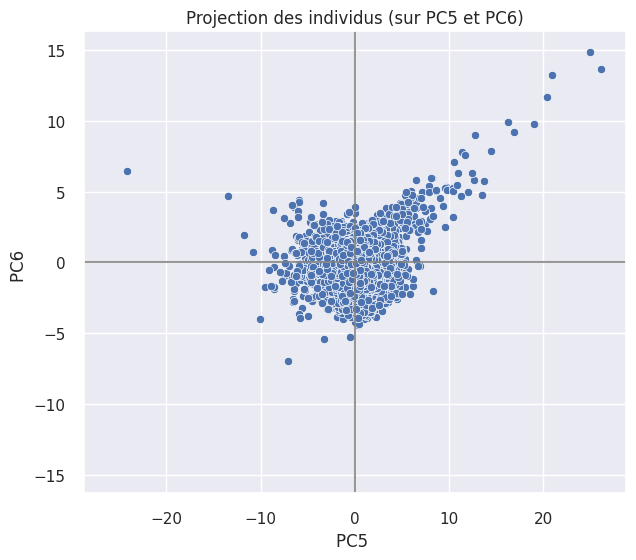

In [42]:
# -------------------
# Customers plotting over PC5 and PC6
x_y = [4, 5]
display_factorial_planes(X_quanti_pca_10, x_y, "blues", figsize=(7, 6))

<a id='pca_all'></a>

### <span style='background:#0075bc'><span style='color:white'>PCA : quantitative + qualitative features</span></span>


In [43]:
%pycodestyle_on

In [44]:
# ----------------------
# Number of components
num_comp = len(features_qq)
# -------------------
# PCA Instantiation:
pca = PCA(n_components=num_comp)
# ------------------------
# Scaled data training :
pca.fit(df_qq_stdS)

PCA(n_components=56)

In [45]:
# -------------------------------------
# Variance captured by each component
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()

# Components list :
x_list = range(1, num_comp+1)

In [46]:
scree_cum

array([  6.,  11.,  14.,  17.,  20.,  23.,  25.,  27.,  30.,  32.,  34.,
        36.,  38.,  40.,  42.,  44.,  46.,  48.,  50.,  52.,  54.,  56.,
        58.,  60.,  62.,  64.,  66.,  68.,  70.,  71.,  73.,  75.,  77.,
        79.,  81.,  82.,  84.,  86.,  88.,  89.,  91.,  93.,  94.,  95.,
        96.,  97.,  98.,  99., 100., 100., 100., 100., 100., 100., 100.,
       100.])

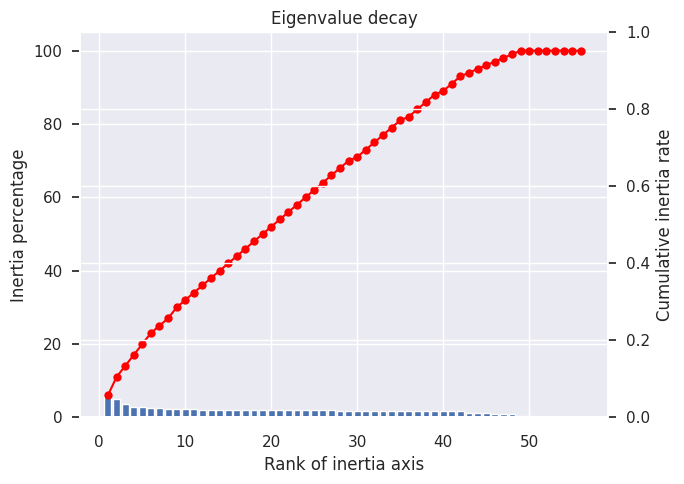

In [47]:
fig = plt.figure(figsize=(7, 5))

plt.bar(x_list, scree)
plt.plot(x_list, scree_cum, c="red", marker='o')
ax1 = plt.gca()
ax2 = ax1.twinx()
ax2.set_ylabel("Cumulative inertia rate")
ax1.set_xlabel("Rank of inertia axis")
ax1.set_ylabel("Inertia percentage")

plt.title("Eigenvalue decay")

plt.tight_layout()
plt.show(block=False)

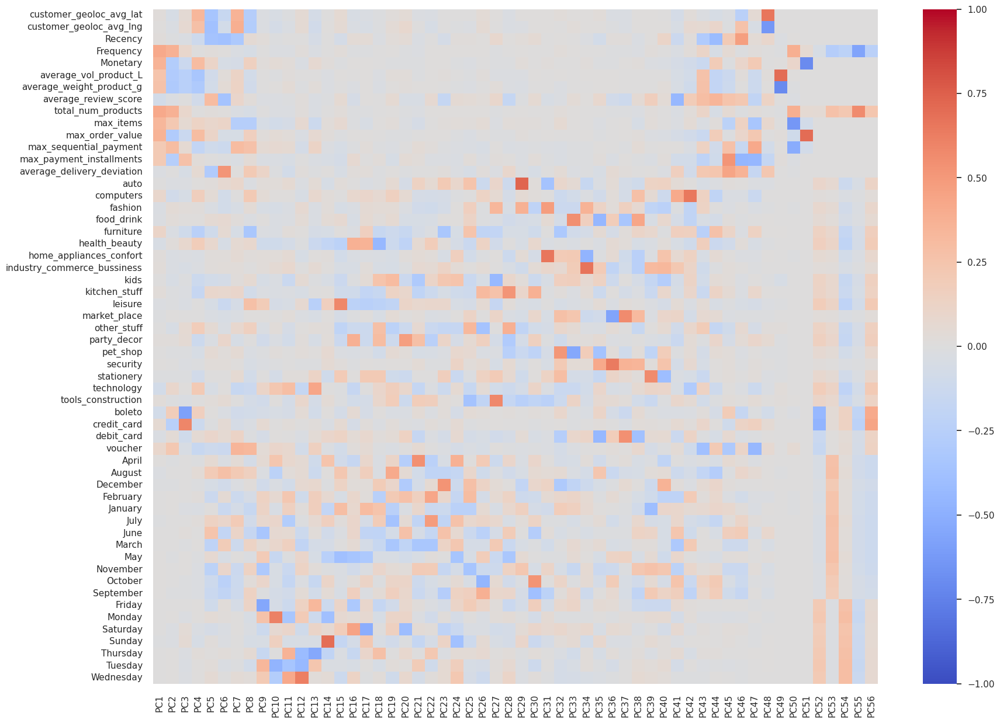

In [48]:
# -----------------------------------------------------
# Table with the proportion of the variability of each
# principal component explained by each variable
pcs = pd.DataFrame(pca.components_.round(2),
                   index=[f"PC{i}" for i in x_list],
                   columns=features_qq).T

# -------------------------------------------------------------
# Correlation graph between variables and principal components
fig, ax = plt.subplots(figsize=(20, 15))
sns.heatmap(pcs, vmin=-1, vmax=1, annot=False, cmap="coolwarm")
plt.show(block=False)

To retain 95% of the variability of the data, the first 44 components must be considered.<br>
The first 19 components retain 50% of the variability. <br>
The main characteristics of the first components are :
 * The first component represents mainly quantitative variables (except geolocation features and Recency)
 * The second component differs from the first one in that it also considers payment methods.
 * In the third component, the best represented features are those asociated to payment methods, some of the quantitative variables lose weight. 
 * The fourth and fith components, represent both the geolocation variables and with varying weights the other quantitative variables. The fourth component includes the quantitative variables of purchase category and the fifth one the date of purchase.
 * The sixth component represents mainly the deviation from the planned delivery date, the review score and the recency.
 

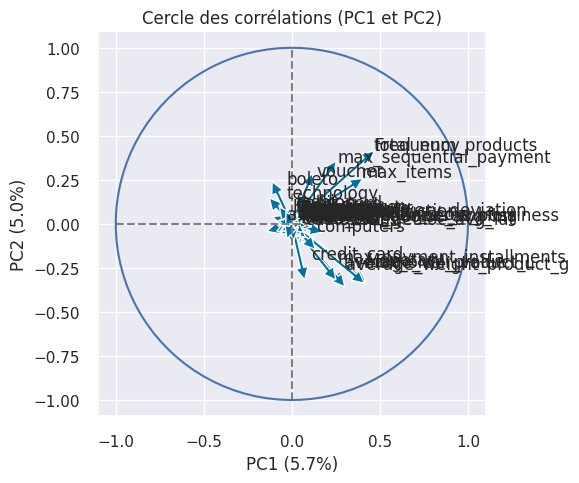

In [49]:
# --------------------------
# Correlation plot
# --------------------------
# PC1 et PC2
sns.set()
x_y = (0, 1)
correlation_graph(pca, x_y, features_qq)

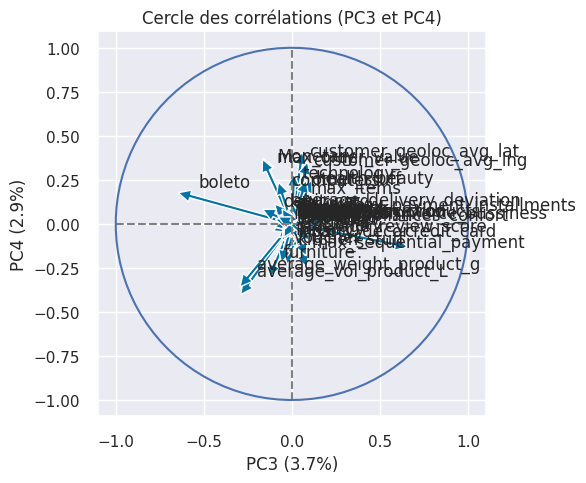

In [50]:
# PC3 et PC4
x_y = (2, 3)
correlation_graph(pca, x_y, features_qq)

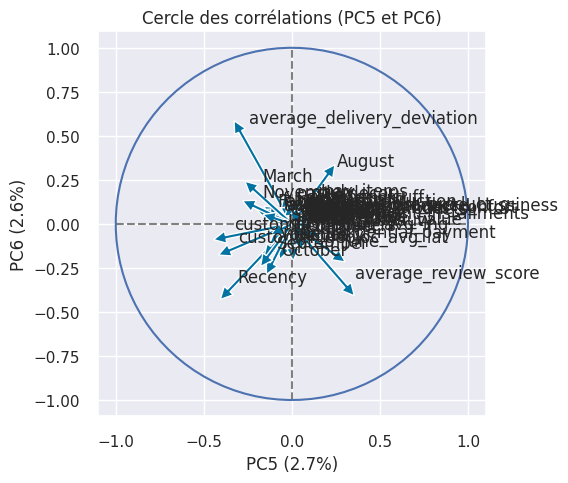

In [51]:
# PC5 et PC6
x_y = (4, 5)
correlation_graph(pca, x_y, features_qq)

In [52]:
# PCA with 33 components so we have at least 77% variability
n_comp_cat = 33
pca_33 = PCA(n_components=n_comp_cat)
pca_33.fit(df_qq_stdS)
X_qq_pca_33 = pca_33.transform(df_qq_stdS)

/tmp/ipykernel_44440/917686151.py:76: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, palette ="mako")


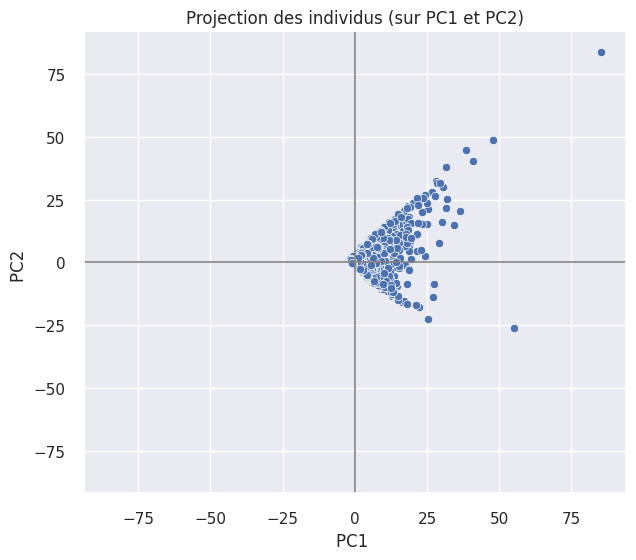

In [53]:
# -------------------
# Customers plotting over PC1 and PC2
x_y = [0, 1]
display_factorial_planes(X_qq_pca_33, x_y, "blues", figsize=(7, 6))

/tmp/ipykernel_44440/917686151.py:76: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, palette ="mako")


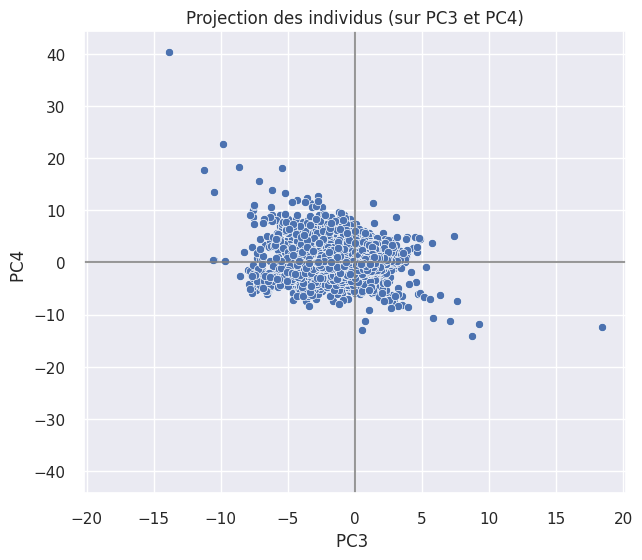

In [54]:
# -------------------
# Customers plotting over PC3 and PC4
x_y = [2, 3]
display_factorial_planes(X_qq_pca_33, x_y, "blues", figsize=(7, 6))

/tmp/ipykernel_44440/917686151.py:76: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, palette ="mako")


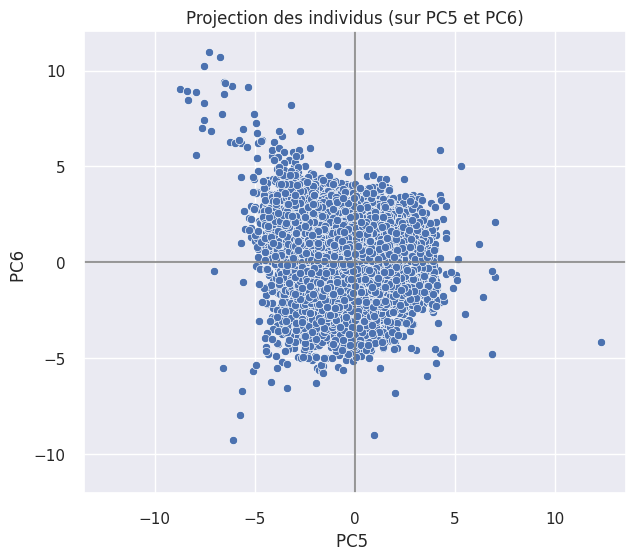

In [55]:
# -------------------
# Customers plotting over PC5 and PC6
x_y = [4, 5]
display_factorial_planes(X_qq_pca_33, x_y, "blues", figsize=(7, 6))

---
---

**PCA analysis**

---

The main differences between the PCA results of qualitative variables and both qualitative and quantitative variables are :
* The PCA analysis that takes into account qualitative variables requires many more components to explain an equivalent amount of variability.
* There is greater dispersion in the distribution of data after PCA that takes into account quantitative variables.


---
---
<a id="isomap"></a>

## <font color = '#0085dd'>Isomap</font>

Due to the excessive consumption of resources, it is not possible to apply Isomap on the whole set of data. <br>
The application of this method will be performed on the 10% subsample.

<a id='isomap_quanti'></a>

### <span style='background:#0075bc'><span style='color:white'>Isomap only quantitative features</span></span>


In [56]:
#
n_neighbors = 20
n_components = 2
embedding = Isomap(n_neighbors=n_neighbors, n_components=n_components)
X_projected_isomap = embedding.fit_transform(X_ss_quanti_stdS)

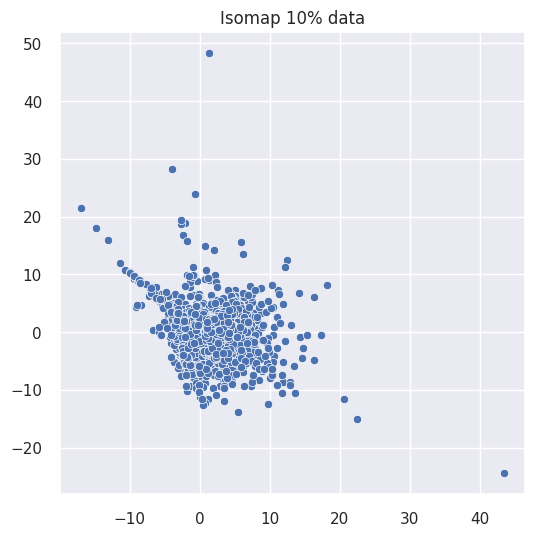

In [57]:
# Isomap Scatter Plot
plt.figure(figsize=[6, 6])

sns.scatterplot(x=X_projected_isomap[:, 0], y=X_projected_isomap[:, 1])
plt.title("Isomap 10% data")
plt.show()

<a id='isomap_quanti_quali'></a>

### <span style='background:#0075bc'><span style='color:white'>Isomap quantitative and qualitative features</span></span>


In [58]:
#
n_neighbors = 20
n_components = 2
embedding = Isomap(n_neighbors=n_neighbors, n_components=n_components)
X_projected_isomap = embedding.fit_transform(X_ss_qq_stdS)

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_isomap.py:324: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/home/raquelsp/anaconda3/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


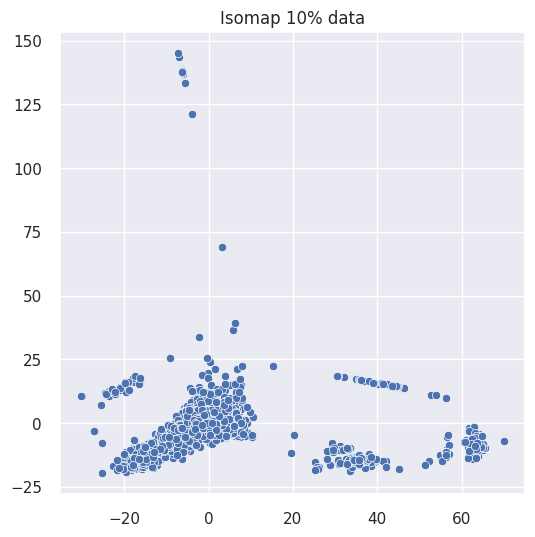

In [59]:
# Isomap Scatter Plot
plt.figure(figsize=[6, 6])

sns.scatterplot(x=X_projected_isomap[:, 0], y=X_projected_isomap[:, 1])
plt.title("Isomap 10% data")
plt.show()

---
---

**Isomap**

---

The main differences between the Isomap results of qualitative variables and both qualitative and quantitative variables are :
* The dispersion of the data is greater and more heterogeneous in the Isomap analysis that considers qualitative data.

**The calculation of isomap components is too expensive in resources to be applied to the entire dataset.**


---
---
<a id="tsne"></a>

## <font color = '#0085dd'>t-SNE</font>

**Hyper-parameters** :

- **n_components** : dimension of the embedded space (int, optional, default = 2)
- **perplexity** : perplexity is related to the number of nearest neighbors that is used in other multidimensional learning algorithms.Consider choosing a value between 5 and 50.  Different values can result in significantly different results (float, optional, default = 30). 
- **early_exaggeration** : Controls how tight natural clusters in the original space are in the embedded space and how much space will be between them. The choice of this parameter is not very critical (float, optional, default = 12).
- **learning_rate** : The learning rate for t-SNE is usually in the range [10.0, 1000.0]. The ‘auto’ option sets the learning_rate to max(N / early_exaggeration / 4, 50) where N is the sample size (float or “auto”, optional, default=”auto”).
- **n_iter** : Maximum number of iterations for the optimization. Should be at least 250 (int, optional, default = 1000).
- **metric** : The metric to use when calculating distance between instances in a feature array. The default is “euclidean” which is interpreted as squared euclidean distance (str or callable, optional, default=’euclidean’).
- **init** : Initialization of embedding. PCA initialization cannot be used with precomputed distances and is usually more globally stable than random initialization {“random”, “pca”} or ndarray of shape (n_samples, n_components), optional, default=”pca”.
- **verbose** : Verbosity level (int, optional, default=0).
- **random_state** : Determines the random number generator (int, RandomState instance or None, optional, default=None).


<a id='tsne_quanti_withoutPCA'></a>

### <span style='background:#0075bc'><span style='color:white'>t-SNE, quantitative data without PCA embedding initialization</span></span>


In [60]:
# t-SNE tunning perplexity hyperparameter without PCA embedding initialization
start_chrono = time.time()
seed = 84

perplexity_values = [5, 10, 20, 30, 40, 50]
results_quanti_list = list()
tsne_quanti_results = []
for i in perplexity_values:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=750,
                init="random", random_state=seed)
    tsne_quanti_results = tsne.fit_transform(X_quanti)
    results_quanti_list.append(tsne_quanti_results)
print("t-SNE ended! in : {} seconds".format(time.time()-start_chrono))

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.162s...
[t-SNE] Computed neighbors for 91160 samples in 2.282s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sam

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 3.100s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 91160

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 4.232s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 91160

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Indexed 91160 samples in 0.260s...
[t-SNE] Computed neighbors for 91160 samples in 5.733s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditi

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 6.497s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 91160

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 7.639s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 91160

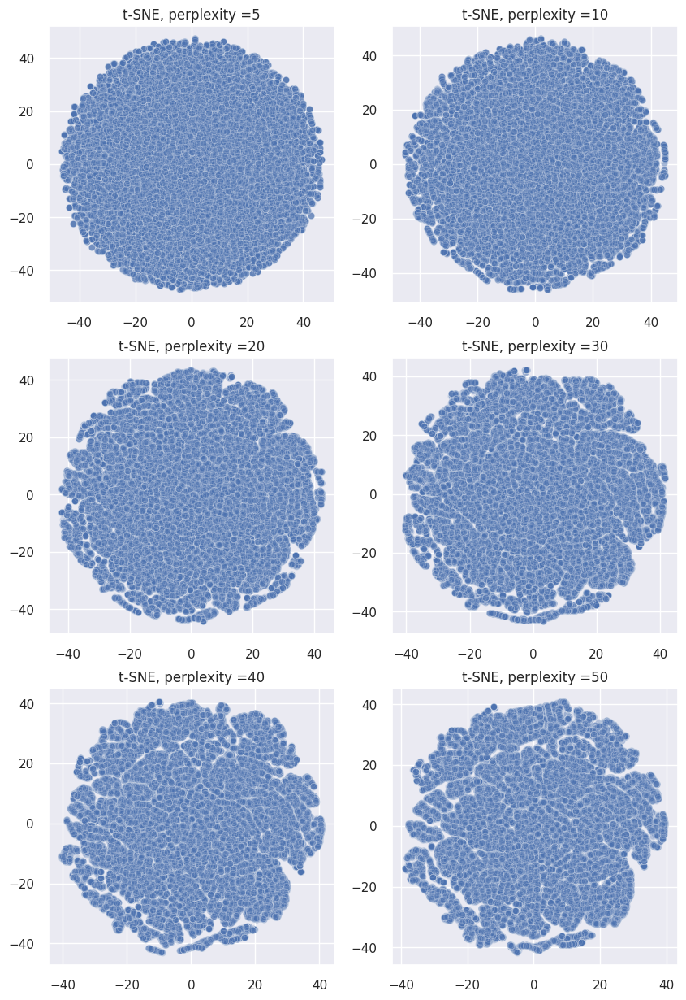

In [61]:
# Scatter plot t-SNE results
plt.subplots(3, 2, figsize=[10, 15])

i = 0
for resultat_tsne in results_quanti_list:
    plt.subplot(3, 2, i + 1)
    tsne_results_quanti_i = results_quanti_list[i]
    sns.scatterplot(x=tsne_results_quanti_i[:, 0],
                    y=tsne_results_quanti_i[:, 1],
                    alpha=0.2)
    plt.title("t-SNE, perplexity =" + str(perplexity_values[i]))
    plt.plot()
    i += 1

plt.show()

<a id='tsne_quanti_quali_withoutPCA'></a>

### <span style='background:#0075bc'><span style='color:white'>t-SNE, quantiquali data without PCA embedding initialization</span></span>


In [62]:
# t-SNE tunning perplexity hyperparameter without PCA embedding initialization

start_chrono = time.time()
seed = 84

perplexity_values = [5, 10, 20, 30, 40, 50]
results_qq_list = list()
tsne_results_qq = []
for i in perplexity_values:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=300,
                init="random", random_state=seed)
    tsne_results_qq = tsne.fit_transform(X_qq)
    results_qq_list.append(tsne_results_qq)
print("t-SNE ended! in : {} seconds".format(time.time()-start_chrono))

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.003s...
[t-SNE] Computed neighbors for 91160 samples in 177.739s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for s

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 175.633s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 911

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 168.220s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 911

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 168.216s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 911

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 170.672s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 911

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 170.071s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 911

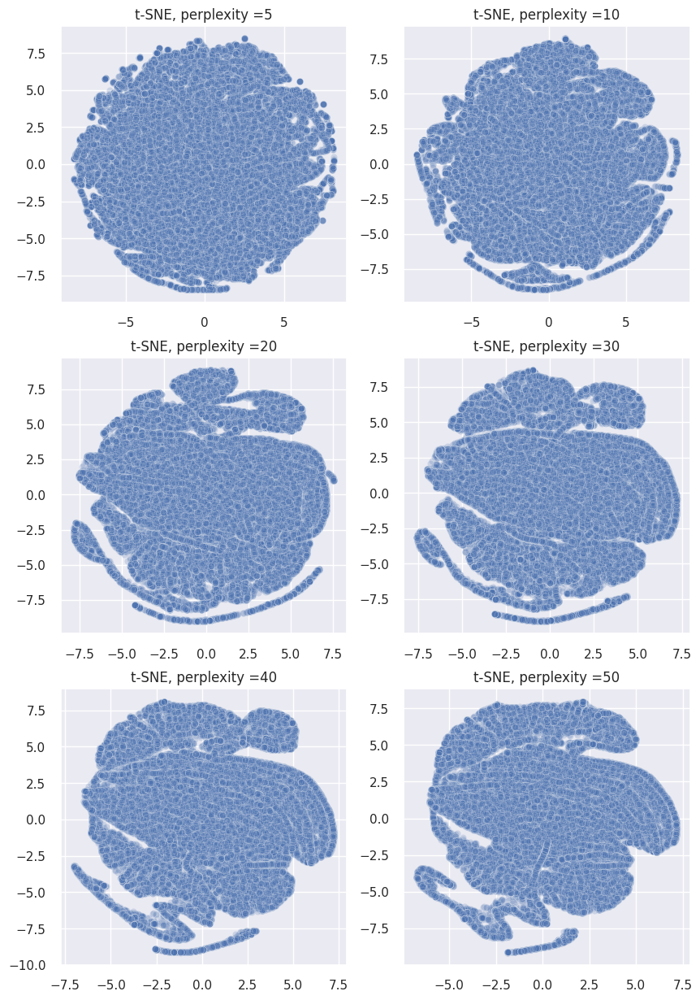

In [63]:
# Scatter plot t-SNE results
plt.subplots(3, 2, figsize=[10, 15])

i = 0
for resultat_tsne in results_qq_list:
    plt.subplot(3, 2, i + 1)
    tsne_results_qq_i = results_qq_list[i]
    sns.scatterplot(x=tsne_results_qq_i[:, 0],
                    y=tsne_results_qq_i[:, 1],
                    alpha=0.2)
    plt.title("t-SNE, perplexity =" + str(perplexity_values[i]))
    plt.plot()
    i += 1

plt.show()

<a id='tsne_withPCA'></a>

### <span style='background:#0075bc'><span style='color:white'>t-SNE with PCA embedding initialization</span></span>


In [64]:
# t-SNE tunning perplexity hyperparameter without PCA embedding initialization

start_chrono = time.time()

perplexity_values = [5, 10, 20, 30, 40, 50]
pca_results_quanti_list = list()
tsne_pca_quanti_results = []
for i in perplexity_values:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                init="pca", random_state=seed)
    tsne_pca_quanti_results = tsne.fit_transform(X_quanti)
    pca_results_quanti_list.append(tsne_pca_quanti_results)
print("t-SNE ended! in : {} seconds".format(time.time()-start_chrono))

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.161s...
[t-SNE] Computed neighbors for 91160 samples in 2.323s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sam

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.730515
[t-SNE] KL divergence after 500 iterations: 2.118338
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.147s...


/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 2.982s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 91160

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.653412
[t-SNE] KL divergence after 500 iterations: 2.185169
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.148s...


/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 4.135s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 91160

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.263000
[t-SNE] KL divergence after 500 iterations: 2.313730
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.147s...


/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 5.309s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 91160

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.118729
[t-SNE] KL divergence after 500 iterations: 2.413345
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.152s...


/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 6.136s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 91160

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.595047
[t-SNE] KL divergence after 500 iterations: 2.491605
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.150s...


/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 7.507s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 91160

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.719940
[t-SNE] KL divergence after 500 iterations: 2.550437
t-SNE ended! in : 1112.2880201339722 seconds


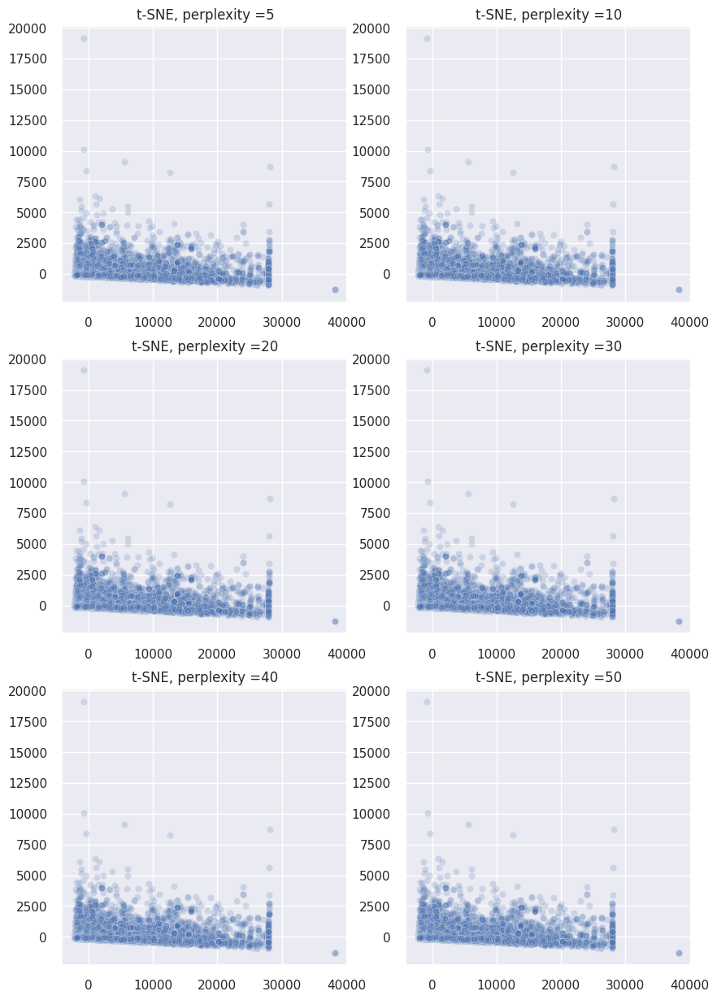

3:2: E225 missing whitespace around operator


In [65]:
# Scatter plot t-SNE results
plt.subplots(3, 2, figsize=[10, 15])
i=0

for resultat_tsne in pca_results_quanti_list:
    plt.subplot(3, 2, i + 1)
    tsne_pca_quanti_results = pca_results_quanti_list[i]
    sns.scatterplot(x=tsne_pca_quanti_results[:, 0],
                    y=tsne_pca_quanti_results[:, 1],
                    alpha=0.2)
    plt.title("t-SNE, perplexity =" + str(perplexity_values[i]))
    plt.plot()
    i += 1

plt.show()

<a id='tsne_withPCA'></a>

### <span style='background:#0075bc'><span style='color:white'>t-SNE with PCA embedding initialization</span></span>


In [66]:
# t-SNE tunning perplexity hyperparameter without PCA embedding initialization

start_chrono = time.time()

perplexity_values = [5, 10, 20, 30, 40, 50]
results_list_pca_pca = list()
tsne_results_pca_pca = []
for i in perplexity_values:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                init="pca", random_state=seed)
    tsne_results_pca_pca = tsne.fit_transform(X_quanti_pca_10)
    results_list_pca_pca.append(tsne_results_pca_pca)
print("t-SNE ended! in : {} seconds".format(time.time()-start_chrono))

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.116s...
[t-SNE] Computed neighbors for 91160 samples in 12.711s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sa

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 115.591431
[t-SNE] KL divergence after 500 iterations: 5.431201
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.110s...


/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 16.040s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 9116

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 110.686050
[t-SNE] KL divergence after 500 iterations: 4.955993
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.113s...


/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 21.474s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 9116

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 106.081802
[t-SNE] KL divergence after 500 iterations: 4.471698
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.111s...


/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 25.329s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 9116

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 103.597496
[t-SNE] KL divergence after 500 iterations: 4.191009
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.107s...


/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 28.677s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 9116

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 101.778625
[t-SNE] KL divergence after 500 iterations: 3.999651
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 91160 samples in 0.108s...


/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 91160 samples in 31.982s...
[t-SNE] Computed conditional probabilities for sample 1000 / 91160
[t-SNE] Computed conditional probabilities for sample 2000 / 91160
[t-SNE] Computed conditional probabilities for sample 3000 / 91160
[t-SNE] Computed conditional probabilities for sample 4000 / 91160
[t-SNE] Computed conditional probabilities for sample 5000 / 91160
[t-SNE] Computed conditional probabilities for sample 6000 / 91160
[t-SNE] Computed conditional probabilities for sample 7000 / 91160
[t-SNE] Computed conditional probabilities for sample 8000 / 91160
[t-SNE] Computed conditional probabilities for sample 9000 / 91160
[t-SNE] Computed conditional probabilities for sample 10000 / 91160
[t-SNE] Computed conditional probabilities for sample 11000 / 91160
[t-SNE] Computed conditional probabilities for sample 12000 / 91160
[t-SNE] Computed conditional probabilities for sample 13000 / 91160
[t-SNE] Computed conditional probabilities for sample 14000 / 9116

/home/raquelsp/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 100.346497
[t-SNE] KL divergence after 500 iterations: 3.839084
t-SNE ended! in : 925.8647541999817 seconds


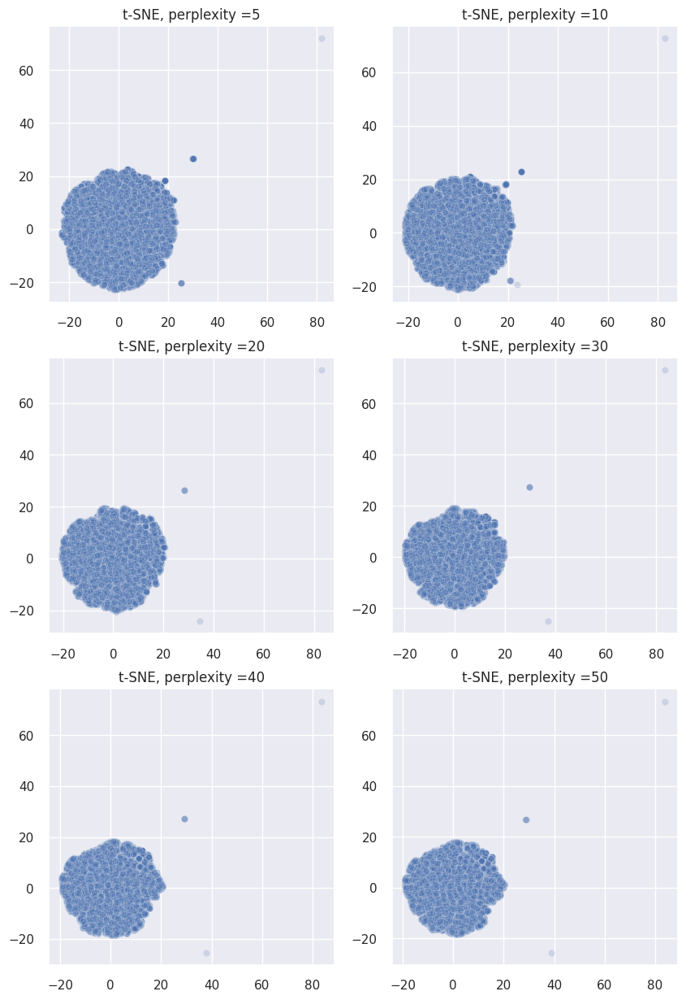

In [67]:
# Scatter plot t-SNE results
plt.subplots(3, 2, figsize=[10, 15])
i = 0

for result_tsne in results_list_pca_pca:
    plt.subplot(3, 2, i + 1)
    tsne_results_pca_pca_i = results_list_pca_pca[i]
    sns.scatterplot(x=tsne_results_pca_pca_i[:, 0],
                    y=tsne_results_pca_pca_i[:, 1],
                    alpha=0.2)
    plt.title("t-SNE, perplexity =" + str(perplexity_values[i]))
    plt.plot()
    i += 1

plt.show()

---

<a id="dimens_reduc_conclusions"></a>

## <font color = '#0085dd'>Dimensionality reduction conclusions</font>


 * **Dimensionality reduction methods for data analysis**
   * The PCA analysis of quantitative variables requires 10 components to explain 95% of variance.
   * The PCA analysis that takes into account qualitative variables requires many more components to explain an equivalent amount of variability, but the dispersion of data in the PCA scatterplot is higher.
 
 * **Dimensionality reduction methods for data visualization**
   * None of the tested methods results in a highly dispersed patchy scatterplot 
   * Data dispersion is greater and more patchy in the Isomap analysis that considers quantitative and qualitative data.
   * The best results in the t-SNE analysis result from the analysis of quantitative and qualitative data without PCA embedding and a perplexity of 50.

<a id="rfm_cluster_test"></a>

---
---

# <font color = '#26467a'>**RFM Clustering tests** </font>
    


<a id='K_means_rfm'></a>

## <font color = '#0085dd'>RFM K-means clustering </font>

<a id='k_tunning'></a>

### <span style='background:#0075bc'><span style='color:white'>*k* tunning</span></span>


In [31]:
# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_rfm = pd.DataFrame()

In [32]:
# RFM, K-means metrics
# Data scaled with MinMaxScaler
# Parameters to test
nb_clusters = range(3, 12)
n_init = [10]
init = ["k-means++"]
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfm = compute_kmeans_metrics(X_rfm_ss_MM,
                                          df_Kmeans_ss_rfm,
                                          "RFM subsample", "MinMax",
                                          seed, nb_clusters,
                                          n_init, init)
# df_Kmeans_ss_rfm.head().style.hide(axis='index')

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d89bdf70>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [33]:
# RFM, K-means metrics
# Data scaled with RobustScaler
# Parameters to test
nb_clusters = range(3, 12)
n_init = [10]
init = ["k-means++"]
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfm = compute_kmeans_metrics(X_rfm_ss_RS,
                                          df_Kmeans_ss_rfm,
                                          "RFM subsample", "RobustScaler",
                                          seed, nb_clusters,
                                          n_init, init)
# df_Kmeans_ss_rfm.head().style.hide(axis='index')

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d89bddc0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [34]:
# RFM, K-means metrics
# Data scaled with StandardScaler
# Parameters to test
nb_clusters = range(3, 12)
n_init = [10]
init = ["k-means++"]
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfm = compute_kmeans_metrics(X_rfm_ss_stdS,
                                          df_Kmeans_ss_rfm,
                                          "RFM subsample", "StandardScaler",
                                          seed, nb_clusters,
                                          n_init, init)
# df_Kmeans_ss_rfm.head().style.hide(axis='index')

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d9243430>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [35]:
# ------------------------------
# RFM Visualization dataframes
# ------------------------------
df_Kmeans_ss_rfm_MM = \
    df_Kmeans_ss_rfm[df_Kmeans_ss_rfm["Scaler"] == "MinMax"]
df_Kmeans_ss_rfm_RS = \
    df_Kmeans_ss_rfm[df_Kmeans_ss_rfm["Scaler"] == "RobustScaler"]
df_Kmeans_ss_rfm_stdS = \
    df_Kmeans_ss_rfm[df_Kmeans_ss_rfm["Scaler"] == "StandardScaler"]

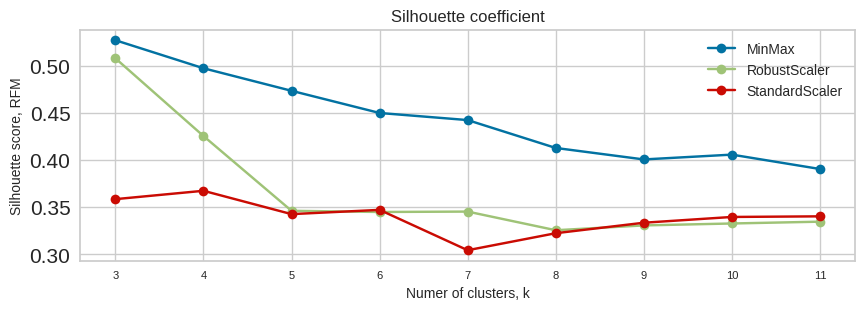

In [36]:
# Silhouette plotting : the closer to 1 the better
"""Silhouette"""

plt.figure(figsize=(10, 3))

plt.title("Silhouette coefficient", fontsize=12)
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_rfm_MM["coef_silh"].to_list(), marker='o')
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_rfm_RS["coef_silh"].to_list(), marker='o')
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_rfm_stdS["coef_silh"].to_list(), marker='o')
plt.grid(True)
plt.xlabel("Numer of clusters, k", fontsize=10)
plt.ylabel("Silhouette score, RFM", fontsize=10)
plt.xticks([i for i in range(3, 12)], fontsize=8)
plt.yticks(fontsize=15)
plt.legend(labels=["MinMax", "RobustScaler", "StandardScaler"])

plt.show()

Silhouette plotting : the closer to 1 the better

**Best silhouette coefficient** with  *k=*
 * MinMax Scaler : 3-4
 * Robust Scaler : 3-4
 * Standard Scaler 3-4


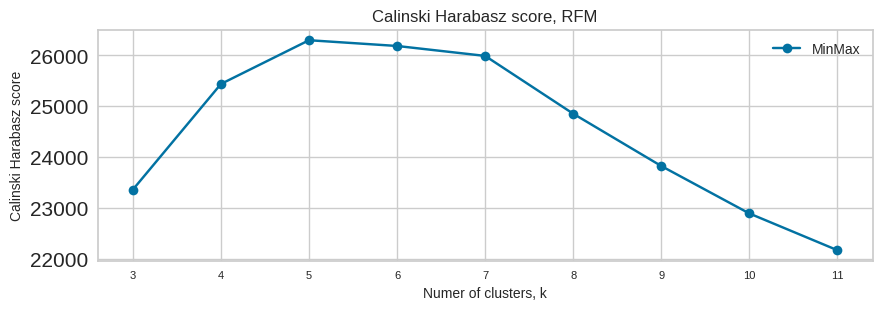

In [37]:
# Calinski Harabasz score plotting :
# The higher the score , the better the performances.
"""Calinski_Harabasz"""

plt.figure(figsize=(10, 3))

plt.title("Calinski Harabasz score, RFM", fontsize=12)
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_rfm_MM["Calinski_Harabasz"].to_list(), marker='o')

plt.grid(True)
plt.xlabel("Numer of clusters, k", fontsize=10)
plt.ylabel("Calinski Harabasz score", fontsize=10)
plt.xticks([i for i in range(3, 12)], fontsize=8)
plt.yticks(fontsize=15)
plt.legend(labels=["MinMax", "RobustScaler", "StandardScaler"])

plt.show()

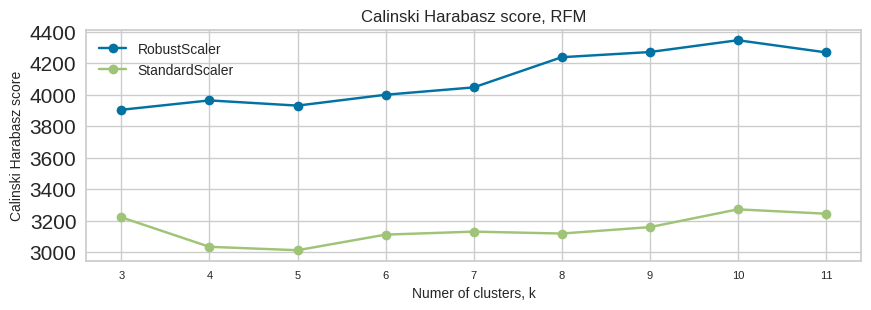

In [38]:
# Calinski Harabasz score plotting :
# The higher the score , the better the performances.
"""Calinski_Harabasz"""

plt.figure(figsize=(10, 3))

plt.title("Calinski Harabasz score, RFM", fontsize=12)

plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_rfm_RS["Calinski_Harabasz"].to_list(), marker='o')
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_rfm_stdS["Calinski_Harabasz"].to_list(), marker='o')
plt.grid(True)
plt.xlabel("Numer of clusters, k", fontsize=10)
plt.ylabel("Calinski Harabasz score", fontsize=10)
plt.xticks([i for i in range(3, 12)], fontsize=8)
plt.yticks(fontsize=15)
plt.legend(labels=["RobustScaler", "StandardScaler"])

plt.show()

 
**Calinski Harabasz score**, 
 * MinMax Scaler : 5
 * Robust Scaler : 4,6
 * Standard Scaler : 7


---
---

**Review** :
***

The different indices give different optimal k. Depending on the climber used the optimum k varies.

 * MinMax Scaler
   * Silhouette coefficient k = 3-4
   * Elbow in Calinski Harabasz score k = 5 <br>   
<br>

 * Robust Scaler
   * Silhouette coefficient k = 3-4
   * Elbow in Calinski Harabasz score k = 4, 6 <br>   
<br> 

 * Standard Scaler
   * Silhouette coefficient k = 3-5
   * Elbow in Calinski Harabasz score k = 7 <br>  
<br> 

 **The retained k values are**

* MinMax Scaler k = 3-5
* Robust Scaler k = 3, 4,6
* Standard Scaler k = 3-4, 7


<a id='nInit_methodInit_tunning'></a>

### <span style='background:#0075bc'><span style='color:white'>Method of initialization and number of clusters to initialize, tunning</span></span>


In [39]:
# --------------------
# MinMax Scaler, k=3
# --------------------
# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_rfmMM_3 = pd.DataFrame()

# Parameters to test
nb_clusters = [3]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfmMM_3 = compute_kmeans_metrics(X_rfm_ss_MM,
                                              df_Kmeans_ss_rfmMM_3,
                                              "RFM subsample", "MinMax",
                                              seed,
                                              nb_clusters, n_init, init)
# df_Kmeans_ss_rfmMM_3.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_rfmMM_3.sort_values(by=["coef_silh"],
                                         ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d864c280>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
0,RFM subsample,MinMax,3,10,k-means++,0.5273,71.747305,0.588608,23360.699121,1.430053
2,RFM subsample,MinMax,3,20,k-means++,0.5273,71.747305,0.588608,23360.699121,3.012821
4,RFM subsample,MinMax,3,30,k-means++,0.5273,71.747305,0.588608,23360.699121,4.567314
6,RFM subsample,MinMax,3,50,k-means++,0.5273,71.747305,0.588608,23360.699121,8.880307
8,RFM subsample,MinMax,3,70,k-means++,0.5273,71.747305,0.588608,23360.699121,10.113424


In [40]:
# --------------------
# MinMax Scaler, k=4
# --------------------
# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_rfmMM_4 = pd.DataFrame()

# Parameters to test
nb_clusters = [4]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfmMM_4 = compute_kmeans_metrics(X_rfm_ss_MM,
                                              df_Kmeans_ss_rfmMM_4,
                                              "RFM subsample", "MinMax",
                                              seed,
                                              nb_clusters, n_init, init)
# df_Kmeans_ss_rfmMM_4.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_rfmMM_4.sort_values(by=["coef_silh"],
                                         ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d865e160>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
1,RFM subsample,MinMax,4,10,random,0.497624,46.888095,0.611706,25438.485051,0.076764
3,RFM subsample,MinMax,4,20,random,0.497624,46.888095,0.611706,25438.485051,0.240570
5,RFM subsample,MinMax,4,30,random,0.497624,46.888095,0.611706,25438.485051,0.596248
0,RFM subsample,MinMax,4,10,k-means++,0.497561,46.887505,0.611580,25438.988183,1.527862
2,RFM subsample,MinMax,4,20,k-means++,0.497561,46.887505,0.611580,25438.988183,3.377924


In [41]:
# --------------------
# MinMax Scaler, k=5
# --------------------
# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_rfmMM_5 = pd.DataFrame()

# Parameters to test
nb_clusters = [5]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfmMM_5 = compute_kmeans_metrics(X_rfm_ss_MM,
                                              df_Kmeans_ss_rfmMM_5,
                                              "RFM subsample", "MinMax",
                                              seed,
                                              nb_clusters, n_init, init)
# df_Kmeans_ss_rfmMM_5.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_rfmMM_5.sort_values(by=["coef_silh"],
                                         ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d8607e50>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
6,RFM subsample,MinMax,5,50,k-means++,0.474518,35.026104,0.636731,26308.784396,8.681911
7,RFM subsample,MinMax,5,50,random,0.474518,35.026018,0.636731,26308.784396,0.707055
9,RFM subsample,MinMax,5,70,random,0.474518,35.026018,0.636731,26308.784396,1.038020
8,RFM subsample,MinMax,5,70,k-means++,0.474504,35.026034,0.636721,26308.778343,12.040034
2,RFM subsample,MinMax,5,20,k-means++,0.474408,35.028482,0.636618,26308.845023,3.983947


In [42]:
# --------------------
# Robust Scaler, k=3
# --------------------
df_Kmeans_ss_rfmRS_3 = pd.DataFrame()

# Parameters to test
nb_clusters = [3]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfmRS_3 = compute_kmeans_metrics(X_rfm_ss_RS,
                                              df_Kmeans_ss_rfmRS_3,
                                              "RFM subsample", "RobustScaler",
                                              seed,
                                              nb_clusters, n_init, init)

print("\n Silhouette sorting")
display(df_Kmeans_ss_rfmRS_3.sort_values(by=["coef_silh"],
                                         ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d8607e50>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
0,RFM subsample,RobustScaler,3,10,k-means++,0.508149,24607.097794,0.943795,3904.899736,1.701061
2,RFM subsample,RobustScaler,3,20,k-means++,0.508149,24607.097794,0.943795,3904.899736,3.084819
4,RFM subsample,RobustScaler,3,30,k-means++,0.508149,24607.097794,0.943795,3904.899736,6.469400
6,RFM subsample,RobustScaler,3,50,k-means++,0.508149,24607.097794,0.943795,3904.899736,7.780165
8,RFM subsample,RobustScaler,3,70,k-means++,0.508149,24607.097794,0.943795,3904.899736,10.594079


In [43]:
# --------------------
# Robust Scaler, k=4
# --------------------
df_Kmeans_ss_rfmRS_4 = pd.DataFrame()

# Parameters to test
nb_clusters = [4]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfmRS_4 = compute_kmeans_metrics(X_rfm_ss_RS,
                                              df_Kmeans_ss_rfmRS_4,
                                              "RFM subsample", "RobustScaler",
                                              seed,
                                              nb_clusters, n_init, init)

print("\n Silhouette sorting")
display(df_Kmeans_ss_rfmRS_4.sort_values(by=["coef_silh"],
                                         ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d86194c0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
2,RFM subsample,RobustScaler,4,20,k-means++,0.453503,19713.69639,0.894228,4003.132003,2.937228
3,RFM subsample,RobustScaler,4,20,random,0.453503,19713.69639,0.894228,4003.132003,0.561087
4,RFM subsample,RobustScaler,4,30,k-means++,0.453503,19713.69639,0.894228,4003.132003,4.279359
5,RFM subsample,RobustScaler,4,30,random,0.453503,19713.69639,0.894228,4003.132003,1.922248
6,RFM subsample,RobustScaler,4,50,k-means++,0.453503,19713.69639,0.894228,4003.132003,7.621403


In [44]:
# --------------------
# Robust Scaler, k=6
# --------------------
df_Kmeans_ss_rfmRS_6 = pd.DataFrame()

# Parameters to test
nb_clusters = [6]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfmRS_6 = compute_kmeans_metrics(X_rfm_ss_RS,
                                              df_Kmeans_ss_rfmRS_6,
                                              "RFM subsample", "RobustScaler",
                                              seed,
                                              nb_clusters, n_init, init)

print("\n Silhouette sorting")
display(df_Kmeans_ss_rfmRS_6.sort_values(by=["coef_silh"],
                                         ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d864ce50>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
9,RFM subsample,RobustScaler,6,70,random,0.345126,14299.285150,0.918628,4000.481213,1.932011
0,RFM subsample,RobustScaler,6,10,k-means++,0.345088,14299.015129,0.918835,4000.551569,1.685547
2,RFM subsample,RobustScaler,6,20,k-means++,0.345088,14299.015129,0.918835,4000.551569,3.482932
4,RFM subsample,RobustScaler,6,30,k-means++,0.345088,14299.015129,0.918835,4000.551569,4.502399
6,RFM subsample,RobustScaler,6,50,k-means++,0.345084,14083.945877,0.904852,4089.445010,8.754591


In [45]:
# --------------------
# Standard Scaler, k=3
# --------------------
df_Kmeans_ss_rfmstd_3 = pd.DataFrame()

# Parameters to test
nb_clusters = [3]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfmstd_3 = compute_kmeans_metrics(X_rfm_ss_stdS,
                                               df_Kmeans_ss_rfmstd_3,
                                               "RFM subsample",
                                               "StandardScaler",
                                               seed,
                                               nb_clusters, n_init, init)

print("\n Silhouette sorting")
display(df_Kmeans_ss_rfmstd_3.sort_values(by=["coef_silh"],
                                          ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d864c940>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
1,RFM subsample,StandardScaler,3,10,random,0.358812,16021.365600,1.063900,3221.324156,0.273173
0,RFM subsample,StandardScaler,3,10,k-means++,0.358709,16021.322327,1.060855,3221.347980,1.508533
2,RFM subsample,StandardScaler,3,20,k-means++,0.358709,16021.322327,1.060855,3221.347980,4.130012
4,RFM subsample,StandardScaler,3,30,k-means++,0.358702,16021.320226,1.060613,3221.340837,4.362227
3,RFM subsample,StandardScaler,3,20,random,0.358694,16021.312894,1.060634,3221.341195,0.437611


In [46]:
# --------------------
# Standard Scaler, k=4
# --------------------
df_Kmeans_ss_rfmstd_4 = pd.DataFrame()

# Parameters to test
nb_clusters = [4]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfmstd_4 = compute_kmeans_metrics(X_rfm_ss_stdS,
                                               df_Kmeans_ss_rfmstd_4,
                                               "RFM subsample",
                                               "StandardScaler",
                                               seed,
                                               nb_clusters, n_init, init)

print("\n Silhouette sorting")
display(df_Kmeans_ss_rfmstd_4.sort_values(by=["coef_silh"],
                                          ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d864c790>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
1,RFM subsample,StandardScaler,4,10,random,0.372023,13700.660596,1.017855,3025.562152,0.451416
0,RFM subsample,StandardScaler,4,10,k-means++,0.367580,13681.989290,1.028822,3033.786339,1.475159
3,RFM subsample,StandardScaler,4,20,random,0.367571,13681.990697,1.028812,3033.786840,0.354725
5,RFM subsample,StandardScaler,4,30,random,0.367571,13681.990697,1.028812,3033.786840,0.642139
7,RFM subsample,StandardScaler,4,50,random,0.367571,13681.990697,1.028812,3033.786840,0.672323


In [47]:
# --------------------
# Standard Scaler, k=5
# --------------------
df_Kmeans_ss_rfmstd_5 = pd.DataFrame()

# Parameters to test
nb_clusters = [5]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfmstd_5 = compute_kmeans_metrics(X_rfm_ss_stdS,
                                               df_Kmeans_ss_rfmstd_5,
                                               "RFM subsample",
                                               "StandardScaler",
                                               seed,
                                               nb_clusters, n_init, init)

print("\n Silhouette sorting")
display(df_Kmeans_ss_rfmstd_5.sort_values(by=["coef_silh"],
                                          ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d865e0d0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
1,RFM subsample,StandardScaler,5,10,random,0.343158,11767.296892,1.018394,3015.896244,0.459601
2,RFM subsample,StandardScaler,5,20,k-means++,0.343158,11767.296892,1.018394,3015.896244,3.041000
4,RFM subsample,StandardScaler,5,30,k-means++,0.343158,11767.296892,1.018394,3015.896244,4.988239
6,RFM subsample,StandardScaler,5,50,k-means++,0.343158,11767.296892,1.018394,3015.896244,8.280148
8,RFM subsample,StandardScaler,5,70,k-means++,0.343158,11767.296892,1.018394,3015.896244,11.827532


In [48]:
# ----------------------
# Standard Scaler, k=6
# ----------------------
df_Kmeans_ss_rfmstd_6 = pd.DataFrame()

# Parameters to test
nb_clusters = [6]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_rfmstd_6 = compute_kmeans_metrics(X_rfm_ss_stdS,
                                               df_Kmeans_ss_rfmstd_6,
                                               "RFM subsample",
                                               "StandardScaler",
                                               seed,
                                               nb_clusters, n_init, init)

print("\n Silhouette sorting")
display(df_Kmeans_ss_rfmstd_6.sort_values(by=["coef_silh"],
                                          ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d865e0d0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
3,RFM subsample,StandardScaler,6,20,random,0.348729,10236.692836,0.966999,3045.617698,0.682890
5,RFM subsample,StandardScaler,6,30,random,0.348729,10236.692836,0.966999,3045.617698,0.787311
7,RFM subsample,StandardScaler,6,50,random,0.348729,10236.692836,0.966999,3045.617698,1.062617
9,RFM subsample,StandardScaler,6,70,random,0.348729,10236.692836,0.966999,3045.617698,1.335795
2,RFM subsample,StandardScaler,6,20,k-means++,0.347392,10099.762632,0.937384,3111.587146,4.192937


In all the tests performed, the coefficient values obtained are similar.<br>
**We will work with the default values** :

* n_init = 10
* init = 'k-means ++'

---
---
<a id='dbscan_rfm'></a>

## <font color = '#0085dd'>RFM DBScan </font>

In [49]:
# ------------------------------------
# Data normalization - MinMax scaler
# ------------------------------------
df_dbscan_ss_rfmMM = pd.DataFrame()

eps_space_range = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1]
samples_spc_rng = [3, 5, 10, 15, 20, 30, 40, 50]

# Imputting function parameters
df_dbscan_ss_rfmMM = dbscan_grid_search(X_data=X_rfm_ss_MM,
                                        analyzed_data="RFM subsample",
                                        scaling="MinMax Scaler",
                                        dataframe_metrics=df_dbscan_ss_rfmMM,
                                        eps_space=eps_space_range,
                                        min_samples_space=samples_spc_rng,
                                        min_clust=3,
                                        max_clust=8)

print("\n Silhouette sorting")
display(df_dbscan_ss_rfmMM.sort_values(by=["coef_silh"],
                                       ascending=[False]).head())


 Silhouette sorting


,Analyzed_data,Scaler,Num_cluster,eps,min_samples,coef_silh,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
2,RFM subsample,MinMax Scaler,4,0.10,3,0.238257,1.571184,91.167718,0.381440
1,RFM subsample,MinMax Scaler,4,0.05,5,0.125221,1.408769,96.132924,0.230014
0,RFM subsample,MinMax Scaler,7,0.05,3,0.101156,2.217949,71.029682,0.293728


In [50]:
# ------------------------------------
# Data normalization - RobustScaler
# ------------------------------------
df_dbscan_ss_rfmRS = pd.DataFrame()

eps_space_range = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]
samples_spc_rng = [3, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Imputting function parameters
df_dbscan_ss_rfmRS = dbscan_grid_search(X_data=X_rfm_ss_RS,
                                        analyzed_data="RFM subsample",
                                        scaling="RobustScaler",
                                        dataframe_metrics=df_dbscan_ss_rfmRS,
                                        eps_space=eps_space_range,
                                        min_samples_space=samples_spc_rng,
                                        min_clust=3,
                                        max_clust=8)

print("\n Silhouette sorting")
display(df_dbscan_ss_rfmRS.sort_values(by=["coef_silh"],
                                       ascending=[False]).head())


 Silhouette sorting


,Analyzed_data,Scaler,Num_cluster,eps,min_samples,coef_silh,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
21,RFM subsample,RobustScaler,4,1.5,3,0.794511,1.827823,747.164600,0.556307
22,RFM subsample,RobustScaler,4,2.0,5,0.794089,1.596522,763.738232,0.569556
20,RFM subsample,RobustScaler,4,1.0,10,0.752532,1.563879,890.838999,0.355833
14,RFM subsample,RobustScaler,7,0.5,20,0.230396,2.315450,1203.294260,0.150216
15,RFM subsample,RobustScaler,7,0.5,25,0.228788,2.264783,1189.608287,0.179008


In [51]:
# --------------------------------------
# Data normalization - Standard Scaler
# --------------------------------------
df_dbscan_ss_rfmstdS = pd.DataFrame()

eps_space_range = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]
samples_spc_rng = [3, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Imputting function parameters
df_dbscan_ss_rfmstdS = dbscan_grid_search(X_data=X_rfm_ss_stdS,
                                          analyzed_data="RFM subsample",
                                          scaling="StandardScaler",
                                    dataframe_metrics=df_dbscan_ss_rfmstdS,
                                          eps_space=eps_space_range,
                                          min_samples_space=samples_spc_rng,
                                          min_clust=3,
                                          max_clust=8)

print("\n Silhouette sorting")
display(df_dbscan_ss_rfmstdS.sort_values(by=["coef_silh"],
                                         ascending=[False]).head())


 Silhouette sorting


,Analyzed_data,Scaler,Num_cluster,eps,min_samples,coef_silh,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
12,RFM subsample,StandardScaler,4,1.0,3,0.788435,1.373697,465.870439,0.392647
13,RFM subsample,StandardScaler,4,1.5,3,0.782143,1.448902,499.043000,0.567946
11,RFM subsample,StandardScaler,7,0.4,50,0.016520,3.504562,783.697836,0.153316
10,RFM subsample,StandardScaler,7,0.4,45,0.016475,3.527110,788.284320,0.113001
7,RFM subsample,StandardScaler,7,0.3,30,-0.000822,3.399458,761.165240,0.084072


The best results of the analysis of RFM scaled data with **MinMax Scaler** are obtained with :
 * eps = 0.1
 * min_samples = 3<br>
<br>

The best results of the analysis of RFM scaled data with **Robust Scaler** are obtained with :
 * eps = 1.5
 * min_samples = 3 <br>
 and 
 * eps = 2.0
 * min_samples = 3<br>
<br>

The best results of the analysis of RFM scaled data with **Standard Scaler** are obtained with :
 * eps = 1.0
 * min_samples = 3<br>
 and 
 * eps = 1.5
 * min_samples = 3<br>
<br>

---
---
<a id='hiearchical_rfm'></a>

## <font color = '#0085dd'>RFM Hierarchical Scipy Dendogram</font>

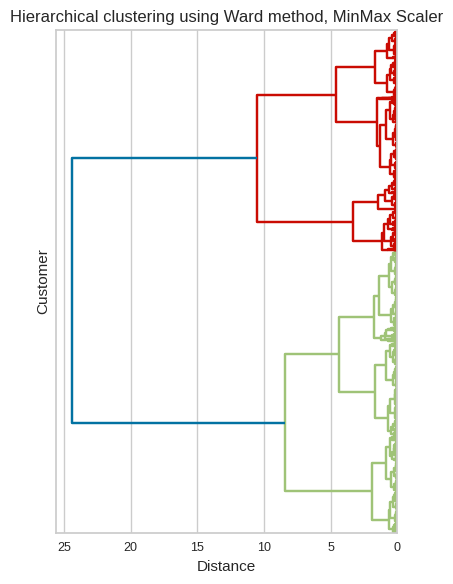

In [52]:
# ---------------
# MinMax Scaler
# ---------------
# 1 of 2. Hiearchical clustering Ward method, data scaled with MinMax Scaler
hierarchical_clustering_ini(X_rfm_ss_MM, "ward", "MinMax Scaler")

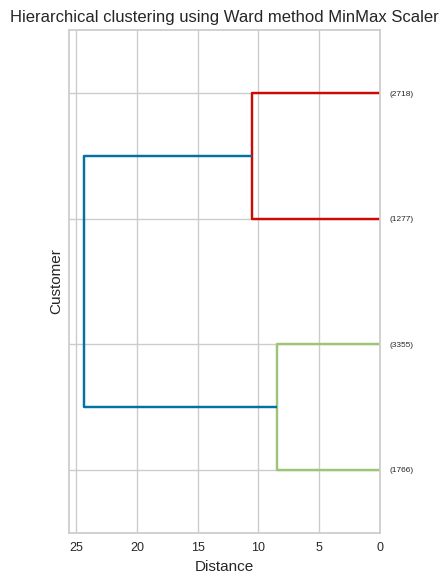

In [53]:
# 2 of 2. MinMax Scaler
df_hier_ward_ss = pd.DataFrame()

df_hier_ward_ss = hierarchical_clustering_end(X_data=X_rfm_ss_MM,
                                              analyzed_data="RFM subsample",
                                              scaler="MinMax Scaler",
                                              method="ward",
                                              k=4, criterion="maxclust",
                                              Y_data=Y_rfm_reduced,
                                              df_metrics=df_hier_ward_ss)

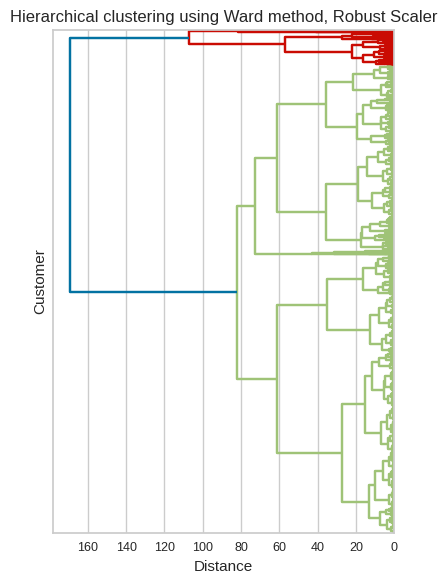

In [54]:
# ---------------
# Robust Scaler
# ---------------
# 1 of 2. Hiearchical clustering Ward method, data scaled with Robust Scaler
hierarchical_clustering_ini(X_rfm_ss_RS, "ward", "Robust Scaler")

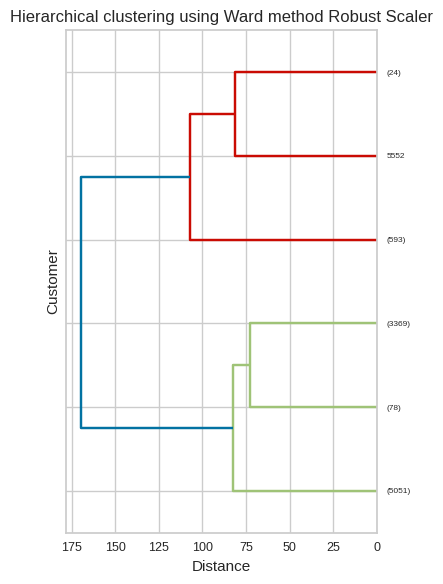

In [55]:
# 2 of 2. Robust Scaler
df_hier_ward_ss = hierarchical_clustering_end(X_data=X_rfm_ss_RS,
                                              analyzed_data="RFM subsample",
                                              scaler="Robust Scaler",
                                              method="ward",
                                              k=6, criterion="maxclust",
                                              Y_data=Y_rfm_reduced,
                                              df_metrics=df_hier_ward_ss)

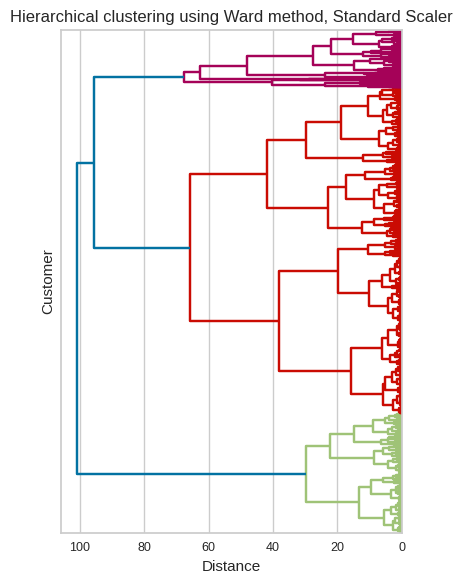

In [56]:
# -----------------
# Standard Scaler
# -----------------
# 1 of 2. Hiearchical clustering Ward method, data scaled with Standard Scaler
hierarchical_clustering_ini(X_rfm_ss_stdS, "ward", "Standard Scaler")

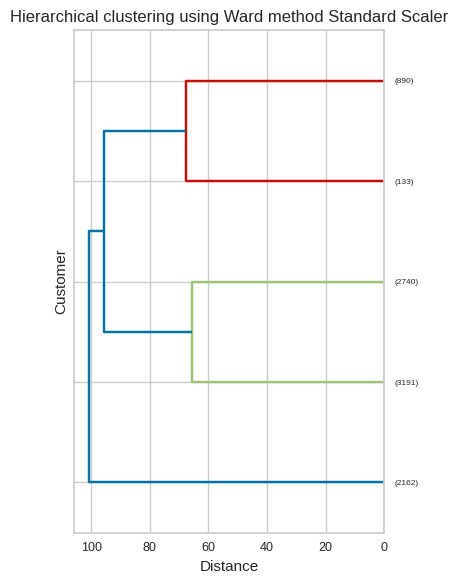

In [57]:
# 2 of 2. Standard Scaler
df_hier_ward_ss = hierarchical_clustering_end(X_data=X_rfm_ss_stdS,
                                              analyzed_data="RFM subsample",
                                              scaler="Standard Scaler",
                                              method="ward",
                                              k=5, criterion="maxclust",
                                              Y_data=Y_rfm_reduced,
                                              df_metrics=df_hier_ward_ss)

<a id="quantitative_data_clustering_test"></a>

---
---

# <font color = '#26467a'>**Quantitative data, clustering test** </font>
    

---
---
<a id='K_means_quanti'></a>

## <font color = '#0085dd'>Quantitative data K-means clustering </font>

<a id='k_tunning'></a>

### <span style='background:#0075bc'><span style='color:white'>*k* tunning</span></span>


In [58]:
# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_quanti = pd.DataFrame()

In [59]:
# --------------
# MinMax Scaler
# --------------
# Quantitative data, K-means metrics

nb_clusters = range(3, 12)
n_init = [10]
init = ["k-means++"]
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quanti = compute_kmeans_metrics(X_ss_quanti_MM,
                                             df_Kmeans_ss_quanti,
                                             "Quantitative subsample",
                                             "MinMax",
                                             seed, nb_clusters, n_init, init)
# df_Kmeans_ss_quanti.head().style.hide(axis='index')

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d43964c0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [60]:
# --------------
# Robust Scaler
# --------------
# Quantitative data, K-means metrics

nb_clusters = range(3, 12)
n_init = [10]
init = ["k-means++"]
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quanti = compute_kmeans_metrics(X_ss_quanti_RS,
                                             df_Kmeans_ss_quanti,
                                             "Quantitative subsample",
                                             "RobustScaler",
                                             seed, nb_clusters, n_init, init)
# df_Kmeans_ss_quanti.head().style.hide(axis='index')

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d8574dc0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [61]:
# --------------
# Standard Scaler
# --------------
# Quantitative data, K-means metrics

nb_clusters = range(3, 12)
n_init = [10]
init = ["k-means++"]
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quanti = compute_kmeans_metrics(X_ss_quanti_stdS,
                                             df_Kmeans_ss_quanti,
                                             "Quantitative subsample",
                                             "StandardScaler",
                                             seed, nb_clusters, n_init, init)
# df_Kmeans_ss_quanti.head().style.hide(axis='index')

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d43968b0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [62]:
# ------------------------------
# RFM Visualization dataframes
# ------------------------------
df_Kmeans_ss_quantiMM = df_Kmeans_ss_quanti[df_Kmeans_ss_quanti["Scaler"] ==
                                            "MinMax"]
df_Kmeans_ss_quantiRS = df_Kmeans_ss_quanti[df_Kmeans_ss_quanti["Scaler"] ==
                                            "RobustScaler"]
df_Kmeans_ss_quantistdS = df_Kmeans_ss_quanti[df_Kmeans_ss_quanti["Scaler"] ==
                                              "StandardScaler"]

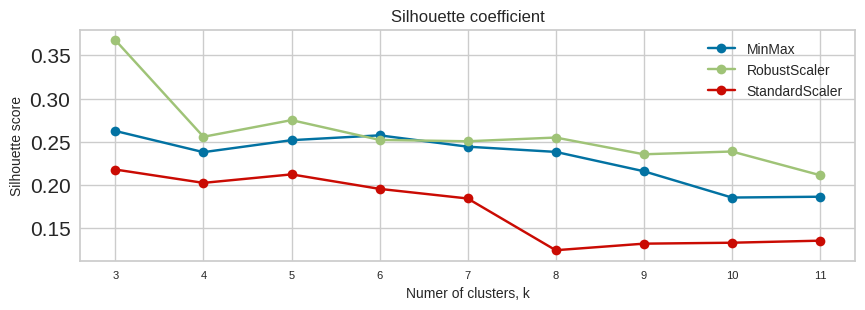

In [63]:
# Silhouette plotting : the closer to 1 the better
"""Silhouette"""

plt.figure(figsize=(10, 3))

plt.title("Silhouette coefficient", fontsize=12)
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_quantiMM["coef_silh"].to_list(), marker='o')
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_quantiRS["coef_silh"].to_list(), marker='o')
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_quantistdS["coef_silh"].to_list(), marker='o')
plt.grid(True)
plt.xlabel("Numer of clusters, k", fontsize=10)
plt.ylabel("Silhouette score", fontsize=10)
plt.xticks([i for i in range(3, 12)], fontsize=8)
plt.yticks(fontsize=15)
plt.legend(labels=["MinMax", "RobustScaler", "StandardScaler"])

plt.show()

Silhouette plotting : the closer to 1 the better

**Best silhouette coefficient** with  *k=*
 * MinMax Scaler : 3-6
 * Robust Scaler : 3-5
 * Standard Scaler 3-5


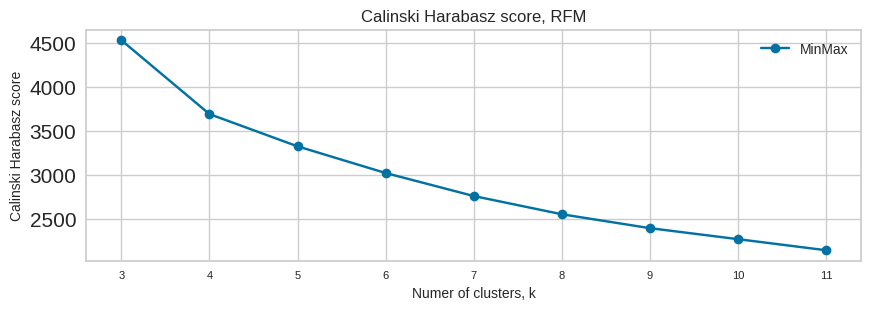

In [64]:
# Calinski Harabasz score plotting :
# The higher the score , the better the performances.
"""Calinski_Harabasz"""

plt.figure(figsize=(10, 3))

plt.title("Calinski Harabasz score, RFM", fontsize=12)
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_quantiMM["Calinski_Harabasz"].to_list(), marker='o')

plt.grid(True)
plt.xlabel("Numer of clusters, k", fontsize=10)
plt.ylabel("Calinski Harabasz score", fontsize=10)
plt.xticks([i for i in range(3, 12)], fontsize=8)
plt.yticks(fontsize=15)
plt.legend(labels=["MinMax", "RobustScaler", "StandardScaler"])

plt.show()

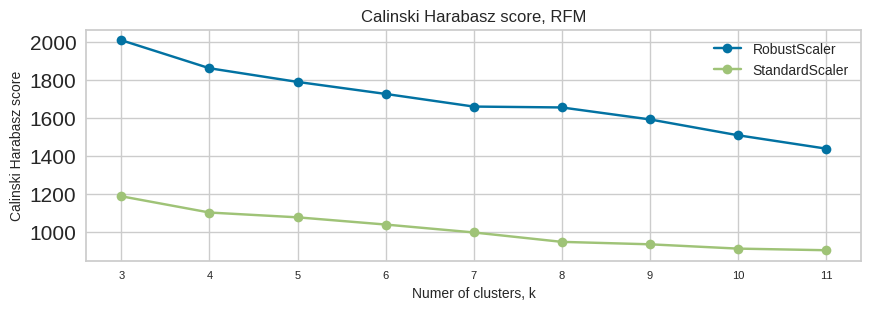

In [65]:
# Calinski Harabasz score plotting :
# The higher the score , the better the performances.
"""Calinski_Harabasz"""

plt.figure(figsize=(10, 3))

plt.title("Calinski Harabasz score, RFM", fontsize=12)

plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_quantiRS["Calinski_Harabasz"].to_list(), marker='o')
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_quantistdS["Calinski_Harabasz"].to_list(), marker='o')
plt.grid(True)
plt.xlabel("Numer of clusters, k", fontsize=10)
plt.ylabel("Calinski Harabasz score", fontsize=10)
plt.xticks([i for i in range(3, 12)], fontsize=8)
plt.yticks(fontsize=15)
plt.legend(labels=["RobustScaler", "StandardScaler"])

plt.show()

 
**Calinski Harabasz score**, 
 * MinMax Scaler : 3
 * Robust Scaler : 3-4
 * Standard Scaler : 3-4


---
---

**Review** :
***

The different indices give different optimal k. Depending on the climber used the optimum k varies.

 * MinMax Scaler
   * Silhouette coefficient k = 3-6
   * Elbow in Calinski Harabasz score k = 3 <br>   
<br>

 * Robust Scaler
   * Silhouette coefficient k = 3-5
   * Elbow in Calinski Harabasz score k = 3-4 <br>   
<br> 

 * Standard Scaler
   * Silhouette coefficient k = 3-5
   * Elbow in Calinski Harabasz score k = 3-4 <br>  
<br> 

 **The retained k values are**

* MinMax Scaler k = 3-4
* Robust Scaler k = 3-5
* Standard Scaler k = 3-5


<a id='nInit_methodInit_tunning'></a>

### <span style='background:#0075bc'><span style='color:white'>Method of initialization and number of clusters to initialize, tunning</span></span>


In [66]:
# --------------------
# MinMax Scaler, k=3
# --------------------
df_Kmeans_ss_quantiMM_3 = pd.DataFrame()

# Parameters to test
nb_clusters = [3]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quantiMM_3 = compute_kmeans_metrics(X_ss_quanti_MM,
                                                 df_Kmeans_ss_quantiMM_3,
                                                 "Quantitative subsample",
                                                 "MinMax",
                                                 seed,
                                                 nb_clusters, n_init, init)
# df_Kmeans_ss_rfmMM_3.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_quantiMM_3.sort_values(by=["coef_silh"],
                                            ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d4635040>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
0,Quantitative subsample,MinMax,3,10,k-means++,0.262603,1142.8497,1.362838,4535.403214,1.672274
2,Quantitative subsample,MinMax,3,20,k-means++,0.262603,1142.8497,1.362838,4535.403214,4.148201
4,Quantitative subsample,MinMax,3,30,k-means++,0.262603,1142.8497,1.362838,4535.403214,4.690078
6,Quantitative subsample,MinMax,3,50,k-means++,0.262594,1142.8497,1.363110,4535.403218,8.975889
8,Quantitative subsample,MinMax,3,70,k-means++,0.262594,1142.8497,1.363110,4535.403218,12.481103


In [67]:
# --------------------
# MinMax Scaler, k=4
# --------------------
df_Kmeans_ss_quanriMM_4 = pd.DataFrame()

# Parameters to test
nb_clusters = [4]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quanriMM_4 = compute_kmeans_metrics(X_ss_quanti_MM,
                                                 df_Kmeans_ss_quanriMM_4,
                                                 "Quantitative subsample",
                                                 "MinMax",
                                                 seed, nb_clusters,
                                                 n_init, init)
# df_Kmeans_ss_rfmMM_4.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_quanriMM_4.sort_values(by=["coef_silh"],
                                            ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d4649280>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
0,Quantitative subsample,MinMax,4,10,k-means++,0.238098,1029.173060,1.449152,3692.705473,1.902972
2,Quantitative subsample,MinMax,4,20,k-means++,0.238098,1029.173060,1.449152,3692.705473,3.154969
4,Quantitative subsample,MinMax,4,30,k-means++,0.237869,1029.163638,1.448058,3692.752869,5.737303
6,Quantitative subsample,MinMax,4,50,k-means++,0.237869,1029.163638,1.448058,3692.752869,8.764153
8,Quantitative subsample,MinMax,4,70,k-means++,0.237869,1029.163638,1.448058,3692.752869,11.435087


In [68]:
# --------------------
# Robust Scaler, k=3
# --------------------
df_Kmeans_ss_quantiRS_3 = pd.DataFrame()

# Parameters to test
nb_clusters = [3]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quantiRS_3 = compute_kmeans_metrics(X_ss_quanti_RS,
                                                 df_Kmeans_ss_quantiRS_3,
                                                 "Quantitative subsample",
                                                 "RobustScaler", seed,
                                                 nb_clusters, n_init, init)
# df_Kmeans_ss_quantiRS_3.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_quantiRS_3.sort_values(by=["coef_silh"],
                                            ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7f0bf70>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
9,Quantitative subsample,RobustScaler,3,70,random,0.368653,171575.494454,1.492219,2009.359027,0.945893
2,Quantitative subsample,RobustScaler,3,20,k-means++,0.368531,171575.501638,1.492797,2009.358752,3.155335
4,Quantitative subsample,RobustScaler,3,30,k-means++,0.368531,171575.501638,1.492797,2009.358752,6.129921
6,Quantitative subsample,RobustScaler,3,50,k-means++,0.368531,171575.501638,1.492797,2009.358752,8.275759
8,Quantitative subsample,RobustScaler,3,70,k-means++,0.368531,171575.501638,1.492797,2009.358752,12.516217


In [69]:
# --------------------
# Robust Scaler, k=4
# --------------------
df_Kmeans_ss_quantiRS_4 = pd.DataFrame()

# Parameters to test
nb_clusters = [4]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quantiRS_4 = compute_kmeans_metrics(X_ss_quanti_RS,
                                                 df_Kmeans_ss_quantiRS_4,
                                                 "Quantitative subsample",
                                                 "RobustScaler", seed,
                                                 nb_clusters, n_init, init)
# df_Kmeans_ss_quantiRS_4.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_quantiRS_4.sort_values(by=["coef_silh"],
                                            ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7f0b790>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
9,Quantitative subsample,RobustScaler,4,70,random,0.256353,153291.043112,1.485381,1861.482960,0.917845
8,Quantitative subsample,RobustScaler,4,70,k-means++,0.256153,153291.040531,1.486075,1861.482610,11.976917
0,Quantitative subsample,RobustScaler,4,10,k-means++,0.255881,153291.048734,1.485755,1861.483355,2.823609
2,Quantitative subsample,RobustScaler,4,20,k-means++,0.255881,153291.048734,1.485755,1861.483355,3.229004
4,Quantitative subsample,RobustScaler,4,30,k-means++,0.255881,153291.048734,1.485755,1861.483355,8.121480


In [70]:
# --------------------
# Robust Scaler, k=5
# --------------------
df_Kmeans_ss_quantiRS_5 = pd.DataFrame()

# Parameters to test
nb_clusters = [5]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quantiRS_5 = compute_kmeans_metrics(X_ss_quanti_RS,
                                                 df_Kmeans_ss_quantiRS_5,
                                                 "Quantitative subsample",
                                                 "RobustScaler", seed,
                                                 nb_clusters, n_init, init)
# df_Kmeans_ss_quantiRS_5.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_quantiRS_5.sort_values(by=["coef_silh"],
                                            ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7f0bb80>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
0,Quantitative subsample,RobustScaler,5,10,k-means++,0.275145,138462.494114,1.374787,1789.395717,2.854188
2,Quantitative subsample,RobustScaler,5,20,k-means++,0.275145,138462.494114,1.374787,1789.395717,3.367520
4,Quantitative subsample,RobustScaler,5,30,k-means++,0.275145,138462.494114,1.374787,1789.395717,4.887247
9,Quantitative subsample,RobustScaler,5,70,random,0.274915,138462.217050,1.375725,1789.400643,1.056202
5,Quantitative subsample,RobustScaler,5,30,random,0.274906,138462.251579,1.375756,1789.399629,1.701841


In [71]:
# ----------------------
# Standard Scaler, k=3
# ----------------------
df_Kmeans_ss_quantistdS_3 = pd.DataFrame()

# Parameters to test
nb_clusters = [3]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quantistdS_3 = compute_kmeans_metrics(X_ss_quanti_stdS,
                                                   df_Kmeans_ss_quantistdS_3,
                                                   "Quantitative subsample",
                                                   "StandardScaler", seed,
                                                   nb_clusters, n_init, init)
# df_Kmeans_ss_quantistdS_4.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_quantistdS_3.sort_values(by=["coef_silh"],
                                              ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d4635040>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
1,Quantitative subsample,StandardScaler,3,10,random,0.222982,101268.017313,1.950065,1185.873553,0.210188
9,Quantitative subsample,StandardScaler,3,70,random,0.218726,101266.631882,1.958409,1185.952001,0.847883
6,Quantitative subsample,StandardScaler,3,50,k-means++,0.218504,101266.728396,1.958520,1185.949398,10.414516
8,Quantitative subsample,StandardScaler,3,70,k-means++,0.218504,101266.728396,1.958520,1185.949398,12.618996
5,Quantitative subsample,StandardScaler,3,30,random,0.218466,101266.766754,1.958651,1185.948153,0.454434


In [72]:
# ----------------------
# Standard Scaler, k=4
# ----------------------
df_Kmeans_ss_quantistdS_4 = pd.DataFrame()

# Parameters to test
nb_clusters = [4]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quantistdS_4 = compute_kmeans_metrics(X_ss_quanti_stdS,
                                                   df_Kmeans_ss_quantistdS_4,
                                                   "Quantitative subsample",
                                                   "StandardScaler", seed,
                                                   nb_clusters, n_init, init)
# df_Kmeans_ss_quantistdS_4.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_quantistdS_4.sort_values(by=["coef_silh"],
                                              ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d4396f70>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
1,Quantitative subsample,StandardScaler,4,10,random,0.203106,93686.994897,1.716463,1100.245148,0.267000
2,Quantitative subsample,StandardScaler,4,20,k-means++,0.202651,93686.907887,1.717483,1100.243221,3.286920
4,Quantitative subsample,StandardScaler,4,30,k-means++,0.202651,93686.907887,1.717483,1100.243221,4.990078
3,Quantitative subsample,StandardScaler,4,20,random,0.202592,93686.892719,1.717067,1100.243892,0.335262
5,Quantitative subsample,StandardScaler,4,30,random,0.202592,93686.892719,1.717067,1100.243892,1.094177


In [73]:
# ----------------------
# Standard Scaler, k=5
# ----------------------
df_Kmeans_ss_quantistdS_5 = pd.DataFrame()

# Parameters to test
nb_clusters = [5]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_quantistdS_5 = compute_kmeans_metrics(X_ss_quanti_stdS,
                                                   df_Kmeans_ss_quantistdS_5,
                                                   "Quantitative subsample",
                                                   "StandardScaler", seed,
                                                   nb_clusters, n_init, init)
# df_Kmeans_ss_quantistdS_4.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_quantistdS_5.sort_values(by=["coef_silh"],
                                              ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d43abdc0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
2,Quantitative subsample,StandardScaler,5,20,k-means++,0.215749,86704.749430,1.589260,1074.958087,3.767933
4,Quantitative subsample,StandardScaler,5,30,k-means++,0.215749,86704.749430,1.589260,1074.958087,5.151340
6,Quantitative subsample,StandardScaler,5,50,k-means++,0.215748,86704.739260,1.589526,1074.957173,9.343987
8,Quantitative subsample,StandardScaler,5,70,k-means++,0.215748,86704.739260,1.589526,1074.957173,12.918982
9,Quantitative subsample,StandardScaler,5,70,random,0.212618,86706.181922,1.596338,1074.901705,13.695449


In all the tests performed, the coefficient values obtained are similar.<br>
**We will work with the default values** :

* n_init = 10
* init = 'k-means ++'

---
---
<a id='dbscan_quanti'></a>

## <font color = '#0085dd'>Quantitative data : DBScan </font>

In [74]:
# --------------
# MinMax Scaler
# --------------
df_dbscan_ss_quantiMM = pd.DataFrame()

eps_space_range = [0.1, 0.2, 0.3, 0.4, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]
samples_spc_rng = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Imputting function parameters
df_dbscan_ss_quantiMM = dbscan_grid_search(X_data=X_ss_quanti_MM,
                                    analyzed_data="Quantitative subsample",
                                           scaling="MinMax Scaler",
                                    dataframe_metrics=df_dbscan_ss_quantiMM,
                                           eps_space=eps_space_range,
                                           min_samples_space=samples_spc_rng,
                                           min_clust=3,
                                           max_clust=8)

print("\n Silhouette sorting")
display(df_dbscan_ss_quantiMM.sort_values(by=["coef_silh"],
                                          ascending=[False]).head())


 Silhouette sorting


,Analyzed_data,Scaler,Num_cluster,eps,min_samples,coef_silh,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
3,Quantitative subsample,MinMax Scaler,4,0.2,5,0.116623,2.107507,141.706332,0.331025
0,Quantitative subsample,MinMax Scaler,7,0.1,25,-0.159941,2.474391,375.409427,0.254973
1,Quantitative subsample,MinMax Scaler,4,0.1,35,-0.172759,2.719502,352.447313,0.195360
2,Quantitative subsample,MinMax Scaler,4,0.1,40,-0.181871,2.583376,338.294440,0.276819


In [75]:
# --------------
# Robust Scaler
# --------------
df_dbscan_ss_quantiRS = pd.DataFrame()

eps_space_range = [0.1, 0.2, 0.3, 0.4, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]
samples_spc_rng = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Imputting function parameters
df_dbscan_ss_quantiRS = dbscan_grid_search(X_data=X_ss_quanti_RS,
                                    analyzed_data="Quantitative subsample",
                                           scaling="MinMax Scaler",
                                    dataframe_metrics=df_dbscan_ss_quantiRS,
                                           eps_space=eps_space_range,
                                           min_samples_space=samples_spc_rng,
                                           min_clust=3,
                                           max_clust=8)

print("\n Silhouette sorting")
display(df_dbscan_ss_quantiRS.sort_values(by=["coef_silh"],
                                          ascending=[False]).head())


 Silhouette sorting


,Analyzed_data,Scaler,Num_cluster,eps,min_samples,coef_silh,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
4,Quantitative subsample,MinMax Scaler,7,3.5,5,0.541871,1.348903,346.651539,1.588025
3,Quantitative subsample,MinMax Scaler,4,2.0,10,0.036216,2.593305,487.938493,0.827834
0,Quantitative subsample,MinMax Scaler,7,1.0,20,-0.214207,2.070059,146.151095,0.313056
1,Quantitative subsample,MinMax Scaler,4,1.0,25,-0.220845,2.231690,173.779253,0.399708
2,Quantitative subsample,MinMax Scaler,7,1.0,30,-0.237982,2.062891,125.757806,0.381265


In [76]:
# --------------
# Standard Scaler
# --------------
df_dbscan_ss_quantistdS = pd.DataFrame()

# Parameters to test
eps_space_range = [0.1, 0.2, 0.3, 0.4, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]
samples_spc_rng = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Imputting function parameters
df_dbscan_ss_quantistdS = dbscan_grid_search(X_data=X_ss_quanti_stdS,
                                    analyzed_data="Quantitative subsample",
                                             scaling="MinMax Scaler",
                                    dataframe_metrics=df_dbscan_ss_quantistdS,
                                             eps_space=eps_space_range,
                                           min_samples_space=samples_spc_rng,
                                           min_clust=3,
                                           max_clust=8)

print("\n Silhouette sorting")
display(df_dbscan_ss_quantistdS.sort_values(by=["coef_silh"],
                                            ascending=[False]).head())


 Silhouette sorting


,Analyzed_data,Scaler,Num_cluster,eps,min_samples,coef_silh,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
5,Quantitative subsample,MinMax Scaler,4,3.0,5,0.525599,1.716512,224.864552,0.832741
4,Quantitative subsample,MinMax Scaler,7,2.0,5,0.198161,2.028502,222.134724,0.636802
3,Quantitative subsample,MinMax Scaler,7,1.0,15,-0.134844,2.115541,178.135303,0.252476
1,Quantitative subsample,MinMax Scaler,7,0.5,10,-0.281819,2.051482,43.100451,0.114538
2,Quantitative subsample,MinMax Scaler,7,0.5,15,-0.301393,2.030005,36.246639,0.202354


The silhouette coefficients of the MinMax scaled data analysis results are always negative, indicating poor clustering quality.<br>
Only the analysis of the data scaled with Robust ans Standard Scaler generates positive silhouette coefficient values.

The best results of the analysis of quantitative scaled data with **Robust Scaler** are obtained with :
 * eps = 4
 * min_samples = 5<br>
 
 The best results of the analysis of quantitative scaled data with **Standard Scaler** are obtained with :
 * eps = 3.0
 * min_samples = 5<br>


---
---
<a id='hiearchical_quanti'></a>

## <font color = '#0085dd'>Quantitative data, Hierarchical Scipy Dendogram</font>

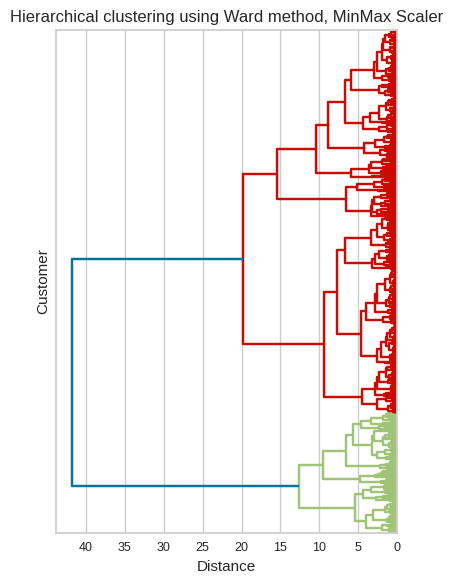

In [77]:
# ---------------
# MinMax Scaler
# ---------------
# 1 of 2. Hiearchical clustering Ward method, data scaled with MinMax Scaler
hierarchical_clustering_ini(X_ss_quanti_MM, "ward", "MinMax Scaler")

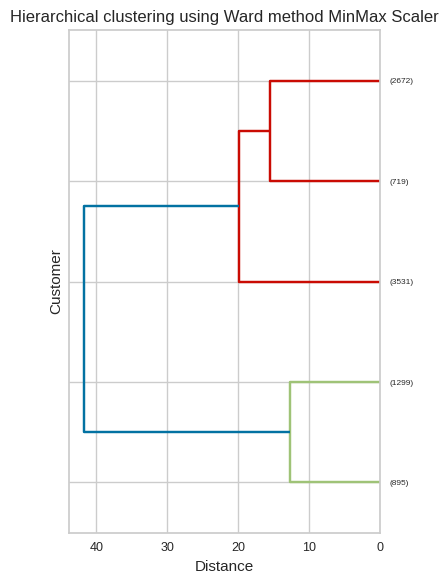

In [78]:
# 2 of 2. MinMax Scaler
df_hier_ward_ss_quanti = pd.DataFrame()

df_hier_ward_ss_quanti = hierarchical_clustering_end(X_data=X_ss_quanti_MM,
                                    analyzed_data="Quantitative subsample",
                                                     scaler="MinMax Scaler",
                                                     method="ward", k=5,
                                                     criterion="maxclust",
                                                     Y_data=Y_ss_quanti,
                                            df_metrics=df_hier_ward_ss_quanti)

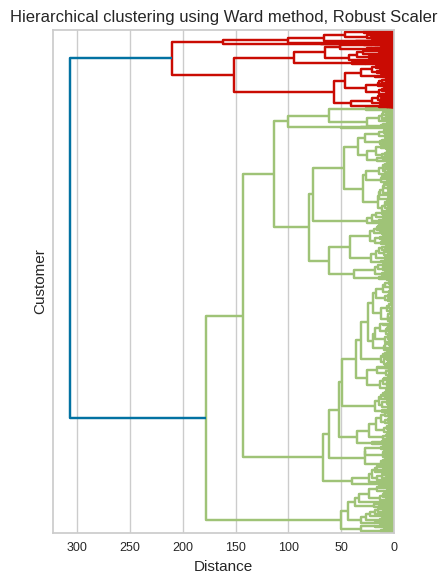

In [79]:
# ---------------
# Robust Scaler
# ---------------
# 1 of 2. Hiearchical clustering Ward method, data scaled with Robust Scaler
hierarchical_clustering_ini(X_ss_quanti_RS, "ward", "Robust Scaler")

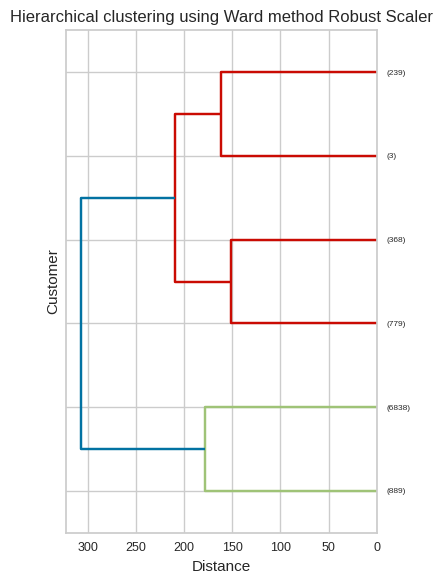

In [80]:
# 2 of 2. Robust Scaler
df_hier_ward_ss_quanti = hierarchical_clustering_end(X_data=X_ss_quanti_RS,
                                    analyzed_data="Quantitative subsample",
                                                     scaler="Robust Scaler",
                                                     method="ward", k=6,
                                                     criterion="maxclust",
                                                     Y_data=Y_ss_quanti,
                                            df_metrics=df_hier_ward_ss_quanti)

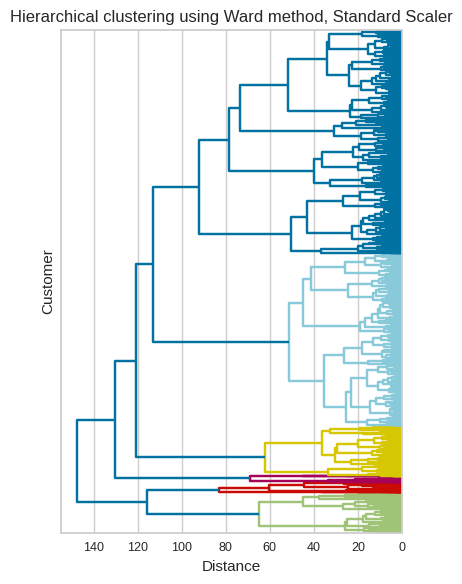

In [81]:
# -----------------
# Standard Scaler
# -----------------
# 1 of 2. Hiearchical clustering Ward method, data scaled with Standard Scaler
hierarchical_clustering_ini(X_ss_quanti_stdS, "ward", "Standard Scaler")

<a id="quanti_quali_data_clustering_test"></a>

---
---

# <font color = '#26467a'>**Quantitative & Qualitative data, clustering test** </font>
    

---
---
<a id='K_means_quanti_quali'></a>

## <font color = '#0085dd'>Quanti&Quali data K-means clustering </font>

<a id='k_tunning'></a>

### <span style='background:#0075bc'><span style='color:white'>*k* tunning</span></span>


In [82]:
# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_qq = pd.DataFrame()

In [83]:
# --------------
# MinMax Scaler
# --------------

# Parameters to test
nb_clusters = range(3, 12)
n_init = [10]
init = ["k-means++"]
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qq = compute_kmeans_metrics(X_ss_qq_MM,  df_Kmeans_ss_qq,
                                         "QuantiQuali subsample", "MinMax",
                                         seed, nb_clusters, n_init, init)
# df_Kmeans_ss_qq.head().style.hide(axis='index')

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d885b4c0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [84]:
# --------------
# Robust Scaler
# --------------

# Parameters to test
nb_clusters = range(3, 12)
n_init = [10]
init = ["k-means++"]
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qq = compute_kmeans_metrics(X_ss_qq_RS, df_Kmeans_ss_qq,
                                         "QuantiQuali subsample",
                                         "RobustScaler", seed, nb_clusters,
                                         n_init, init)
# df_Kmeans_ss_qq.head().style.hide(axis='index')

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d885bee0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [85]:
# --------------
# Standard Scaler
# --------------

# Parameters to test
nb_clusters = range(3, 12)
n_init = [10]
init = ["k-means++"]
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qq = compute_kmeans_metrics(X_ss_qq_stdS,
                                         df_Kmeans_ss_qq,
                                         "QuantiQuali subsample",
                                         "StandardScaler", seed, nb_clusters,
                                         n_init, init)
# df_Kmeans_ss_qq.head().style.hide(axis='index')

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d885bee0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [86]:
# ------------------------------
# RFM Visualization dataframes
# ------------------------------
df_Kmeans_ss_qqMM = df_Kmeans_ss_qq[df_Kmeans_ss_qq["Scaler"] == "MinMax"]
df_Kmeans_ss_qqRS = df_Kmeans_ss_qq[df_Kmeans_ss_qq["Scaler"] ==
                                    "RobustScaler"]
df_Kmeans_ss_qqstdS = df_Kmeans_ss_qq[df_Kmeans_ss_qq["Scaler"] ==
                                      "StandardScaler"]

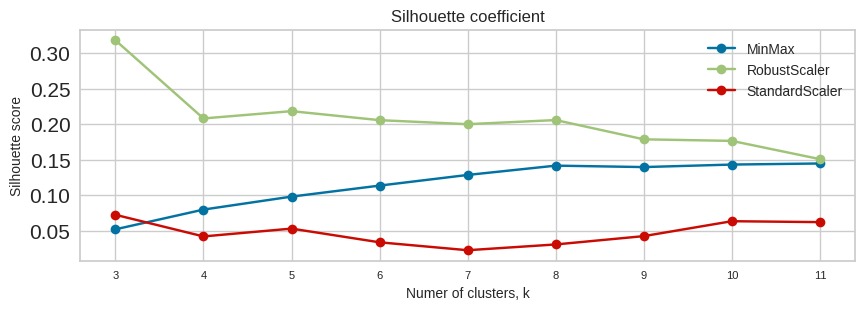

In [87]:
# Silhouette plotting : the closer to 1 the better
"""Silhouette"""

plt.figure(figsize=(10, 3))

plt.title("Silhouette coefficient", fontsize=12)
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_qqMM["coef_silh"].to_list(), marker='o')
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_qqRS["coef_silh"].to_list(), marker='o')
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_qqstdS["coef_silh"].to_list(), marker='o')
plt.grid(True)
plt.xlabel("Numer of clusters, k", fontsize=10)
plt.ylabel("Silhouette score", fontsize=10)
plt.xticks([i for i in range(3, 12)], fontsize=8)
plt.yticks(fontsize=15)
plt.legend(labels=["MinMax", "RobustScaler", "StandardScaler"])

plt.show()

Silhouette plotting : the closer to 1 the better

**Best silhouette coefficient** with  *k=*
 * MinMax Scaler : 8
 * Robust Scaler : 3-5
 * Standard Scaler 3-5


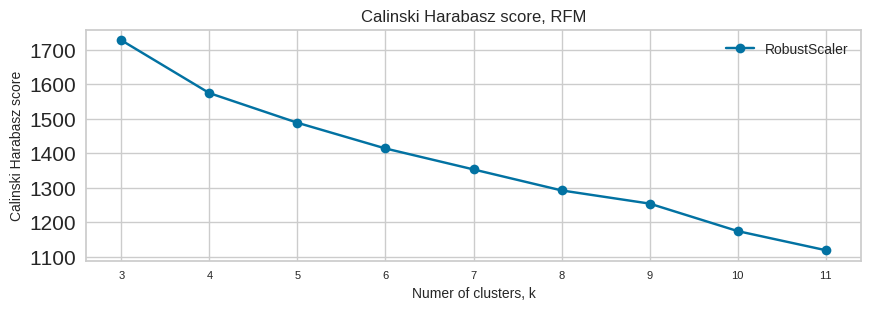

In [88]:
# Calinski Harabasz score plotting :
# The higher the score , the better the performances.
"""Calinski_Harabasz"""

plt.figure(figsize=(10, 3))

plt.title("Calinski Harabasz score, RFM", fontsize=12)
plt.plot([i for i in range(3, 12)],
         df_Kmeans_ss_qqRS["Calinski_Harabasz"].to_list(), marker='o')

plt.grid(True)
plt.xlabel("Numer of clusters, k", fontsize=10)
plt.ylabel("Calinski Harabasz score", fontsize=10)
plt.xticks([i for i in range(3, 12)], fontsize=8)
plt.yticks(fontsize=15)
plt.legend(labels=["RobustScaler"])

plt.show()

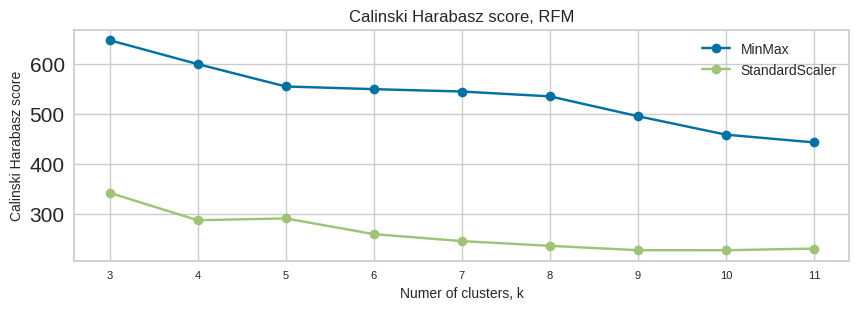

In [89]:
# Calinski Harabasz score plotting : The higher the score , the better the performances.
"""Calinski_Harabasz"""

plt.figure(figsize=(10, 3))

plt.title("Calinski Harabasz score, RFM", fontsize=12)

plt.plot([i for i in range(3, 12)],\
         df_Kmeans_ss_qqMM["Calinski_Harabasz"].to_list(),\
         marker='o')
plt.plot([i for i in range(3, 12)], \
         df_Kmeans_ss_qqstdS["Calinski_Harabasz"].to_list(),\
         marker='o')
plt.grid(True)
plt.xlabel("Numer of clusters, k", fontsize=10)
plt.ylabel("Calinski Harabasz score", fontsize=10)
plt.xticks([i for i in range(3, 12)], fontsize=8)
plt.yticks(fontsize=15)
plt.legend(labels=["MinMax", "StandardScaler"])

plt.show()

 
**Calinski Harabasz score**, 
 * MinMax Scaler : 3
 * Robust Scaler : 3-4
 * Standard Scaler : 3


---
---

**Review** :
***

The different indices give different optimal k. Depending on the climber used the optimum k varies.

 * MinMax Scaler
   * Silhouette coefficient k = 8
   * Elbow in Calinski Harabasz score k = 3 <br>   
<br>

 * Robust Scaler
   * Silhouette coefficient k = 3-5
   * Elbow in Calinski Harabasz score k = 3-4 <br>   
<br> 

 * Standard Scaler
   * Silhouette coefficient k = 3-5
   * Elbow in Calinski Harabasz score k = 3 <br>  
<br> 

 **The retained k values are**

* MinMax Scaler k = 3, 8
* Robust Scaler k = 3-5
* Standard Scaler k = 3-5


<a id='nInit_methodInit_tunning'></a>

### <span style='background:#0075bc'><span style='color:white'>Method of initialization and number of clusters to initialize, tunning</span></span>


In [90]:
#--------------------
# MinMax Scaler, k=3
#--------------------

# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_qqMM_3 = pd.DataFrame()

# Parameters to test
nb_clusters = [3]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qqMM_3 = compute_kmeans_metrics(X_ss_qq_MM,\
                                          df_Kmeans_ss_qqMM_3,\
                                          "Quantitative subsample", "MinMax",\
                                          seed,\
                                          nb_clusters, n_init, init)
#df_Kmeans_ss_rfmMM_4.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_qqMM_3.sort_values(by=["coef_silh"],
                                  ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7fd9a60>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
3,Quantitative subsample,MinMax,3,20,random,0.081577,26733.882258,2.844447,665.232546,0.261565
2,Quantitative subsample,MinMax,3,20,k-means++,0.081571,26728.217180,2.837972,666.339299,3.240495
1,Quantitative subsample,MinMax,3,10,random,0.080787,26803.829644,2.837879,651.605891,0.388393
5,Quantitative subsample,MinMax,3,30,random,0.067377,26647.219534,2.862963,682.214790,0.379879
7,Quantitative subsample,MinMax,3,50,random,0.067377,26647.219534,2.862963,682.214790,1.034431


In [91]:
#--------------------
# MinMax Scaler, k=8
#--------------------

# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_qqMM_8 = pd.DataFrame()

# Parameters to test
nb_clusters = [8]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qqMM_8 = compute_kmeans_metrics(X_ss_qq_MM,\
                                          df_Kmeans_ss_qqMM_8,\
                                          "Quantitative subsample", "MinMax",\
                                          seed,\
                                          nb_clusters, n_init, init)
#df_Kmeans_ss_qqMM_8.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_qqMM_8.sort_values(by=["coef_silh"],
                                  ascending=[False]).head(6))

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7fd9a60>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
0,Quantitative subsample,MinMax,8,10,k-means++,0.141641,21711.295424,2.095045,534.907233,1.911785
2,Quantitative subsample,MinMax,8,20,k-means++,0.141641,21711.295424,2.095045,534.907233,4.262611
4,Quantitative subsample,MinMax,8,30,k-means++,0.141641,21711.295424,2.095045,534.907233,12.265990
6,Quantitative subsample,MinMax,8,50,k-means++,0.141641,21711.295424,2.095045,534.907233,8.892822
7,Quantitative subsample,MinMax,8,50,random,0.141641,21711.295424,2.095045,534.907233,0.714138
8,Quantitative subsample,MinMax,8,70,k-means++,0.141641,21711.295424,2.095045,534.907233,13.538843


In [92]:
#--------------------
# Robust Scaler, k=3
#--------------------

# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_qqRS_3 = pd.DataFrame()

# Parameters to test
nb_clusters = [3]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qqRS_3 = compute_kmeans_metrics(X_ss_qq_RS,\
                                          df_Kmeans_ss_qqRS_3,\
                                          "Quantitative subsample",\
                                          "RobustScaler", seed,\
                                          nb_clusters, n_init, init)
#df_Kmeans_ss_qqRS_3.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_qqRS_3.sort_values(by=["coef_silh"],
                                  ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7fd9a60>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
6,Quantitative subsample,RobustScaler,3,50,k-means++,0.319392,199848.747412,1.635690,1726.987438,8.597833
8,Quantitative subsample,RobustScaler,3,70,k-means++,0.319392,199848.747412,1.635690,1726.987438,12.714309
7,Quantitative subsample,RobustScaler,3,50,random,0.319224,199848.670389,1.635978,1726.989457,0.913938
5,Quantitative subsample,RobustScaler,3,30,random,0.318950,199848.782880,1.636969,1726.986489,0.669549
9,Quantitative subsample,RobustScaler,3,70,random,0.318518,199848.367867,1.632451,1726.998969,1.121071


In [93]:
#--------------------
# Robust Scaler, k=4
#--------------------

# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_qqRS_4 = pd.DataFrame()

# Parameters to test
nb_clusters = [4]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qqRS_4 = compute_kmeans_metrics(X_ss_quanti_RS,\
                                          df_Kmeans_ss_qqRS_4,\
                                          "Quantitative subsample",\
                                          "RobustScaler", seed,\
                                          nb_clusters, n_init, init)
#df_Kmeans_ss_qqRS_4.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_qqRS_4.sort_values(by=["coef_silh"],
                                  ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7fd9280>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
9,Quantitative subsample,RobustScaler,4,70,random,0.256353,153291.043112,1.485381,1861.482960,1.102943
8,Quantitative subsample,RobustScaler,4,70,k-means++,0.256153,153291.040531,1.486075,1861.482610,20.796578
0,Quantitative subsample,RobustScaler,4,10,k-means++,0.255881,153291.048734,1.485755,1861.483355,2.595640
2,Quantitative subsample,RobustScaler,4,20,k-means++,0.255881,153291.048734,1.485755,1861.483355,3.205613
4,Quantitative subsample,RobustScaler,4,30,k-means++,0.255881,153291.048734,1.485755,1861.483355,6.131367


In [94]:
#--------------------
# Robust Scaler, k=5
#--------------------

# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_qqRS_5 = pd.DataFrame()

# Parameters to test
nb_clusters = [5]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qqRS_5 = compute_kmeans_metrics(X_ss_quanti_RS,\
                                          df_Kmeans_ss_qqRS_5,\
                                          "Quantitative subsample",\
                                          "RobustScaler", seed,\
                                          nb_clusters, n_init, init)
#df_Kmeans_ss_qqRS_5.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_qqRS_5.sort_values(by=["coef_silh"],
                                  ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7fd9790>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
0,Quantitative subsample,RobustScaler,5,10,k-means++,0.275145,138462.494114,1.374787,1789.395717,1.833648
2,Quantitative subsample,RobustScaler,5,20,k-means++,0.275145,138462.494114,1.374787,1789.395717,5.416846
4,Quantitative subsample,RobustScaler,5,30,k-means++,0.275145,138462.494114,1.374787,1789.395717,5.295689
9,Quantitative subsample,RobustScaler,5,70,random,0.274915,138462.217050,1.375725,1789.400643,1.176466
5,Quantitative subsample,RobustScaler,5,30,random,0.274906,138462.251579,1.375756,1789.399629,0.896763


In [95]:
#----------------------
# Standard Scaler, k=3
#----------------------
# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_qqstdS_3 = pd.DataFrame()

# Parameters to test
nb_clusters = [3]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qqstdS_3 = compute_kmeans_metrics(X_ss_qq_stdS,\
                                          df_Kmeans_ss_qqstdS_3,\
                                          "Quantitative subsample", \
                                          "StandardScaler", seed,\
                                          nb_clusters, n_init, init)
#df_Kmeans_ss_qqstdS_3.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_qqstdS_3.sort_values(by=["coef_silh"],
                                  ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7fd9f70>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
3,Quantitative subsample,StandardScaler,3,20,random,0.072421,474894.890853,3.517456,341.583910,0.466603
0,Quantitative subsample,StandardScaler,3,10,k-means++,0.072391,474894.629432,3.518642,341.586607,1.900098
2,Quantitative subsample,StandardScaler,3,20,k-means++,0.072391,474894.629432,3.518642,341.586607,4.499279
4,Quantitative subsample,StandardScaler,3,30,k-means++,0.072391,474894.629432,3.518642,341.586607,4.967625
5,Quantitative subsample,StandardScaler,3,30,random,0.072391,474894.629432,3.518642,341.586607,0.738961


In [96]:
#----------------------
# Standard Scaler, k=4
#----------------------
# Dataframe dataframe for saving the K-means metrics results
df_Kmeans_ss_qqstdS_4 = pd.DataFrame()

# Parameters to test
nb_clusters = [4]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qqstdS_4 = compute_kmeans_metrics(X_ss_qq_stdS,\
                                          df_Kmeans_ss_qqstdS_4,\
                                          "Quantitative subsample",\
                                          "StandardScaler", seed,\
                                          nb_clusters, n_init, init)
#df_Kmeans_ss_qqstdS_4.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_qqstdS_4.sort_values(by=["coef_silh"],
                                  ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7fd9dc0>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
2,Quantitative subsample,StandardScaler,4,20,k-means++,0.055034,462224.787463,3.688394,317.195804,4.944297
1,Quantitative subsample,StandardScaler,4,10,random,0.054968,462226.619714,3.691503,317.182506,0.340440
3,Quantitative subsample,StandardScaler,4,20,random,0.054968,462226.619714,3.691503,317.182506,0.485844
5,Quantitative subsample,StandardScaler,4,30,random,0.054968,462226.619714,3.691503,317.182506,0.602291
8,Quantitative subsample,StandardScaler,4,70,k-means++,0.054790,462224.144851,3.695885,317.200467,13.120157


In [97]:
# ----------------------
# Standard Scaler, k=5
# ----------------------
df_Kmeans_ss_qqstdS_5 = pd.DataFrame()

# Parameters to test
nb_clusters = [4]
n_init = [10, 20, 30, 50, 70]
init = ['k-means++', 'random']
# Metrics resulting from the different combinations of parameters
df_Kmeans_ss_qqstdS_5 = compute_kmeans_metrics(X_ss_qq_stdS,
                                               df_Kmeans_ss_qqstdS_5,
                                               "Quantitative subsample",
                                               "StandardScaler", seed,
                                               nb_clusters, n_init, init)
# df_Kmeans_ss_qqstdS_5.head().style.hide(axis='index')

print("\n Silhouette sorting")
display(df_Kmeans_ss_qqstdS_5.sort_values(by=["coef_silh"],
                                          ascending=[False]).head())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fc8d7fd9670>
Traceback (most recent call last):
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/raquelsp/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc


 Silhouette sorting


,Analyzed_data,Scaler,Num_clusters,n_init,init_method,coef_silh,inertia,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
2,Quantitative subsample,StandardScaler,4,20,k-means++,0.055034,462224.787463,3.688394,317.195804,3.630262
1,Quantitative subsample,StandardScaler,4,10,random,0.054968,462226.619714,3.691503,317.182506,0.288626
3,Quantitative subsample,StandardScaler,4,20,random,0.054968,462226.619714,3.691503,317.182506,0.488173
5,Quantitative subsample,StandardScaler,4,30,random,0.054968,462226.619714,3.691503,317.182506,0.813655
8,Quantitative subsample,StandardScaler,4,70,k-means++,0.054790,462224.144851,3.695885,317.200467,12.744065


In all the tests performed, the coefficient values obtained are similar.<br>
**We will work with the default values** :

* n_init = 10
* init = 'k-means ++'

---
---
<a id='dbscan_qq'></a>

## <font color = '#0085dd'>Quanti&Quali data : DBScan </font>

In [98]:
# --------------
# MinMax Scaler
# --------------
df_dbscan_ss_qqMM = pd.DataFrame()

# Parameters to test
eps_space_range = [0.1, 0.2, 0.3, 0.4, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]
samples_spc_rng = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Imputting function parameters
df_dbscan_ss_qqMM = dbscan_grid_search(X_data=X_ss_qq_MM,
                                       analyzed_data="Quantitative subsample",
                                       scaling="MinMax Scaler",
                                       dataframe_metrics=df_dbscan_ss_qqMM,
                                       eps_space=eps_space_range,
                                       min_samples_space=samples_spc_rng,
                                       min_clust=3,
                                       max_clust=8)

print("\n Silhouette sorting")
display(df_dbscan_ss_qqMM.sort_values(by=["coef_silh"],
                                      ascending=[False]).head())


 Silhouette sorting


,Analyzed_data,Scaler,Num_cluster,eps,min_samples,coef_silh,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
0,Quantitative subsample,MinMax Scaler,7,0.1,5,-0.133488,1.088642,5.000278,1.266291


In [99]:
# --------------
# Robust Scaler
# --------------
df_dbscan_ss_qqRS = pd.DataFrame()

# Parameters to test
eps_space_range = [0.1, 0.2, 0.3, 0.4, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]
samples_spc_rng = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Imputting function parameters
df_dbscan_ss_qqRS = dbscan_grid_search(X_data=X_ss_qq_RS,
                                       analyzed_data="Quantitative subsample",
                                       scaling="Robust Scaler",
                                       dataframe_metrics=df_dbscan_ss_qqRS,
                                       eps_space=eps_space_range,
                                       min_samples_space=samples_spc_rng,
                                       min_clust=3,
                                       max_clust=8)

print("\n Silhouette sorting")
display(df_dbscan_ss_qqRS.sort_values(by=["coef_silh"],
                                      ascending=[False]).head())


 Silhouette sorting


,Analyzed_data,Scaler,Num_cluster,eps,min_samples,coef_silh,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
1,Quantitative subsample,Robust Scaler,4,4.0,5,0.494970,1.422788,403.981720,1.360666
0,Quantitative subsample,Robust Scaler,7,2.5,10,0.049189,1.978469,244.566967,1.149349


In [100]:
# --------------
# Standard Scaler
# --------------
df_dbscan_ss_qqstdS = pd.DataFrame()

# Parameters to test
eps_space_range = [0.1, 0.2, 0.3, 0.4, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]
samples_spc_rng = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Imputting function parameters
df_dbscan_ss_qqstdS = dbscan_grid_search(X_data=X_ss_qq_stdS,
                                    analyzed_data="Quantitative subsample",
                                         scaling="Standard Scaler",
                                        dataframe_metrics=df_dbscan_ss_qqstdS,
                                         eps_space=eps_space_range,
                                       min_samples_space=samples_spc_rng,
                                       min_clust=3,
                                       max_clust=8)
print("\n Silhouette sorting")
display(df_dbscan_ss_qqstdS.sort_values(by=["coef_silh"],
                                        ascending=[False]).head())


 Silhouette sorting


,Analyzed_data,Scaler,Num_cluster,eps,min_samples,coef_silh,Davies_Bouldin,Calinski_Harabasz,Computing_time_s
1,Quantitative subsample,Standard Scaler,7,4,25,-0.156877,2.122334,18.232691,1.251208
0,Quantitative subsample,Standard Scaler,7,2,10,-0.187492,1.572288,5.654783,1.182590


The silhouette coefficients of the MinMax and Standard scaled data analysis results are always negative, indicating poor clustering quality.<br>
Only the analysis of the data scaled with Robust Scaler generates positive silhouette coefficient values.

The best results of the analysis of quantitative scaled data with **Robust Scaler** are obtained with :

 * eps = 4.0
 * min_samples = 5


---
---
<a id='hiearchical_qq'></a>

## <font color = '#0085dd'>Quanti&Quali data, Hierarchical Scipy Dendogram</font>

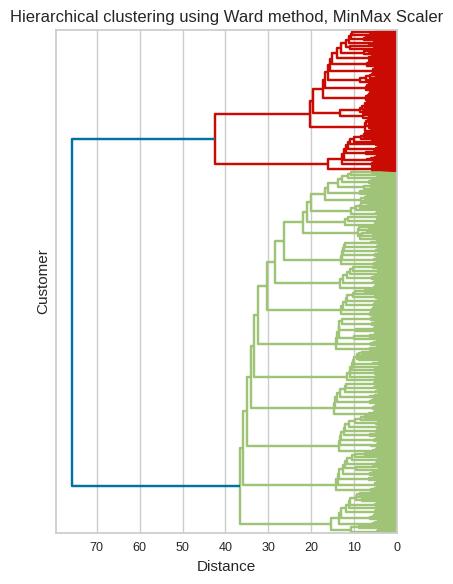

In [101]:
# ---------------
# MinMax Scaler
# ---------------
# 1 of 2. Hiearchical clustering Ward method, data scaled with MinMax Scaler
hierarchical_clustering_ini(X_ss_qq_MM, "ward", "MinMax Scaler")

The dendrogram resulting from the analysis of the quanti&quali data scaled with MinMax Scaler, shows that the clustering will be very weak.

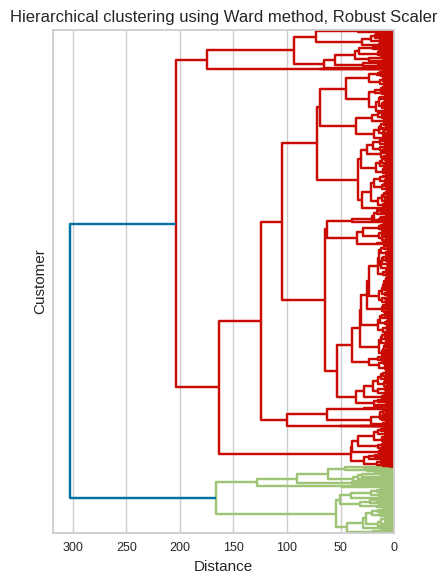

In [102]:
# ---------------
# Robust Scaler
# ---------------
# 1 of 2. Hiearchical clustering Ward method, data scaled with Robust Scaler
hierarchical_clustering_ini(X_ss_qq_RS, "ward", "Robust Scaler")

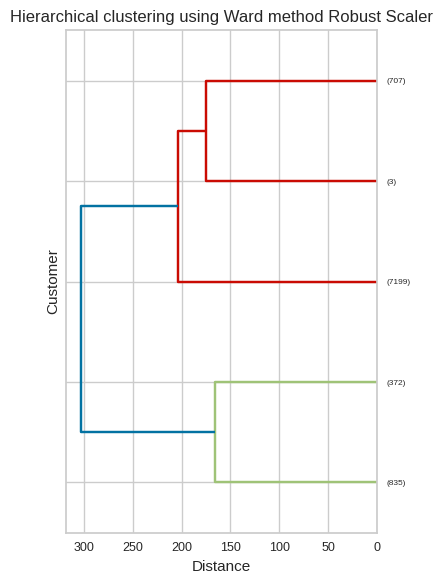

In [103]:
# 2 of 2. Robust Scaler
df_hier_ward_ss_qq = pd.DataFrame()

df_hier_ward_ss_qq = hierarchical_clustering_end(X_data=X_ss_qq_RS,
                                    analyzed_data="QuantiQuali subsample",
                                                 scaler="Robust Scaler",
                                                 method="ward", k=5,
                                                 criterion="maxclust",
                                                 Y_data=Y_ss_qq,
                                                df_metrics=df_hier_ward_ss_qq)

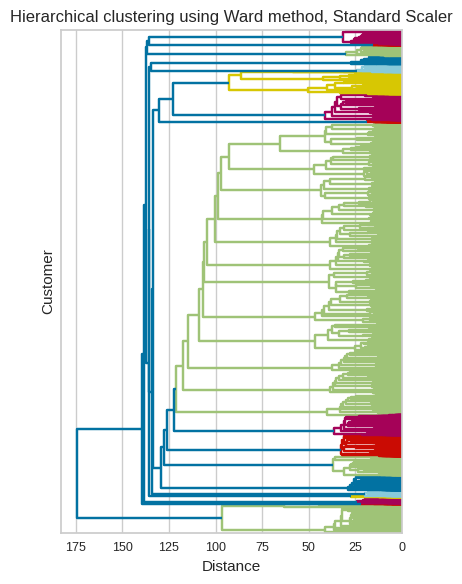

In [104]:
# -----------------
# Standard Scaler
# -----------------
# 1 of 2. Hiearchical clustering Ward method, data scaled with Standard Scaler
hierarchical_clustering_ini(X_ss_qq_stdS, "ward", "Standard Scaler")

The dendrogram resulting from the analysis of the quanti&quali data scaled with Standard Scaler, shows that the clustering will be very weak.

<a id="rfm_comp_algo_perform"></a>

---
---

# <font color = '#26467a'>**Comparison of the algorithms performances** </font>
    

In [105]:
# Dataframe to store the results to compare
df_algo_comp = pd.DataFrame()

---
---
<a id='kmeans_test'></a>

## <font color = '#0085dd'>K-means tests </font>

In [106]:
# K-means, RFM, MinMax scaler, k=3
seed = 84

time_start = time.time()  # Start chrono
kmeans_rfmMM_3 = cluster.KMeans(n_clusters=3, n_init=10, init="k-means++",
                                random_state=seed).fit_predict(X_rfm_ss_MM)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmMM_3", X_rfm_ss_MM,
                                "RFM", kmeans_rfmMM_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [107]:
# K-means, RFM, MinMax scaler, k=4

time_start = time.time()  # Start chrono
kmeans_rfmMM_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                random_state=seed).fit_predict(X_rfm_ss_MM)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmMM_4", X_rfm_ss_MM,
                                "RFM", kmeans_rfmMM_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [108]:
# K-means, RFM, MinMax scaler, k=5

time_start = time.time()  # Start chrono
kmeans_rfmMM_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                                random_state=seed).fit_predict(X_rfm_ss_MM)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmMM_5", X_rfm_ss_MM,
                                "RFM", kmeans_rfmMM_5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [109]:
# K-means, RFM, Robust scaler, k=3

time_start = time.time()  # Start chrono
kmeans_rfmRS_3 = cluster.KMeans(n_clusters=3, n_init=10, init="k-means++",
                                random_state=seed).fit_predict(X_rfm_ss_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmRS_3", X_rfm_ss_RS,
                                "RFM", kmeans_rfmRS_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [110]:
# K-means, RFM, Robust scaler, k=4

time_start = time.time()  # Start chrono
kmeans_rfmRS_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                random_state=seed).fit_predict(X_rfm_ss_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmRS_4", X_rfm_ss_RS,
                                "RFM", kmeans_rfmRS_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [111]:
# K-means, RFM, Robust scaler, k=6

time_start = time.time()  # Start chrono
kmeans_rfmRS_6 = cluster.KMeans(n_clusters=6, n_init=10, init="k-means++",
                                random_state=seed).fit_predict(X_rfm_ss_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmRS_6", X_rfm_ss_RS,
                                "RFM", kmeans_rfmRS_6,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [112]:
# K-means, RFM, Standard scaler, k=3

time_start = time.time()  # Start chrono
kmeans_rfmstdS_3 = cluster.KMeans(n_clusters=3, n_init=10, init="k-means++",
                                  random_state=seed)\
                                .fit_predict(X_rfm_ss_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmstdS_3", X_rfm_ss_stdS,
                                "RFM", kmeans_rfmstdS_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [113]:
# K-means, RFM, Standard scaler, k=4

time_start = time.time()  # Start chrono
kmeans_rfmstdS_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                  random_state=seed)\
                                .fit_predict(X_rfm_ss_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmstdS_4", X_rfm_ss_stdS,
                                "RFM", kmeans_rfmstdS_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [114]:
# K-means, RFM, Standard scaler, k=5

time_start = time.time()  # Start chrono
kmeans_rfmstdS_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                                  random_state=seed)\
                                .fit_predict(X_rfm_ss_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmstdS_5", X_rfm_ss_stdS,
                                "RFM", kmeans_rfmstdS_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [115]:
# K-means, RFM, Standard scaler, k=6

time_start = time.time()  # Start chrono
kmeans_rfmstdS_6 = cluster.KMeans(n_clusters=6, n_init=10, init="k-means++",
                                  random_state=seed)\
                                .fit_predict(X_rfm_ss_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmstdS_6", X_rfm_ss_stdS,
                                "RFM", kmeans_rfmstdS_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [116]:
# K-means, RFM, Standard scaler, k=7

time_start = time.time()  # Start chrono
kmeans_rfmstdS_7 = cluster.KMeans(n_clusters=7, n_init=10, init="k-means++",
                                  random_state=seed)\
                                .fit_predict(X_rfm_ss_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_rfmstdS_7", X_rfm_ss_stdS,
                                "RFM", kmeans_rfmstdS_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [117]:
# K-means, Quantitative data, MinMax scaler, k=3

time_start = time.time()  # Start chrono
kmeans_quantiMM_3 = cluster.KMeans(n_clusters=3, n_init=10, init="k-means++",
                                   random_state=seed)\
                                .fit_predict(X_ss_quanti_MM)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_quantiMM_3", X_ss_quanti_MM,
                                "Quantitative data", kmeans_quantiMM_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [118]:
# K-means, Quantitative data, MinMax scaler, k=4

time_start = time.time()  # Start chrono
kmeans_quantiMM_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                   random_state=seed)\
                                .fit_predict(X_ss_quanti_MM)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_quantiMM_4", X_ss_quanti_MM,
                                "Quantitative data", kmeans_quantiMM_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [119]:
# K-means, Quantitative data, Robust scaler, k=3

time_start = time.time()  # Start chrono
kmeans_quantiRS_3 = cluster.KMeans(n_clusters=3, n_init=10, init="k-means++",
                                   random_state=seed)\
                                .fit_predict(X_ss_quanti_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_quantiRS_3", X_ss_quanti_RS,
                                "Quantitative data", kmeans_quantiRS_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [120]:
# K-means, Quantitative data, Robust scaler, k=4

time_start = time.time()  # Start chrono
kmeans_quantiRS_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                   random_state=seed)\
                                .fit_predict(X_ss_quanti_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_quantiRS_4", X_ss_quanti_RS,
                                "Quantitative data", kmeans_quantiRS_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [121]:
# K-means, Quantitative data, Robust scaler, k=5

time_start = time.time()  # Start chrono
kmeans_quantiRS_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                                   random_state=seed)\
                                .fit_predict(X_ss_quanti_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_quantiRS_5", X_ss_quanti_RS,
                                "Quantitative data", kmeans_quantiRS_5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [122]:
# K-means, Quantitative data, Standard scaler, k=3
time_start = time.time()  # Start chrono
kmeans_quantistdS_3 = cluster.KMeans(n_clusters=3, n_init=10,
                                     init="k-means++", random_state=seed)\
                                    .fit_predict(X_ss_quanti_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_quantistdS_3", X_ss_quanti_stdS,
                                "Quantitative data", kmeans_quantistdS_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [123]:
# K-means, Quantitative data, Standard scaler, k=4

time_start = time.time()  # Start chrono
kmeans_quantistdS_4 = cluster.KMeans(n_clusters=4, n_init=10,
                                     init="k-means++", random_state=seed)\
                                    .fit_predict(X_ss_quanti_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_quantistdS_4", X_ss_quanti_stdS,
                                "Quantitative data", kmeans_quantistdS_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [124]:
# K-means, Quantitative data, Standard scaler, k=5

time_start = time.time()  # Start chrono
kmeans_quantistdS_5 = cluster.KMeans(n_clusters=5, n_init=10,
                                     init="k-means++", random_state=seed)\
                                    .fit_predict(X_ss_quanti_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_quantistdS_5", X_ss_quanti_stdS,
                                "Quantitative data", kmeans_quantistdS_5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [125]:
# K-means, QuantiQuali data, MinMax scaler, k=3

time_start = time.time()  # Start chrono
kmeans_qqMM_3 = cluster.KMeans(n_clusters=3, n_init=70, init="random",
                               random_state=seed).fit_predict(X_ss_qq_MM)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_qqMM_3", X_ss_qq_MM,
                                "Quanti&Quali data", kmeans_qqMM_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [126]:
# K-means, QuantiQuali data, MinMax scaler, k=8

time_start = time.time()  # Start chrono
kmeans_qqMM_8 = cluster.KMeans(n_clusters=8, n_init=10, init="k-means++",
                               random_state=seed).fit_predict(X_ss_qq_MM)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_qqMM_8", X_ss_qq_MM,
                                "Quanti&Quali data", kmeans_qqMM_8,
                                df_algo_comp,
                                chrono)

# df_algo_comp.style.hide(axis='index')

In [127]:
# K-means, QuantiQuali data, Robust scaler, k=3

time_start = time.time()  # Start chrono
kmeans_qqRS_3 = cluster.KMeans(n_clusters=3, n_init=10, init="k-means++",
                               random_state=seed).fit_predict(X_ss_qq_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_qqRS_3", X_ss_qq_RS,
                                "Quanti&Quali data", kmeans_qqRS_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [128]:
# K-means, QuantiQuali data, Robust scaler, k=4

time_start = time.time()  # Start chrono
kmeans_qqRS_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                               random_state=seed).fit_predict(X_ss_qq_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_qqRS_4", X_ss_qq_RS,
                                "Quanti&Quali data", kmeans_qqRS_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [129]:
# K-means, QuantiQuali data, Robust scaler, k=5

time_start = time.time()  # Start chrono
kmeans_qqRS_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                               random_state=seed).fit_predict(X_ss_qq_RS)

time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_qqRS_5", X_ss_qq_RS,
                                "Quanti&Quali data", kmeans_qqRS_5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [130]:
# K-means, QuantiQuali data, Standard scaler, k=3

time_start = time.time()  # Start chrono
kmeans_qqstdS_3 = cluster.KMeans(n_clusters=3, n_init=10, init="k-means++",
                                 random_state=seed).fit_predict(X_ss_qq_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_qqstdS_3", X_ss_qq_stdS,
                                "Quanti&Quali data", kmeans_qqstdS_3,
                                df_algo_comp, chrono)
# df_algo_comp.style.hide(axis='index')

In [131]:
# K-means, QuantiQuali data, Standard scaler, k=4

time_start = time.time()  # Start chrono
kmeans_qqstdS_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                 random_state=seed).fit_predict(X_ss_qq_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_qqstdS_4", X_ss_qq_stdS,
                                "Quanti&Quali data", kmeans_qqstdS_4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [132]:
# K-means, QuantiQuali data, Standard scaler, k=5

time_start = time.time()  # Start chrono
kmeans_qqstdS_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                                 random_state=seed).fit_predict(X_ss_qq_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("kmeans_qqstdS_5", X_ss_qq_stdS,
                                "Quanti&Quali data", kmeans_qqstdS_5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

---
---
<a id='dbscan_test'></a>

## <font color = '#0085dd'>DBScan tests </font>

In [133]:
# DBScan, RFM data, MinMax scaler, eps=0.1, min_samples=3

time_start = time.time()  # Start chrono
dbscan_rfm_MM_01_3 = cluster.DBSCAN(eps=0.1, min_samples=3,
                                    n_jobs=-1).fit_predict(X_rfm_ss_MM)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("dbscan_rfm_MM_01_3", X_rfm_ss_MM,
                                "RFM", dbscan_rfm_MM_01_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [134]:
# DBScan, RFM data, Robust scaler, eps=1.5, min_samples=3

time_start = time.time()  # Start chrono
dbscan_rfm_RS_15_3 = cluster.DBSCAN(eps=1.5, min_samples=3,
                                    n_jobs=-1).fit_predict(X_rfm_ss_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("dbscan_rfm_RS_15_3", X_rfm_ss_MM,
                                "RFM", dbscan_rfm_RS_15_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [135]:
# DBScan, RFM data, Robust scaler, eps=2.0, min_samples=3

time_start = time.time()  # Start chrono
dbscan_rfm_RS_20_3 = cluster.DBSCAN(eps=2, min_samples=3,
                                    n_jobs=-1).fit_predict(X_rfm_ss_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("dbscan_rfm_RS_20_3",
                                X_rfm_ss_MM, "RFM",
                                dbscan_rfm_RS_20_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [136]:
# DBScan, RFM data, Standard scaler, eps=1, min_samples=3

time_start = time.time()  # Start chrono
dbscan_rfm_stdS_01_3 = cluster.DBSCAN(eps=1.0, min_samples=3,
                                      n_jobs=-1).fit_predict(X_rfm_ss_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("dbscan_rfm_stdS_01_3", X_rfm_ss_stdS,
                                "RFM", dbscan_rfm_stdS_01_3,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [137]:
# DBScan, RFM data, Standard scaler, eps=1.5, min_samples=3

time_start = time.time()  # Start chrono
dbscan_rfm_stdS_15_03 = cluster.DBSCAN(eps=1.5, min_samples=3,
                                       n_jobs=-1).fit_predict(X_rfm_ss_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("dbscan_rfm_stdS_15_03", X_rfm_ss_stdS,
                                "RFM", dbscan_rfm_stdS_15_03,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [138]:
# DBScan, Quantitative data, Robust scaler, eps=4, min_samples=5

time_start = time.time()  # Start chrono
dbscan_quan_RS_40_5 = cluster.DBSCAN(eps=4.0, min_samples=5,
                                     n_jobs=-1).fit_predict(X_ss_quanti_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("dbscan_quan_RS_40_5", X_ss_quanti_RS,
                                "Quantitative data", dbscan_quan_RS_40_5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [139]:
# DBScan, Quantitative data, Standard scaler, eps=3.0, min_samples=5

time_start = time.time()  # Start chrono
dbscan_quan_stdS_30_5 = cluster.DBSCAN(eps=3.0, min_samples=5, n_jobs=-1)\
                                            .fit_predict(X_ss_quanti_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("dbscan_quan_stdS_30_5", X_ss_quanti_RS,
                                "Quantitative data", dbscan_quan_stdS_30_5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [140]:
# DBScan, QuantiQuali data, Robust scaler, eps=4.0, min_samples=5

time_start = time.time()  # Start chrono
dbscan_qq_RS_40_5 = cluster.DBSCAN(eps=4.0, min_samples=5,
                                   n_jobs=-1).fit_predict(X_ss_qq_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("dbscan_qq_RS_40_5", X_ss_qq_RS,
                                "Quanti&Quali data", dbscan_qq_RS_40_5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

---
---
<a id='hier_wards_test'></a>

## <font color = '#0085dd'>Hierarchical clustering using Wards' method, tests </font>

In [141]:
# Hiearchical Wards, RFM data, MinMax scaler, 4 clusters

time_start = time.time()  # Start chrono
hieWard_rfm_MM4 = cluster.AgglomerativeClustering(n_clusters=4,
                                                  linkage="ward")\
                                                .fit_predict(X_rfm_ss_MM)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("hieWard_rfm_MM4", X_rfm_ss_MM,
                                "RFM", hieWard_rfm_MM4,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [142]:
# Hiearchical Wards, RFM data, Robust scaler, 6 clusters

time_start = time.time()  # Start chrono
hieWard_rfm_RS6 = cluster.AgglomerativeClustering(n_clusters=6,
                                                  linkage="ward")\
                                                .fit_predict(X_rfm_ss_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("hieWard_rfm_RS6", X_rfm_ss_MM,
                                "RFM", hieWard_rfm_RS6,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [143]:
# Hiearchical Wards, RFM data, Standard scaler, 5 clusters

time_start = time.time()  # Start chrono
hieWard_rfm_stdS5 = cluster.AgglomerativeClustering(n_clusters=5,
                                                    linkage="ward")\
                                                .fit_predict(X_rfm_ss_stdS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("hieWard_rfm_stdS5", X_rfm_ss_MM,
                                "RFM", hieWard_rfm_stdS5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [144]:
# Hiearchical Wards, Quantitative data, MinMax scaler, 5 clusters

time_start = time.time()  # Start chrono
hieWard_quan_MM5 = cluster.AgglomerativeClustering(n_clusters=5,
                                                   linkage="ward")\
                                                .fit_predict(X_ss_quanti_MM)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("hieWard_quan_MM5", X_ss_quanti_MM,
                                "Quantitative data", hieWard_quan_MM5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [145]:
# Hiearchical Wards, Quantitative data, Robust scaler, 6 clusters

time_start = time.time()  # Start chrono
hieWard_quan_RS6 = cluster.AgglomerativeClustering(n_clusters=6,
                                                   linkage="ward")\
                                                .fit_predict(X_ss_quanti_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("hieWard_quan_RS6", X_ss_quanti_RS,
                                "Quantitative data", hieWard_quan_RS6,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [146]:
# Hiearchical Wards, Quanti&Quali data, Robust scaler, 5 clusters

time_start = time.time()  # Start chrono
hieWard_qq_RS5 = cluster.AgglomerativeClustering(n_clusters=5,
                                                 linkage="ward")\
                                                .fit_predict(X_ss_qq_RS)
time_end = time.time()  # Stop chrono
chrono = time_end - time_start  # Computing time

df_algo_comp = clust_comparison("hieWard_qq_RS5", X_ss_qq_RS,
                                "Quanti&Quali data", hieWard_qq_RS5,
                                df_algo_comp, chrono)

# df_algo_comp.style.hide(axis='index')

In [147]:
df_algo_comp.style.hide(axis='index')

Cluster_method,Dataset,Num_clusters,coef_silh,davies_bouldin,calinski_harabasz,Computing_time
kmeans_rfmMM_3,RFM,3,0.527300,0.588608,23360.699121,1.620375
kmeans_rfmMM_4,RFM,4,0.497561,0.611580,25438.988183,1.425085
kmeans_rfmMM_5,RFM,5,0.473642,0.637350,26299.439039,1.468817
kmeans_rfmRS_3,RFM,3,0.508149,0.943795,3904.899736,1.574800
kmeans_rfmRS_4,RFM,4,0.425677,0.945374,3964.535642,2.134646
kmeans_rfmRS_6,RFM,6,0.345088,0.918835,4000.551569,1.454884
kmeans_rfmstdS_3,RFM,3,0.358709,1.060855,3221.347980,1.486037
kmeans_rfmstdS_4,RFM,4,0.367580,1.028822,3033.786339,1.514623
kmeans_rfmstdS_5,RFM,4,0.367580,1.028822,3033.786339,1.477720
kmeans_rfmstdS_6,RFM,4,0.367580,1.028822,3033.786339,1.469064


---
---
<a id="performances_visualization"></a>

## <font color = '#0085dd'>Performances visualization</font>

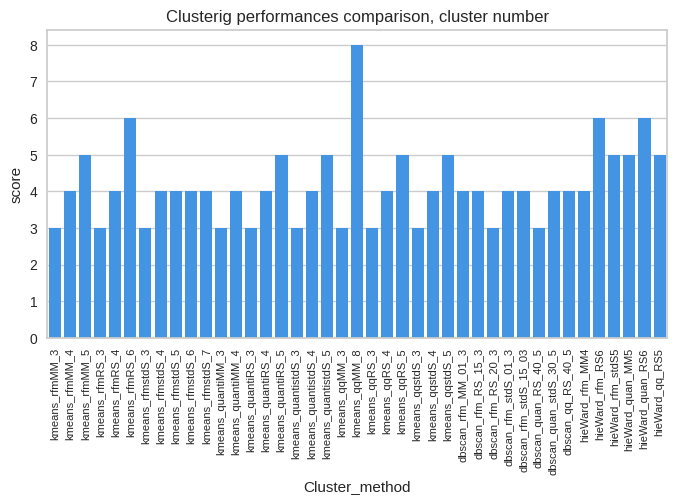

In [148]:
# Cluster Number visualization
# ---------------------------------------------------------------------

comparison_perf_melt = pd.melt(df_algo_comp, id_vars=['Cluster_method'],
                               value_name='score',
                               value_vars=['Num_clusters'])
# Visualization
plt.figure(figsize=(8, 4))
sns.barplot(x=comparison_perf_melt['Cluster_method'],
            y=comparison_perf_melt['score'],
            color="#2994ff", errorbar=None)
plt.title("Clusterig performances comparison, cluster number",
          fontsize=12)

plt.xticks(rotation=90, fontsize=8)
plt.show()


* The smallest number of clusters per algorithm was determined by a search for the best hyperparameters for each algorithm. 
* Exploratory analysis of the data has revealed a high abundance of unique buyers. 
* The segmentation of the data into a large number of clusters implies the appearance of clusters with very few individuals.
* The segmentation of the data into a low number of clusters implies low resolution in the description of the customers.
* We will work with tests that identify between 4 and 7 clusters.
* The three clustering methods explored present results with between 4 and 7 clusters for the three data sets analyzed.




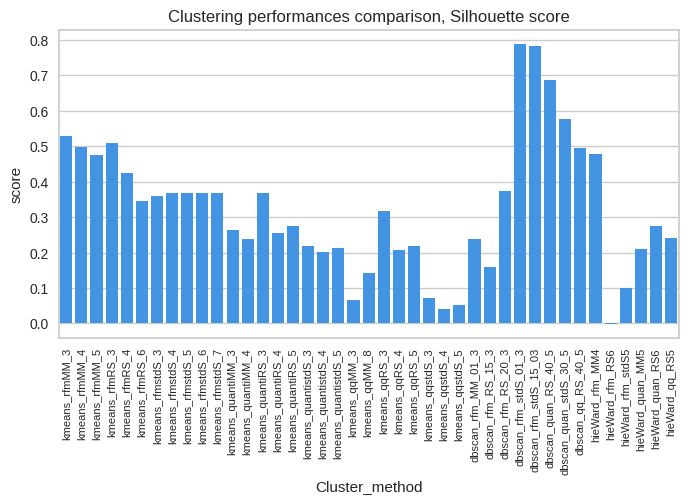

In [149]:
# Silhouette score visualization
# --------------------------------

comparison_perf_melt = pd.melt(df_algo_comp, id_vars=['Cluster_method'],
                               value_name='score',
                               value_vars=['coef_silh'])
# Visualization
plt.figure(figsize=(8, 4))
sns.barplot(x=comparison_perf_melt['Cluster_method'],
            y=comparison_perf_melt['score'],
            color="#2994ff", errorbar=None)
plt.title("Clustering performances comparison, Silhouette score",
          fontsize=12)
plt.xticks(rotation=90, fontsize=8)
plt.show()

**Reminder. Silhouette coefficient** : For each point, its silhouette coefficient is the difference between the average distance to points in the same group as it (cohesion, homogeneity) and the average distance to points in other neighboring groups (separation). If this difference is negative, it is thus badly classified. The closser to 1 the best.
* In all combinations of 'clustering method'/ 'data', with 4 to 6 clusters, there is at least one result with a positive silhouette coefficient.
* The highest values of the silhouette coefficient are obtained for :
    * K-means for RFM data data scaled with MinMaxScaler, with k=4 and 5
    * K-means for RFM data data scaled with RobustScaler, with k=4 and 6
    * K-means for RFM data data scaled with Standard, with k=4,5 and 6

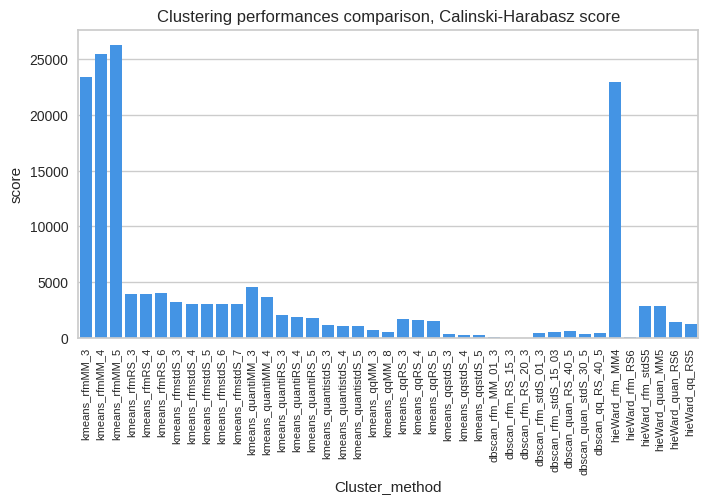

In [150]:
# calinski_harabasz score visualization
# ----------------------------------------

comparison_perf_melt = pd.melt(df_algo_comp, id_vars=['Cluster_method'],
                               value_name='score',
                               value_vars=['calinski_harabasz'])
# Visualization
plt.figure(figsize=(8, 4))
sns.barplot(x=comparison_perf_melt['Cluster_method'],
            y=comparison_perf_melt['score'],
            color="#2994ff", errorbar=None)

plt.title("Clustering performances comparison, Calinski-Harabasz score",
          fontsize=12)
plt.xticks(rotation=90, fontsize=8)
plt.show()

**Reminder. Calinski and Harabasz score** : The score is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.  The higher the score , the better the performances.

* All DBScan tests result in very low Calinski and Harabasz scores.
* There are four tests whose Calinski and Harabasz scores stand out above all the others :
  * K-means for RFM data data scaled with MinMaxScaler, with k=3
  * K-means for RFM data data scaled with MinMaxScaler, with k=4
  * K-means for RFM data data scaled with MinMaxScaler, with k=5
  * Hierarchical clustering with Wards method for RFM data scaled with MinMaxScaler, with k=4
* Overall, the tests with the DBScan clustering method obtain worst values for the Calinski and Harabasz score.
  

/tmp/ipykernel_14022/1834102501.py:4: FutureWarning: This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.
  comparison_perf_melt = pd.melt(df_algo_comp, id_vars=['Cluster_method'],


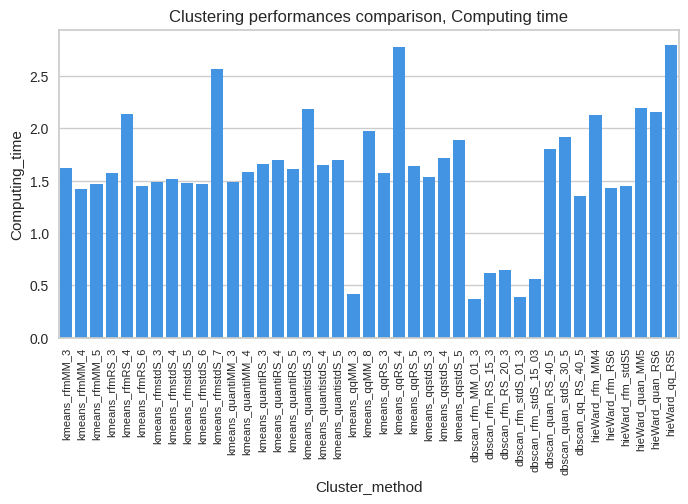

In [151]:
# Computing time visualization
# --------------------------------

comparison_perf_melt = pd.melt(df_algo_comp, id_vars=['Cluster_method'],
                               value_name='Computing_time',
                               value_vars=['Computing_time'])
# Visualization
plt.figure(figsize=(8, 4))
sns.barplot(x=comparison_perf_melt['Cluster_method'],
            y=comparison_perf_melt['Computing_time'],
            color="#2994ff", errorbar=None)
plt.title("Clustering performances comparison, Computing time",
          fontsize=12)
plt.xticks(rotation=90, fontsize=8)
plt.show()

In [152]:
# Quality criteria considered
# -----------------------------
df_algo_comp_numclust = df_algo_comp.loc[(df_algo_comp["Num_clusters"] >= 4)
                                        & (df_algo_comp["Num_clusters"] <= 7)]

df_algo_comp_numclust_silh = df_algo_comp_numclust.loc[
                                    df_algo_comp_numclust["coef_silh"] > 0]

df_algo_comp_numclust_silh_cal = df_algo_comp_numclust_silh.loc[
                    df_algo_comp_numclust_silh["calinski_harabasz"] > 1000]\
                        .sort_values(by="calinski_harabasz", ascending=True)

df_algo_comp_numclust_silh_cal_time = df_algo_comp_numclust_silh_cal.loc[
                    df_algo_comp_numclust_silh_cal["Computing_time"] < 2.0]

/tmp/ipykernel_14022/2555557236.py:3: FutureWarning: This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.
  comparison_perf_melt = pd.melt(df_algo_comp_numclust_silh_cal_time,


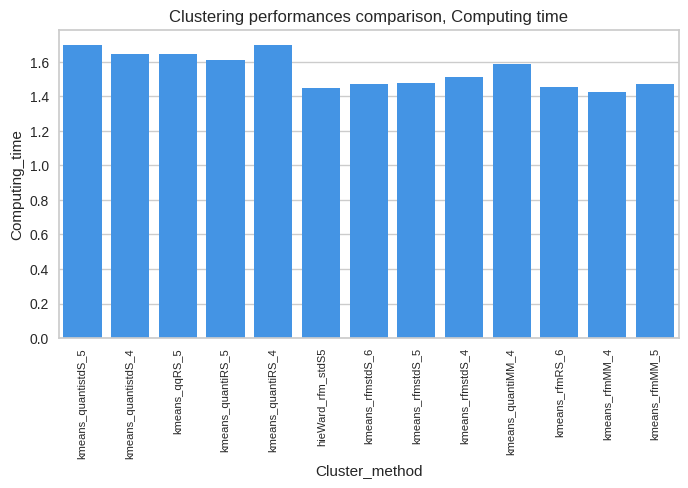

In [153]:
# Computing time visualization
# -------------------------------
comparison_perf_melt = pd.melt(df_algo_comp_numclust_silh_cal_time,
                               id_vars=['Cluster_method'],
                               value_name='Computing_time',
                               value_vars=['Computing_time'])
# Visualization
plt.figure(figsize=(8, 4))
sns.barplot(x=comparison_perf_melt['Cluster_method'],
            y=comparison_perf_melt['Computing_time'],
            color="#2994ff", errorbar=None)
plt.title("Clustering performances comparison, Computing time",
          fontsize=12)
plt.xticks(rotation=90, fontsize=8)
plt.show()

Some algorithms are very expensive in resources. Therefore, the selection of the optimal method and hyperparameters was performed on a subsample of 10% of the data set.<br>
* All the tests that stand out as having a long computational time will be discarded.
* None of the tests performed with DBScan or hierarchical clustering with the Wars method satisfy all the quality criteria.
* Among the tests that meet the criteria previously analyzed (number of clusters, silhouette coefficient, Calinski and Harabasz coefficients),  model-dataset combinations that have acceptable computational times are :
  * k-means on RFM and Quantitative, with any of the three scalers used.
  * k-means on quanti&quali data, with Robust scalers.
 


---
---
**Summary**

None of the tests performed with quantitative and qualitative data show good results.
The models and hyperparameter configurations retained for the study of each of the data sets are:

| Data set | Scaler | Clustering model | Hyperparameters configuration |
| --- | --- | ---| ---|
| RFM | MinMax | k-means | k =5 |
| RFM | Robust | k-means | k =4 |
| RFM | Robust | k-means | k =6 |
| RFM | Standard | k-means | k =5 |
| RFM | Standard | k-means | k =6 |
| RFM | Standard | k-means | k =7 |
| RFM | MinMax | Hiearchical Ward's | 4 |
| RFM | Standard | Hiearchical Ward's | 5 |
| Quantitative | MinMax | k-means | k =4 |
| Quantitative | Robust | k-means | k =4 |
| Quantitative | Robust | k-means | k =5 |
| Quantitative | Standard | k-means | k =4 |
| Quantitative | Standard | k-means | k =5 |
| Quanti&Quali | Robust | k-means | k =4 |
| Quanti&Quali | Robust | k-means | k =5 |


---
---
<a id="cluster_stability_initialitation"></a>

## <font color = '#0085dd'>Cluster initialitation stability</font>

In [154]:
# Dataframe for saving the scores for clusters initalitation stability,
# ARI scores
df_init_stab = pd.DataFrame()

In [155]:
# K-means, RFM, MinMax scaler, k=4
kmeans_rfmMM_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_rfmMM_4", "RFM", "MinMax",
                                        kmeans_rfmMM_4,
                                        X_rfm_ss_MM,
                                        df_init_stab)


In [156]:
# K-means, RFM, MinMax scaler, k=5
kmeans_rfmMM_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                                random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_rfmMM_5", "RFM", "MinMax",
                                        kmeans_rfmMM_5,
                                        X_rfm_ss_MM,
                                        df_init_stab)

In [157]:
# K-means, RFM, Robust scaler, k=4
kmeans_rfmRS_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_rfmRS_4", "RFM", "Robust",
                                        kmeans_rfmRS_4,
                                        X_rfm_ss_RS,
                                        df_init_stab)

In [158]:
# K-means, RFM, Robust scaler, k=6
kmeans_rfmRS_6 = cluster.KMeans(n_clusters=6, n_init=10, init="k-means++",
                                random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_rfmRS_6", "RFM", "Robust",
                                        kmeans_rfmRS_6,
                                        X_rfm_ss_RS,
                                        df_init_stab)

In [159]:
# K-means, RFM, Standard scaler, k=4

kmeans_rfmStd_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                 random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_rfmStd_4", "RFM", "Standard",
                                        kmeans_rfmStd_4,
                                        X_rfm_ss_stdS,
                                        df_init_stab)

In [160]:
# K-means, RFM, Standard scaler, k=5
kmeans_rfmStd_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                                 random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_rfmStd_5", "RFM", "Standard",
                                        kmeans_rfmStd_5,
                                        X_rfm_ss_stdS,
                                        df_init_stab)

In [161]:
# K-means, RFM, Standard scaler, k=6
kmeans_rfmStd_6 = cluster.KMeans(n_clusters=6, n_init=10, init="k-means++",
                                 random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_rfmStd_6", "RFM", "Standard",
                                        kmeans_rfmStd_6,
                                        X_rfm_ss_stdS,
                                        df_init_stab)

In [162]:
# Hierarchical clustering, Ward's method, RFM, Standard scaler, 5

hieWard_rfm_stdS5 = cluster.AgglomerativeClustering(n_clusters=5,
                                                  linkage="ward")

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("hieWard_rfm_stdS5", "RFM",
                                        "Standard",
                                        hieWard_rfm_stdS5, X_rfm_ss_stdS,
                                        df_init_stab)

In [163]:
# K-means, Quantitative data, MinMax scaler, k=4
kmeans_quantiMM_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                   random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_quantiMM_4", "Quantitative",
                                        "MinMax",
                                        kmeans_quantiMM_4,
                                        X_ss_quanti_MM,
                                        df_init_stab)

In [164]:
# K-means, Quantitative data, Robust scaler, k=4
kmeans_quantiRS_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                   random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_quantiRS_4", "Quantitative",
                                        "Robust",
                                        kmeans_quantiRS_4,
                                        X_ss_quanti_RS,
                                        df_init_stab)

In [165]:
# K-means, Quantitative data, Robust scaler, k=5
kmeans_quantiRS_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                                   random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_quantiRS_5", "Quantitative",
                                        "Robust",
                                        kmeans_quantiRS_5,
                                        X_ss_quanti_RS,
                                        df_init_stab)

In [166]:
# K-means, Quantitative data, Standard scaler, k=4
kmeans_quantistdS_4 = cluster.KMeans(n_clusters=4, n_init=10,
                                     init="k-means++", random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_quantistdS_4",
                                        "Quantitative", "Robust",
                                        kmeans_quantistdS_4,
                                        X_ss_quanti_stdS,
                                        df_init_stab)

In [167]:
# K-means, Quantitative data, Standard scaler, k=5
kmeans_quantistdS_5 = cluster.KMeans(n_clusters=5, n_init=10,
                                     init="k-means++", random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_quantistdS_5",
                                        "Quantitative", "Robust",
                                        kmeans_quantistdS_5,
                                        X_ss_quanti_stdS,
                                        df_init_stab)

In [168]:
# K-means, QuantiQuali data, Robust scaler, k=5
kmeans_qqRS_5 = cluster.KMeans(n_clusters=5, n_init=10,
                               init="k-means++", random_state=seed)

# Score for clusters initalitation stability
df_init_stab = initialitation_stability("kmeans_qqRS_5", "QuantiQuali",
                                        "Robust",
                                        kmeans_qqRS_5,
                                        X_ss_qq_RS,
                                        df_init_stab)
df_init_stab.style.hide(axis="index")

Cluster_method,Dataset,Scaler,ARI_mean,ARI_std
kmeans_rfmMM_4,RFM,MinMax,1.000000,0.000000
kmeans_rfmMM_5,RFM,MinMax,1.000000,0.000000
kmeans_rfmRS_4,RFM,Robust,1.000000,0.000000
kmeans_rfmRS_6,RFM,Robust,1.000000,0.000000
kmeans_rfmStd_4,RFM,Standard,1.000000,0.000000
kmeans_rfmStd_5,RFM,Standard,1.000000,0.000000
kmeans_rfmStd_6,RFM,Standard,1.000000,0.000000
hieWard_rfm_stdS5,RFM,Standard,1.000000,0.000000
kmeans_quantiMM_4,Quantitative,MinMax,1.000000,0.000000
kmeans_quantiRS_4,Quantitative,Robust,1.000000,0.000000


/tmp/ipykernel_14022/557108504.py:4: FutureWarning: This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.
  comparison_perf_melt = pd.melt(df_init_stab, id_vars=["Cluster_method"],


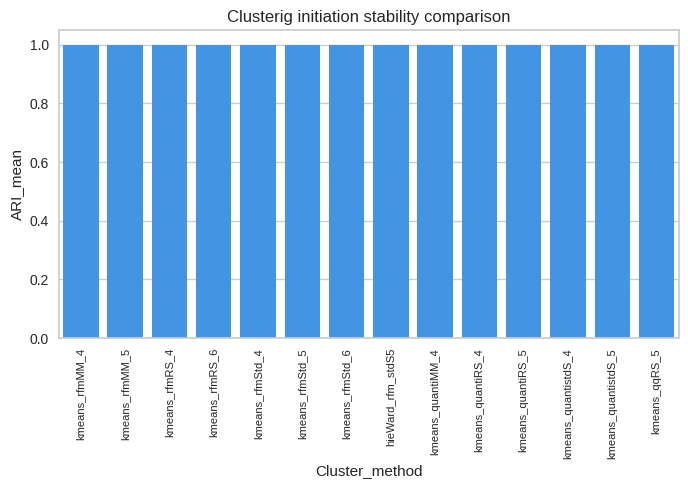

In [169]:
# Cluster Number visualization
# ---------------------------------------------------------------------

comparison_perf_melt = pd.melt(df_init_stab, id_vars=["Cluster_method"],
                               value_name="ARI_mean",
                                value_vars=["ARI_mean"])
# Visualization
plt.figure(figsize=(8, 4))
sns.barplot(x=comparison_perf_melt["Cluster_method"],
            y=comparison_perf_melt["ARI_mean"],
            color="#2994ff", errorbar=None)
plt.title("Clusterig initiation stability comparison",
          fontsize=12)

plt.xticks(rotation=90, fontsize=8)
plt.show()

---
---
<a id="prelim_analysis_selec_config"></a>

## <font color = '#0085dd'>Preliminary analysis of selected configurations</font>

<a id='rfm_mm_kmeans_4'></a>

### <span style='background:#0075bc'><span style='color:white'>RFM MinMax scaled, k-means, k=4</span></span>


In [170]:
# K-means, RFM, MinMax scaler, k=4
kmeans_rfmMM_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                random_state=seed)
clusters_kmeans_rfmMM_4 = kmeans_rfmMM_4.fit_predict(X_rfm_ss_MM)
kmeans_rfmMM_4_labels = kmeans_rfmMM_4.labels_

In [171]:
# Adding the cluster assignment to the dataframe
df_kmeans_rfm_MM4 = df_customers_subsample.copy()
df_kmeans_rfm_MM4["kmeans_rfmMM_4"] = kmeans_rfmMM_4.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_rfmMM_4,num_entries,Frequency_%
2,2674,29.333041
3,2461,26.996490
1,2442,26.788065
0,1539,16.882405


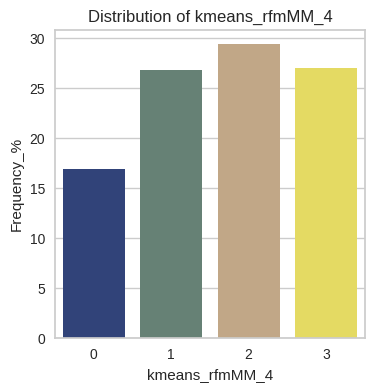

In [172]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_rfm_MM4, "kmeans_rfmMM_4", palette4)

<span style='background:#00649a'><span style='color:white'>RFM features pairplot, clusters hue</span></span>

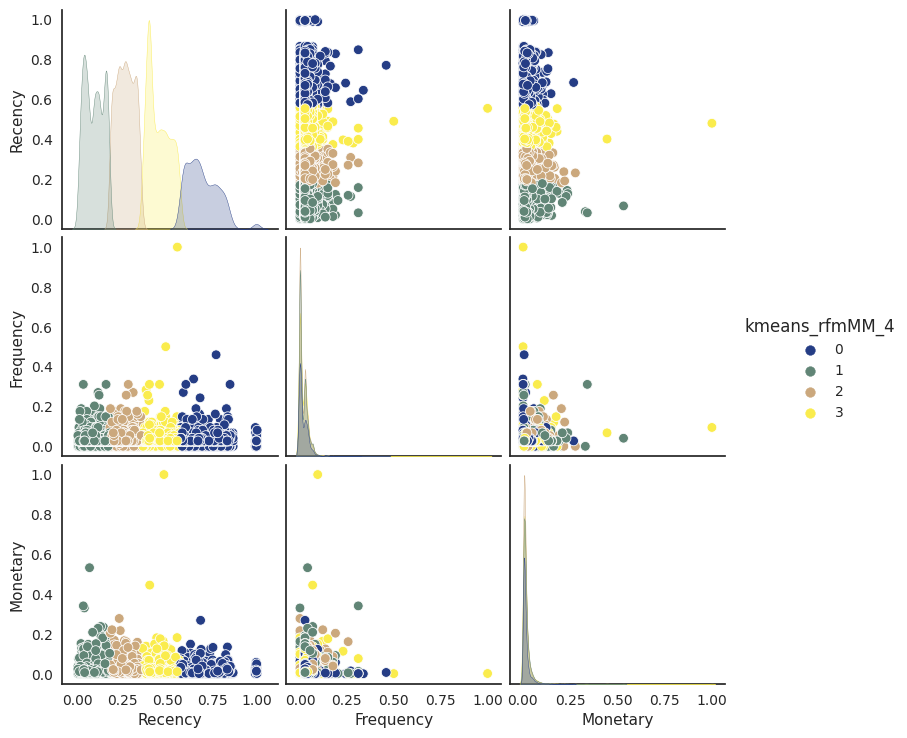

In [173]:
# Pairplot des différents types de client
# ---------------------------------------------------------------------
# Standardisation pour répartir également le poids de variables RFM
df_kmeans_rfm_MM4_pairplot = df_kmeans_rfm_MM4.copy()

scaler_MinMax = MinMaxScaler(feature_range=(0, 1))
df_kmeans_rfm_MM4_pairplot["Recency"] = scaler_MinMax.fit_transform(
    df_kmeans_rfm_MM4_pairplot['Recency'].values.reshape(-1, 1))
df_kmeans_rfm_MM4_pairplot["Frequency"] = scaler_MinMax.fit_transform(
    df_kmeans_rfm_MM4_pairplot['Frequency'].values.reshape(-1, 1))
df_kmeans_rfm_MM4_pairplot["Monetary"] = scaler_MinMax.fit_transform(
    df_kmeans_rfm_MM4_pairplot["Monetary"].values.reshape(-1, 1))

sns.set_style("white")
sns.pairplot(df_kmeans_rfm_MM4_pairplot,
             vars=["Recency", "Frequency", "Monetary"],
             hue="kmeans_rfmMM_4", palette=palette4)
plt.show()

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/3087597658.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterMM_4kmean = df_kmeans_rfm_MM4.groupby("kmeans_rfmMM_4")\


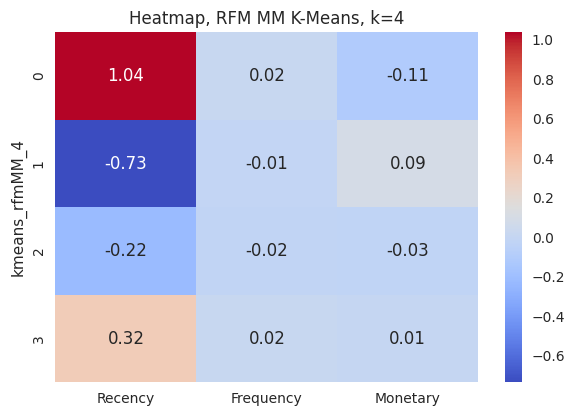

In [174]:
# ----------------------
# Dataframe preparation
# ----------------------

# Features mean
RFM_mean = df_kmeans_rfm_MM4.iloc[:, 3:6].mean()

# Calculation of the proportional deviation from the total average
clusterMM_4kmean = df_kmeans_rfm_MM4.groupby("kmeans_rfmMM_4")\
                                            .mean().iloc[:, 2:5]
prop_rfmMM_4kcluster = clusterMM_4kmean/RFM_mean - 1
prop_rfmMM_4kcluster = prop_rfmMM_4kcluster.loc[[0, 1, 2, 3]]

# ------------------------
# Visualization Heatmap :
# ------------------------
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_rfmMM_4kcluster, cmap='coolwarm', fmt='.2f', annot=True)
plt.title('Heatmap, RFM MM K-Means, k=4')
plt.plot()

plt.show()

<a id='rfm_mm_kmeans_5'></a>

### <span style='background:#0075bc'><span style='color:white'>RFM MinMax scaled, k-means, k=5</span></span>


In [175]:
# K-means, RFM, MinMax scaler, k=5
kmeans_rfmMM_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                                random_state=seed)
clusters_kmeans_rfmMM_5 = kmeans_rfmMM_5.fit_predict(X_rfm_ss_MM)
kmeans_rfmMM_5_labels = kmeans_rfmMM_5.labels_

In [176]:
# Adding the cluster assignment to the dataframe
df_kmeans_rfm_MM5 = df_customers_subsample.copy()
df_kmeans_rfm_MM5["kmeans_rfmMM_5"] = kmeans_rfmMM_5.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_rfmMM_5,num_entries,Frequency_%
2,2432,26.678368
0,2150,23.584906
4,1911,20.963142
1,1524,16.717859
3,1099,12.055726


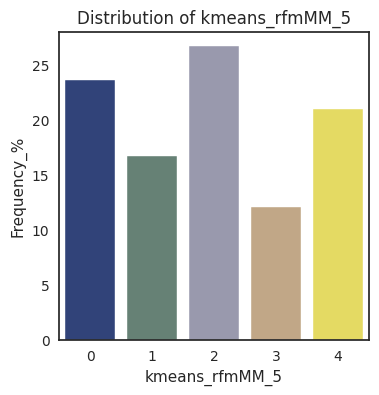

In [177]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_rfm_MM5, "kmeans_rfmMM_5", palette5)

<span style='background:#00649a'><span style='color:white'>RFM features pairplot, clusters hue</span></span>

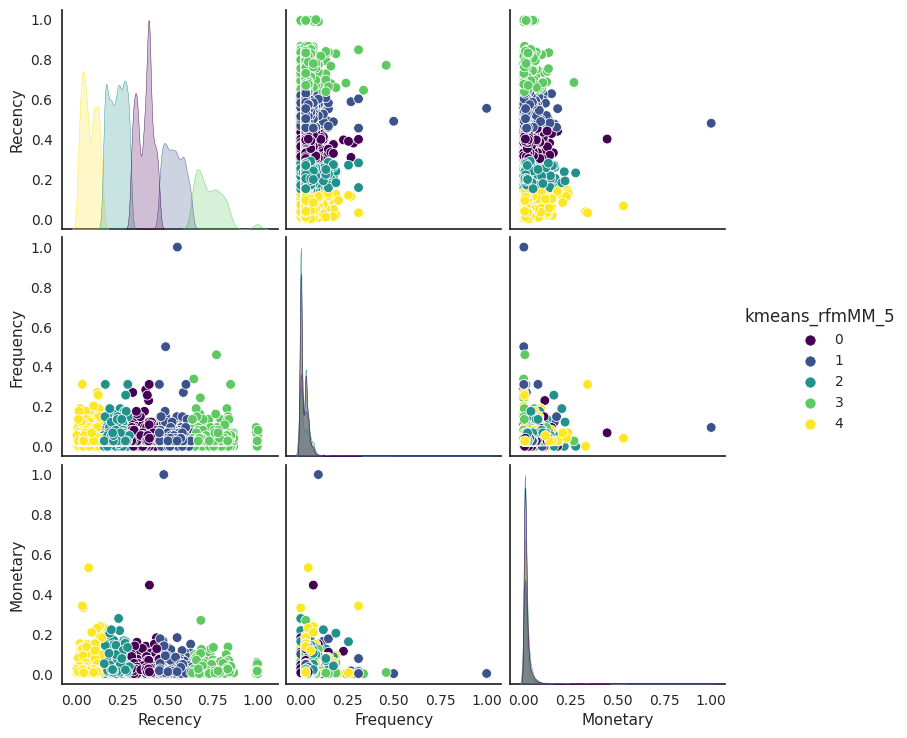

In [178]:
# Pairplot des différents types de client
# ---------------------------------------------------------------------
# Standardisation pour répartir également le poids de variables RFM
df_kmeans_rfm_MM5_pairplot = df_kmeans_rfm_MM5.copy()

scaler_MinMax = MinMaxScaler(feature_range=(0, 1))
df_kmeans_rfm_MM5_pairplot["Recency"] = scaler_MinMax.fit_transform(
    df_kmeans_rfm_MM5_pairplot['Recency'].values.reshape(-1, 1))
df_kmeans_rfm_MM5_pairplot["Frequency"] = scaler_MinMax.fit_transform(
    df_kmeans_rfm_MM5_pairplot['Frequency'].values.reshape(-1, 1))
df_kmeans_rfm_MM5_pairplot["Monetary"] = scaler_MinMax.fit_transform(
    df_kmeans_rfm_MM5_pairplot["Monetary"].values.reshape(-1, 1))

sns.set_style("white")
sns.pairplot(df_kmeans_rfm_MM5_pairplot,
             vars=["Recency", "Frequency", "Monetary"],
             hue="kmeans_rfmMM_5", palette="viridis")
plt.show()

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/4057024498.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterMM_5kmean = df_kmeans_rfm_MM5.groupby("kmeans_rfmMM_5")\


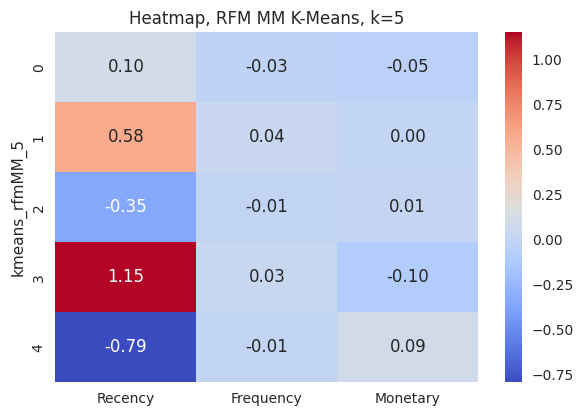

In [179]:
# ----------------------
# Dataframe preparation
# ----------------------

# Features mean
RFM_mean = df_kmeans_rfm_MM5.iloc[:, 3:6].mean()

# Calculation of the proportional deviation from the total average
clusterMM_5kmean = df_kmeans_rfm_MM5.groupby("kmeans_rfmMM_5")\
                                            .mean().iloc[:, 2:5]
prop_rfmMM_5kcluster = clusterMM_5kmean/RFM_mean - 1
prop_rfmMM_5kcluster = prop_rfmMM_5kcluster.loc[[0, 1, 2, 3, 4]]

# ------------------------
# Visualization Heatmap :
# ------------------------
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_rfmMM_5kcluster, cmap='coolwarm', fmt='.2f', annot=True)
plt.title('Heatmap, RFM MM K-Means, k=5')
plt.plot()

plt.show()

<a id='kmeans_rfmRS_4'></a>

### <span style='background:#0075bc'><span style='color:white'>RFM Robust scaled, k-means, k=4</span></span>


In [180]:
# K-means, RFM, Robust scaler, k=4

kmeans_rfmRS_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                random_state=seed)
clusters_kmeans_rfmRS_4 = kmeans_rfmRS_4.fit_predict(X_rfm_ss_RS)
kmeans_rfmRS_4_labels = kmeans_rfmRS_4.labels_

In [181]:
# Adding the cluster assignment to the dataframe
df_kmeans_rfmRS_4 = df_customers_subsample.copy()
df_kmeans_rfmRS_4["kmeans_rfmRS_4"] = kmeans_rfmRS_4.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

In [182]:
df_kmeans_rfmRS_4.shape

(9116, 20)

kmeans_rfmRS_4,num_entries,Frequency_%
0,6762,74.177271
1,2074,22.751207
2,275,3.016674
3,5,0.054849


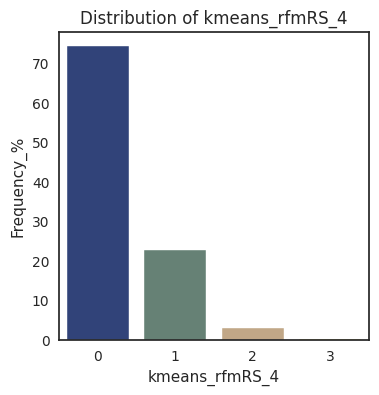

In [183]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_rfmRS_4, "kmeans_rfmRS_4", palette4)

<span style='background:#00649a'><span style='color:white'>RFM features pairplot, clusters hue</span></span>

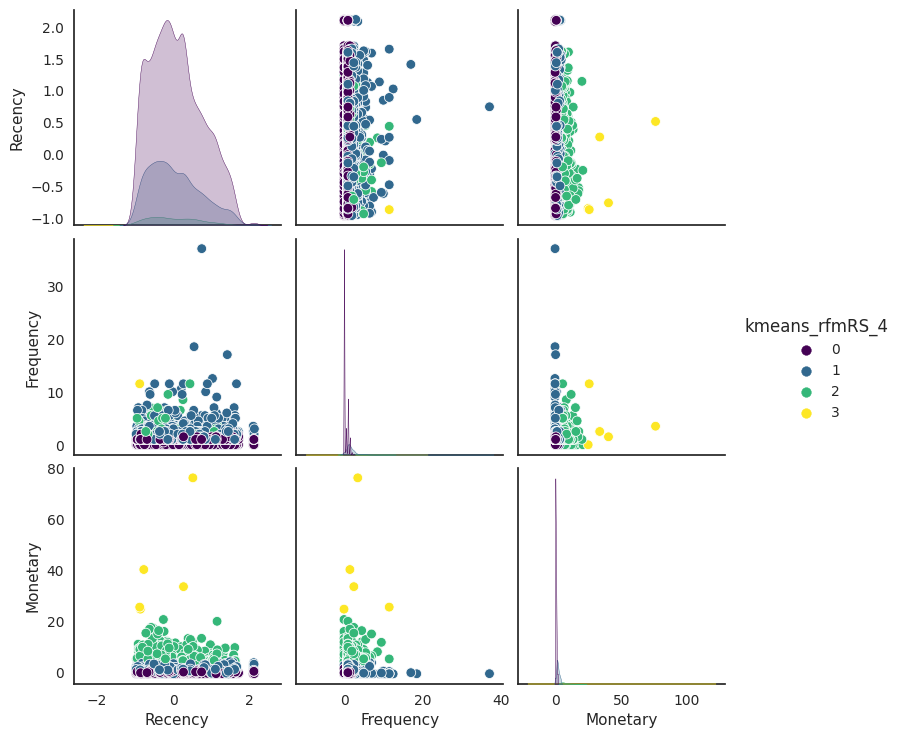

In [184]:
# Pairplot des différents types de client
# ---------------------------------------------------------------------
# Standardisation pour répartir également le poids de variables RFM
df_kmeans_rfmRS_4_pairplot = df_kmeans_rfmRS_4.copy()

df_kmeans_rfmRS_4_pairplot["Recency"] = scaler_RobS.fit_transform(
    df_kmeans_rfmRS_4_pairplot['Recency'].values.reshape(-1, 1))
df_kmeans_rfmRS_4_pairplot["Frequency"] = scaler_RobS.fit_transform(
    df_kmeans_rfmRS_4_pairplot['Frequency'].values.reshape(-1, 1))
df_kmeans_rfmRS_4_pairplot["Monetary"] = scaler_RobS.fit_transform(
    df_kmeans_rfmRS_4_pairplot["Monetary"].values.reshape(-1, 1))

sns.set_style("white")
sns.pairplot(df_kmeans_rfmRS_4_pairplot,
             vars=["Recency", "Frequency", "Monetary"],
             hue="kmeans_rfmRS_4", palette="viridis")
plt.show()

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/3562721217.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterRS_4kmean = df_kmeans_rfmRS_4.groupby("kmeans_rfmRS_4")\


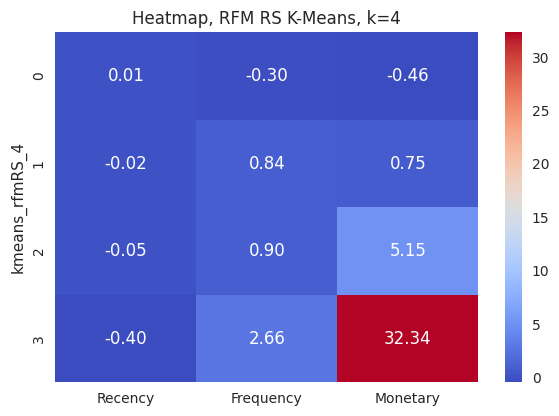

In [185]:
# ----------------------
# Dataframe preparation
# ----------------------

# Features mean
RFM_mean = df_kmeans_rfmRS_4.iloc[:, 3:6].mean()

# Calculation of the proportional deviation from the total average
clusterRS_4kmean = df_kmeans_rfmRS_4.groupby("kmeans_rfmRS_4")\
                                            .mean().iloc[:, 2:5]
prop_rfmRS_4kcluster = clusterRS_4kmean/RFM_mean - 1
prop_rfmRS_4kcluster = prop_rfmRS_4kcluster.loc[[0, 1, 2, 3]]

# ------------------------
# Visualization Heatmap :
# ------------------------
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_rfmRS_4kcluster, cmap='coolwarm', fmt='.2f', annot=True)
plt.title("Heatmap, RFM RS K-Means, k=4")
plt.plot()

plt.show()

<a id='kmeans_rfmRS_6'></a>

### <span style='background:#0075bc'><span style='color:white'>RFM Robust scaled, k-means, k=6</span></span>


In [186]:
# K-means, RFM, Robust scaler, k=6
kmeans_rfmRS_6 = cluster.KMeans(n_clusters=6, n_init=10, init="k-means++",
                                random_state=seed)
clusters_kmeans_rfmRS_6 = kmeans_rfmRS_6.fit_predict(X_rfm_ss_RS)
kmeans_rfmRS_6_labels = kmeans_rfmRS_6.labels_

In [187]:
# Adding the cluster assignment to the dataframe
df_kmeans_rfmRS_6 = df_customers_subsample.copy()
df_kmeans_rfmRS_6["kmeans_rfmRS_6"] = kmeans_rfmRS_6.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_rfmRS_6,num_entries,Frequency_%
1,5083,55.759105
0,2827,31.011409
3,985,10.805178
2,136,1.491882
5,80,0.877578
4,5,0.054849


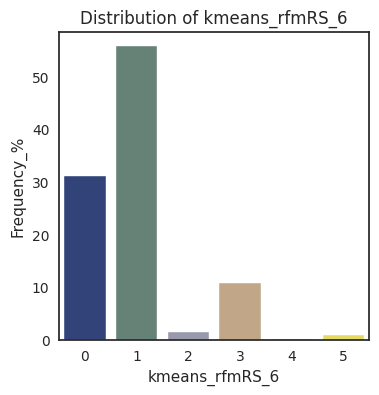

In [188]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_rfmRS_6, "kmeans_rfmRS_6", palette6)

<span style='background:#00649a'><span style='color:white'>RFM features pairplot, clusters hue</span></span>

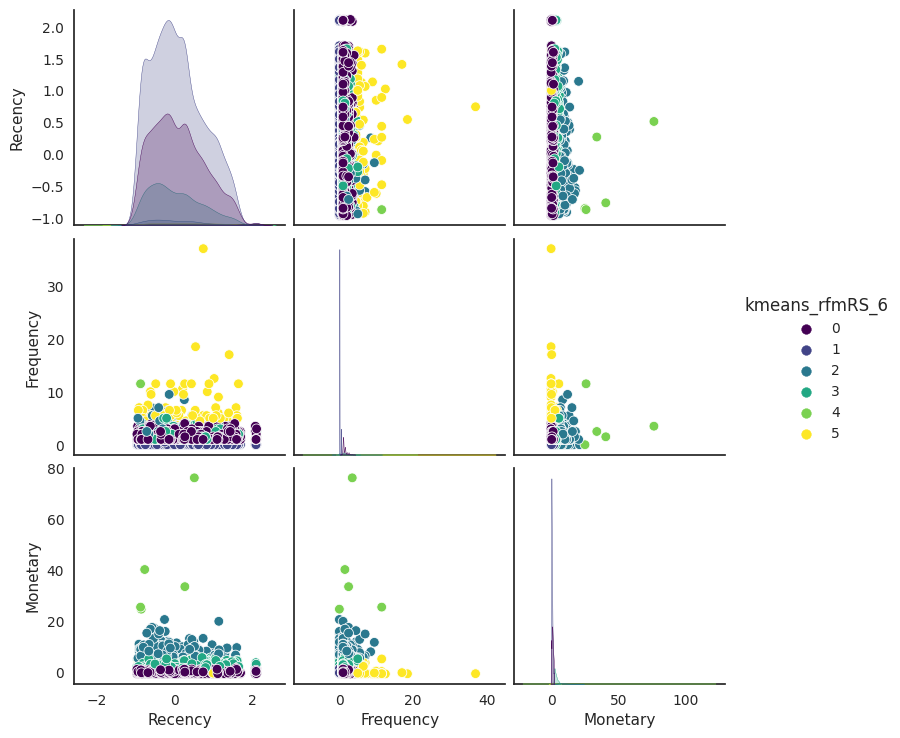

In [189]:
# Pairplot des différents types de client
# ---------------------------------------------------------------------
# Standardisation pour répartir également le poids de variables RFM
df_kmeans_rfmRS_6_pairplot = df_kmeans_rfmRS_6.copy()

df_kmeans_rfmRS_6_pairplot["Recency"] = scaler_RobS.fit_transform(
    df_kmeans_rfmRS_6_pairplot['Recency'].values.reshape(-1, 1))
df_kmeans_rfmRS_6_pairplot["Frequency"] = scaler_RobS.fit_transform(
    df_kmeans_rfmRS_6_pairplot['Frequency'].values.reshape(-1, 1))
df_kmeans_rfmRS_6_pairplot["Monetary"] = scaler_RobS.fit_transform(
    df_kmeans_rfmRS_6_pairplot["Monetary"].values.reshape(-1, 1))

sns.set_style("white")
sns.pairplot(df_kmeans_rfmRS_6_pairplot,
             vars=["Recency", "Frequency", "Monetary"],
             hue="kmeans_rfmRS_6", palette="viridis")
plt.show()

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/2573859337.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterRS_6kmean = df_kmeans_rfmRS_6.groupby("kmeans_rfmRS_6")\


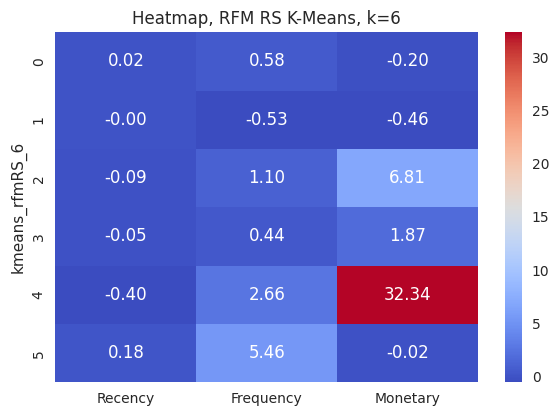

In [190]:
# ----------------------
# Dataframe preparation
# ----------------------

# Features mean
RFM_mean = df_kmeans_rfmRS_6.iloc[:, 3:6].mean()

# Calculation of the proportional deviation from the total average
clusterRS_6kmean = df_kmeans_rfmRS_6.groupby("kmeans_rfmRS_6")\
                                        .mean().iloc[:, 2:5]
prop_rfmRS_6kcluster = clusterRS_6kmean/RFM_mean - 1
prop_rfmRS_6kcluster = prop_rfmRS_6kcluster.loc[[0, 1, 2, 3, 4, 5]]

# ------------------------
# Visualization Heatmap :
# ------------------------
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_rfmRS_6kcluster, cmap='coolwarm', fmt='.2f', annot=True)
plt.title("Heatmap, RFM RS K-Means, k=6")
plt.plot()

plt.show()

<a id='kmeans_rfmStd_4'></a>

### <span style='background:#0075bc'><span style='color:white'>RFM Standard scaled, k-means, k=4</span></span>


In [191]:
# K-means, RFM, Standard scaler, k=4

kmeans_rfmStd_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                 random_state=seed)
clusters_kmeans_rfmStd_4 = kmeans_rfmStd_4.fit_predict(X_rfm_ss_stdS)
kmeans_rfmStd_4_labels = kmeans_rfmStd_4.labels_

In [192]:
# Adding the cluster assignment to the dataframe
df_kmeans_rfmStd_4 = df_customers_subsample.copy()
df_kmeans_rfmStd_4["kmeans_rfmStd_4"] = kmeans_rfmStd_4.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_rfmStd_4,num_entries,Frequency_%
1,4516,49.539272
2,3449,37.834577
0,1003,11.002633
3,148,1.623519


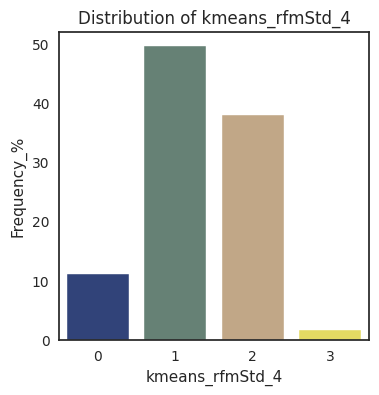

In [193]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_rfmStd_4, "kmeans_rfmStd_4", palette4)

<span style='background:#00649a'><span style='color:white'>RFM features pairplot, clusters hue</span></span>

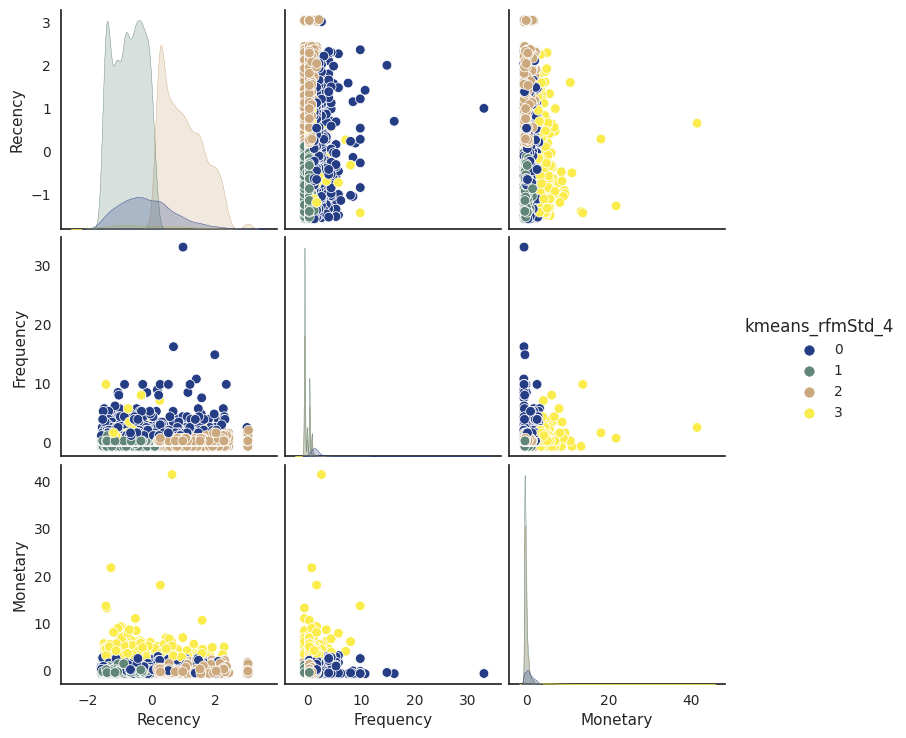

In [194]:
# Pairplot des différents types de client
# ---------------------------------------------------------------------
# Standardisation pour répartir également le poids de variables RFM
df_kmeans_rfmStd_5_pairplot = df_kmeans_rfmStd_4.copy()

df_kmeans_rfmStd_5_pairplot["Recency"] = scaler_stdS.fit_transform(
    df_kmeans_rfmStd_5_pairplot['Recency'].values.reshape(-1, 1))
df_kmeans_rfmStd_5_pairplot["Frequency"] = scaler_stdS.fit_transform(
    df_kmeans_rfmStd_5_pairplot['Frequency'].values.reshape(-1, 1))
df_kmeans_rfmStd_5_pairplot["Monetary"] = scaler_stdS.fit_transform(
    df_kmeans_rfmStd_5_pairplot["Monetary"].values.reshape(-1, 1))

sns.set_style("white")
sns.pairplot(df_kmeans_rfmStd_5_pairplot,
             vars=["Recency", "Frequency", "Monetary"],
             hue="kmeans_rfmStd_4", palette=palette4)
plt.show()

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/3786816310.py:10: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterstdS_4kmean = df_kmeans_rfmStd_4.groupby("kmeans_rfmStd_4")\


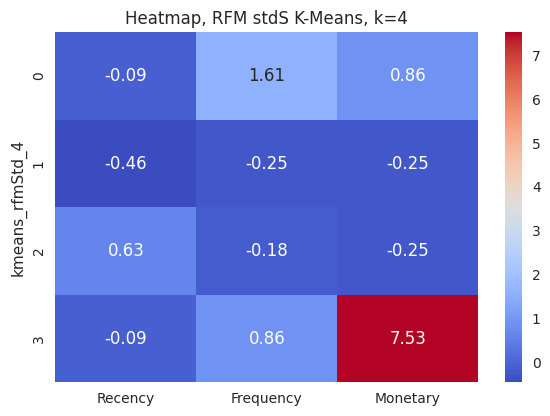

In [195]:
# ----------------------
# Dataframe preparation
# ----------------------

# Features mean
RFM_mean = df_kmeans_rfmStd_4.iloc[:, 3:6].mean()

# RFM customers k-means clusters : 6 clusters after k-means on scaled data
# Calculation of the proportional deviation from the total average
clusterstdS_4kmean = df_kmeans_rfmStd_4.groupby("kmeans_rfmStd_4")\
                                        .mean().iloc[:, 2:5]
prop_rfmstdS_4kcluster = clusterstdS_4kmean/RFM_mean - 1
prop_rfmstdS_4kcluster = prop_rfmstdS_4kcluster.loc[[0, 1, 2, 3]]

# ------------------------
# Visualization Heatmap :
# ------------------------
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_rfmstdS_4kcluster, cmap='coolwarm', fmt='.2f', annot=True)
plt.title("Heatmap, RFM stdS K-Means, k=4")
plt.plot()

plt.show()

<a id='kmeans_rfmStd_5'></a>

### <span style='background:#0075bc'><span style='color:white'>RFM Standard scaled, k-means, k=5</span></span>


In [196]:
# K-means, RFM, Standard scaler, k=5

kmeans_rfmStd_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                                 random_state=seed)
clusters_kmeans_rfmStd_5 = kmeans_rfmStd_5.fit_predict(X_rfm_ss_stdS)
kmeans_rfmStd_5_labels = kmeans_rfmStd_5.labels_

In [197]:
# Adding the cluster assignment to the dataframe
df_kmeans_rfmStd_5 = df_customers_subsample.copy()
df_kmeans_rfmStd_5["kmeans_rfmStd_5"] = kmeans_rfmStd_5.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_rfmStd_5,num_entries,Frequency_%
2,3798,41.663010
1,2677,29.365950
0,2342,25.691093
3,206,2.259763
4,93,1.020184


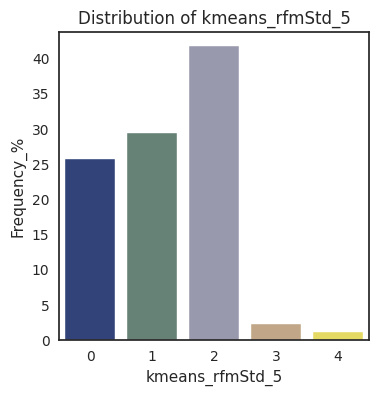

In [198]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_rfmStd_5, "kmeans_rfmStd_5", palette5)

<span style='background:#00649a'><span style='color:white'>RFM features pairplot, clusters hue</span></span>

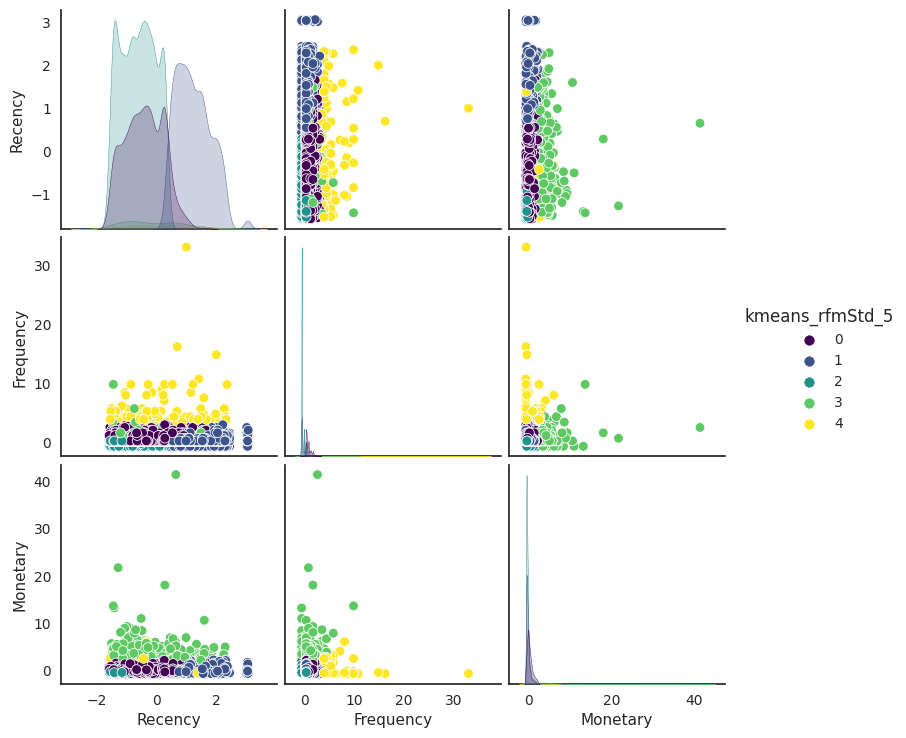

In [199]:
# Pairplot des différents types de client
# ---------------------------------------------------------------------
# Standardisation pour répartir également le poids de variables RFM
df_kmeans_rfmStd_5_pairplot = df_kmeans_rfmStd_5.copy()

df_kmeans_rfmStd_5_pairplot["Recency"] = scaler_stdS.fit_transform(
    df_kmeans_rfmStd_5_pairplot['Recency'].values.reshape(-1, 1))
df_kmeans_rfmStd_5_pairplot["Frequency"] = scaler_stdS.fit_transform(
    df_kmeans_rfmStd_5_pairplot['Frequency'].values.reshape(-1, 1))
df_kmeans_rfmStd_5_pairplot["Monetary"] = scaler_stdS.fit_transform(
    df_kmeans_rfmStd_5_pairplot["Monetary"].values.reshape(-1, 1))

sns.set_style("white")
sns.pairplot(df_kmeans_rfmStd_5_pairplot,
             vars=["Recency", "Frequency", "Monetary"],
             hue="kmeans_rfmStd_5", palette="viridis")
plt.show()

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/3874816458.py:10: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterstdS_5kmean = df_kmeans_rfmStd_5.groupby("kmeans_rfmStd_5")\


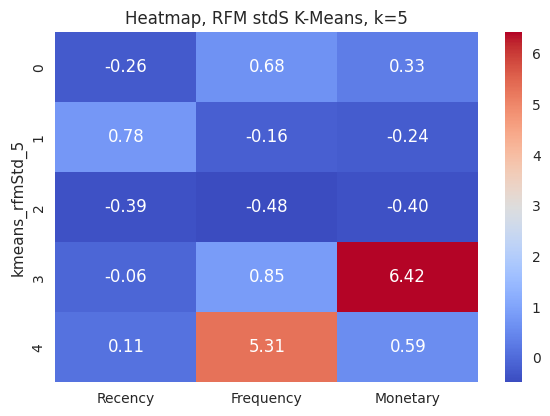

In [200]:
# ----------------------
# Dataframe preparation
# ----------------------

# Features mean
RFM_mean = df_kmeans_rfmStd_5.iloc[:, 3:6].mean()

# RFM customers k-means clusters : 6 clusters after k-means on scaled data
# Calculation of the proportional deviation from the total average
clusterstdS_5kmean = df_kmeans_rfmStd_5.groupby("kmeans_rfmStd_5")\
                                        .mean().iloc[:, 2:5]
prop_rfmstdS_5kcluster = clusterstdS_5kmean/RFM_mean - 1
prop_rfmstdS_5kcluster = prop_rfmstdS_5kcluster.loc[[0, 1, 2, 3, 4]]

# ------------------------
# Visualization Heatmap :
# ------------------------
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_rfmstdS_5kcluster, cmap='coolwarm', fmt='.2f', annot=True)
plt.title("Heatmap, RFM stdS K-Means, k=5")
plt.plot()

plt.show()

<a id='kmeans_rfmStd_6'></a>

### <span style='background:#0075bc'><span style='color:white'>RFM Standard scaled, k-means, k=6</span></span>


In [201]:
# K-means, RFM, Standard scaler, k=6

kmeans_rfmStd_6 = cluster.KMeans(n_clusters=6, n_init=10, init="k-means++",
                                 random_state=seed)
clusters_kmeans_rfmStd_6 = kmeans_rfmStd_6.fit_predict(X_rfm_ss_stdS)
kmeans_rfmStd_6_labels = kmeans_rfmStd_6.labels_

In [202]:
# Adding the cluster assignment to the dataframe
df_kmeans_rfmStd_6 = df_customers_subsample.copy()
df_kmeans_rfmStd_6["kmeans_rfmStd_6"] = kmeans_rfmStd_6.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_rfmStd_6,num_entries,Frequency_%
0,3629,39.809127
2,2624,28.784555
5,2401,26.338306
3,358,3.927161
1,99,1.086003
4,5,0.054849


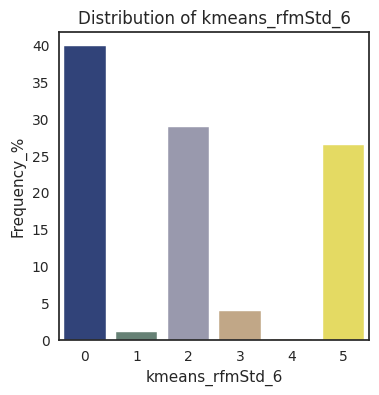

In [203]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_rfmStd_6, "kmeans_rfmStd_6", palette6)

<span style='background:#00649a'><span style='color:white'>RFM features pairplot, clusters hue</span></span>

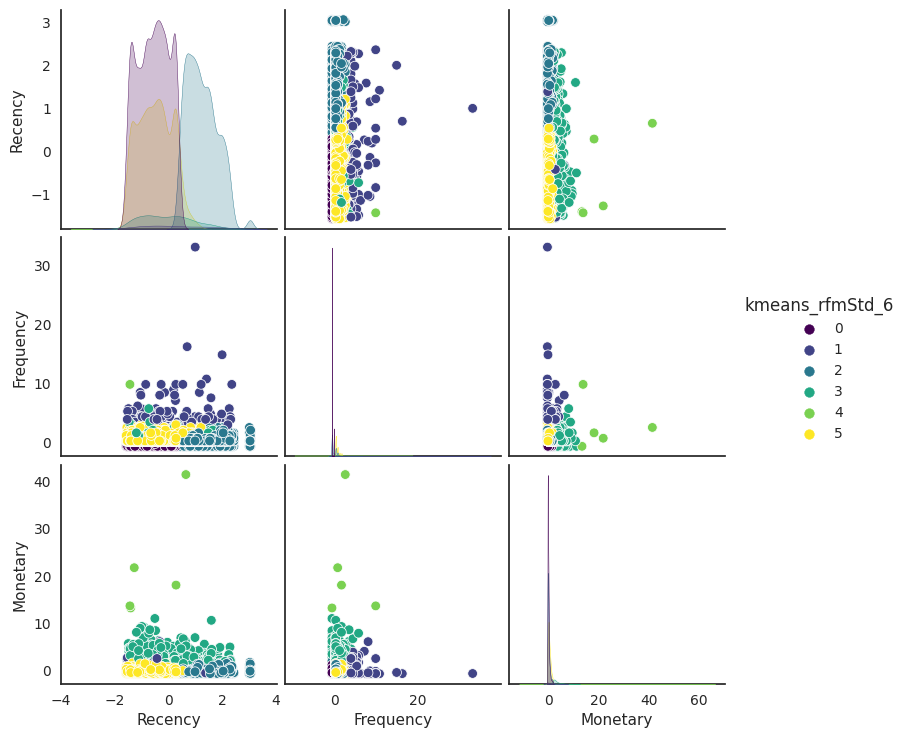

In [204]:
# Pairplot des différents types de client
# ---------------------------------------------------------------------
# Standardisation pour répartir également le poids de variables RFM
df_kmeans_rfmStd_6_pairplot = df_kmeans_rfmStd_6.copy()

df_kmeans_rfmStd_6_pairplot["Recency"] = scaler_stdS.fit_transform(
    df_kmeans_rfmStd_6_pairplot['Recency'].values.reshape(-1, 1))
df_kmeans_rfmStd_6_pairplot["Frequency"] = scaler_stdS.fit_transform(
    df_kmeans_rfmStd_6_pairplot['Frequency'].values.reshape(-1, 1))
df_kmeans_rfmStd_6_pairplot["Monetary"] = scaler_stdS.fit_transform(
    df_kmeans_rfmStd_6_pairplot["Monetary"].values.reshape(-1, 1))

sns.set_style("white")
sns.pairplot(df_kmeans_rfmStd_6_pairplot,
             vars=["Recency", "Frequency", "Monetary"],
             hue="kmeans_rfmStd_6", palette="viridis")
plt.show()

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/3493573099.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterstdS_6kmean = df_kmeans_rfmStd_6.groupby("kmeans_rfmStd_6")\


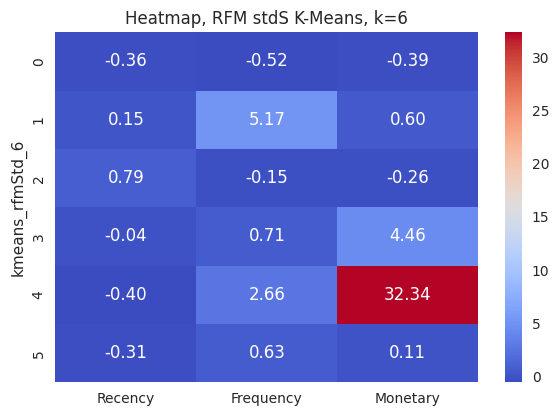

In [205]:
# ----------------------
# Dataframe preparation
# ----------------------

# Features mean
RFM_mean = df_kmeans_rfmStd_6.iloc[:, 3:6].mean()

# Calculation of the proportional deviation from the total average
clusterstdS_6kmean = df_kmeans_rfmStd_6.groupby("kmeans_rfmStd_6")\
                .mean().iloc[:, 2:5]
prop_rfmstdS_6kcluster = clusterstdS_6kmean/RFM_mean - 1
prop_rfmstdS_6kcluster = prop_rfmstdS_6kcluster.loc[[0, 1, 2, 3, 4, 5]]

# ------------------------
# Visualization Heatmap :
# ------------------------
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_rfmstdS_6kcluster, cmap='coolwarm', fmt='.2f', annot=True)
plt.title("Heatmap, RFM stdS K-Means, k=6")
plt.plot()

plt.show()

<a id='Hieward_rfmstdS_5'></a>

### <span style='background:#0075bc'><span style='color:white'>RFM Standard scaled, Hiearchical Ward's, 5</span></span>


In [206]:
# Hierarchical clustering, Ward's method, RFM, Standard scaler, 5

hieWard_rfm_stdS5 = cluster.AgglomerativeClustering(n_clusters=5,
                                                  linkage="ward")

clusters_hieWard_rfm_stdS5 = hieWard_rfm_stdS5.fit_predict(X_rfm_ss_stdS)
hieWard_rfm_stdS5_labels = hieWard_rfm_stdS5.labels_

In [207]:
# Adding the cluster assignment to the dataframe
df_hieWard_rfm_stdS5 = df_customers_subsample.copy()
df_hieWard_rfm_stdS5["hieWard_rfm_stdS5"] = hieWard_rfm_stdS5.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

hieWard_rfm_stdS5,num_entries,Frequency_%
4,3191,35.004388
2,2740,30.057043
3,2162,23.716542
0,890,9.763054
1,133,1.458973


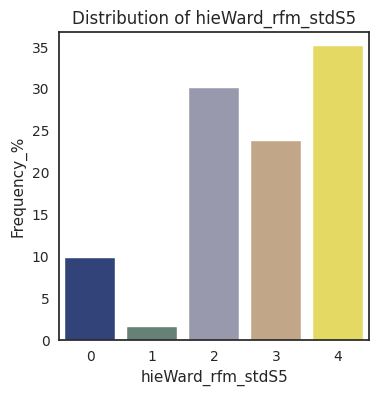

In [208]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_hieWard_rfm_stdS5, "hieWard_rfm_stdS5",palette5)

<span style='background:#00649a'><span style='color:white'>RFM features pairplot, clusters hue</span></span>

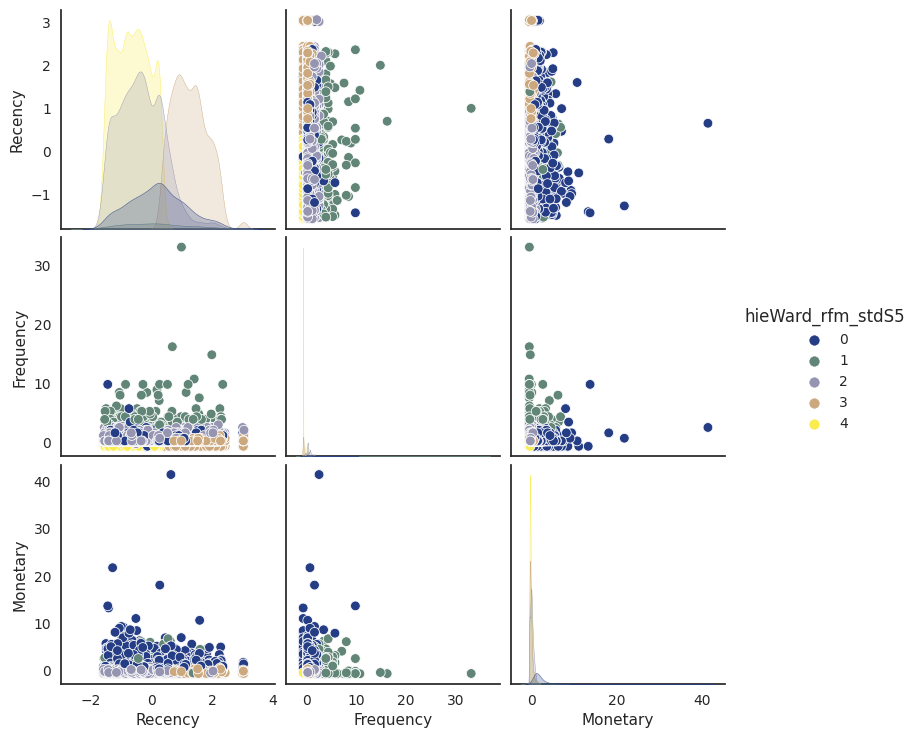

In [209]:
# Pairplot des différents types de client
# ---------------------------------------------------------------------
# Standardisation pour répartir également le poids de variables RFM
df_hieWard_rfm_stdS5_pairplot = df_hieWard_rfm_stdS5.copy()

df_hieWard_rfm_stdS5_pairplot["Recency"] = scaler_stdS.fit_transform(
    df_hieWard_rfm_stdS5_pairplot['Recency'].values.reshape(-1, 1))
df_hieWard_rfm_stdS5_pairplot["Frequency"] = scaler_stdS.fit_transform(
    df_hieWard_rfm_stdS5_pairplot['Frequency'].values.reshape(-1, 1))
df_hieWard_rfm_stdS5_pairplot["Monetary"] = scaler_stdS.fit_transform(
    df_hieWard_rfm_stdS5_pairplot["Monetary"].values.reshape(-1, 1))

sns.set_style("white")
sns.pairplot(df_hieWard_rfm_stdS5_pairplot,
             vars=["Recency", "Frequency", "Monetary"],
             hue="hieWard_rfm_stdS5", palette=palette5)
plt.show()

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/638092346.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterstdS_5HWard = df_hieWard_rfm_stdS5.groupby("hieWard_rfm_stdS5")\


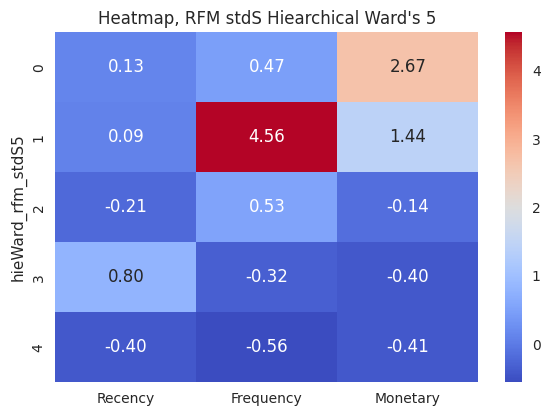

In [210]:
# ----------------------
# Dataframe preparation
# ----------------------

# Features mean
RFM_mean = df_hieWard_rfm_stdS5.iloc[:, 3:6].mean()

# Calculation of the proportional deviation from the total average
clusterstdS_5HWard = df_hieWard_rfm_stdS5.groupby("hieWard_rfm_stdS5")\
                .mean().iloc[:, 2:5]
prop_clusterstdS_5HWard = clusterstdS_5HWard/RFM_mean - 1
prop_clusterstdS_5HWard = prop_clusterstdS_5HWard.loc[[0, 1, 2, 3, 4]]

# ------------------------
# Visualization Heatmap :
# ------------------------
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_clusterstdS_5HWard, cmap='coolwarm', fmt='.2f', annot=True)
plt.title("Heatmap, RFM stdS Hiearchical Ward's 5")
plt.plot()

plt.show()

<a id='kmeans_quantiMM_4'></a>

### <span style='background:#0075bc'><span style='color:white'>Quantitative data MinMax scaled, k-means, k=4</span></span>


In [211]:
# K-means, Quantitative data, MinMax scaler, k=4

kmeans_quantiMM_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                   random_state=seed)
clusters_kmeans_quantiMM_4 = kmeans_quantiMM_4.fit_predict(X_ss_quanti_MM)
kmeans_quantiMM_4_labels = kmeans_quantiMM_4.labels_

In [212]:
# Adding the cluster assignment to the dataframe
df_kmeans_quantiMM_4 = df_customers_subsample.copy()
df_kmeans_quantiMM_4["kmeans_quantiMM_4"] = kmeans_quantiMM_4.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_quantiMM_4,num_entries,Frequency_%
3,3297,36.167179
0,2375,26.053093
1,1924,21.105748
2,1520,16.673980


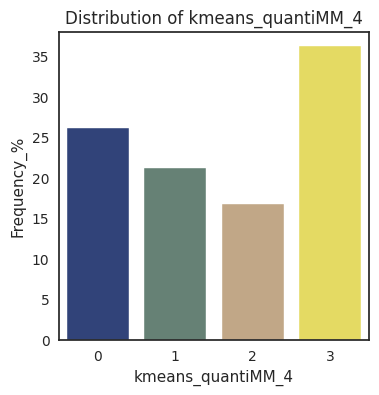

In [213]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_quantiMM_4, "kmeans_quantiMM_4", palette4)

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/3863200882.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterQantiMM_4kmean = df_kmeans_quantiMM_4.groupby("kmeans_quantiMM_4")\


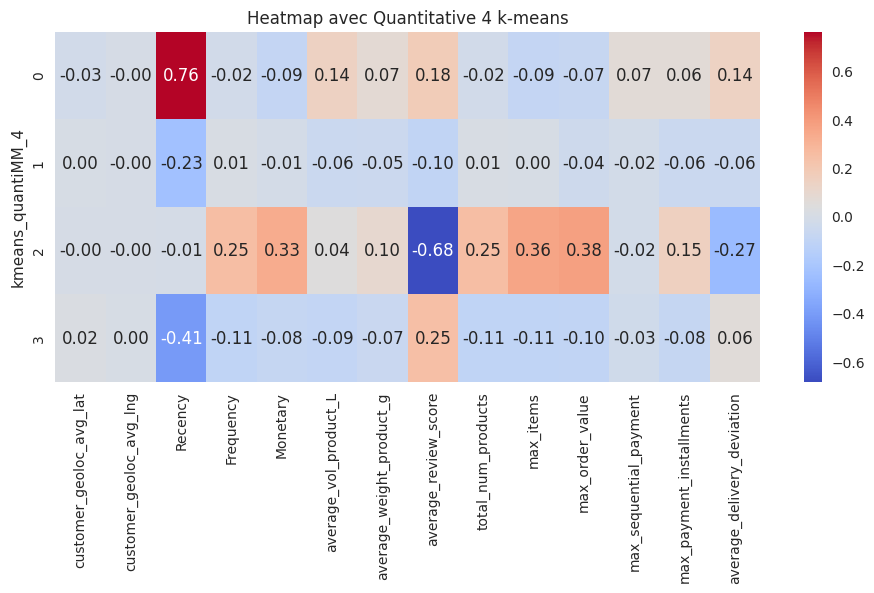

In [214]:
# ------------------------
# Visualization Heatmap :
# ------------------------

# Dataframe preparation
# ----------------------
# Features mean
df_quanti = df_kmeans_quantiMM_4.select_dtypes(include=["float64", "int64"])
df_quanti_mean = df_quanti.mean()

# Calculation of the proportional deviation from the total average
clusterQantiMM_4kmean = df_kmeans_quantiMM_4.groupby("kmeans_quantiMM_4")\
                                            .mean()
prop_quantiMM_4kcluster = clusterQantiMM_4kmean/df_quanti_mean - 1
prop_quantiMM_4kcluster = prop_quantiMM_4kcluster.loc[[0, 1, 2, 3]]


plt.figure(figsize=(25, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_quantiMM_4kcluster, cmap='coolwarm', fmt='.2f', annot=True)
plt.title('Heatmap avec Quantitative 4 k-means')
plt.plot()

plt.show()

<span style='background:#00649a'><span style='color:white'>Projection en 2D, ACP, clusters hue</span></span>

In [215]:
# ----------------------
# Number of components
num_comp = len(features_ss_quanti)

# -------------------
# PCA Instantiation:
pca = PCA(n_components=num_comp)

# ------------------------
# Scaled data training :
pca.fit(df_ss_quanti_MM)

PCA(n_components=14)

In [216]:
# -------------------------------------
# Variance captured by each component
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()
print(scree_cum)

# Components list :
x_list = range(1, num_comp+1)

[ 48.  67.  78.  86.  92.  95.  97.  98.  99. 100. 100. 100. 100. 100.]


In [217]:
# PCA with 6 components
n_comp_log = 6
pca_6 = PCA(n_components=n_comp_log)
pca_6.fit(df_ss_quanti_MM)
X_ss_quanti_pca_6 = pca_6.transform(df_ss_quanti_MM)

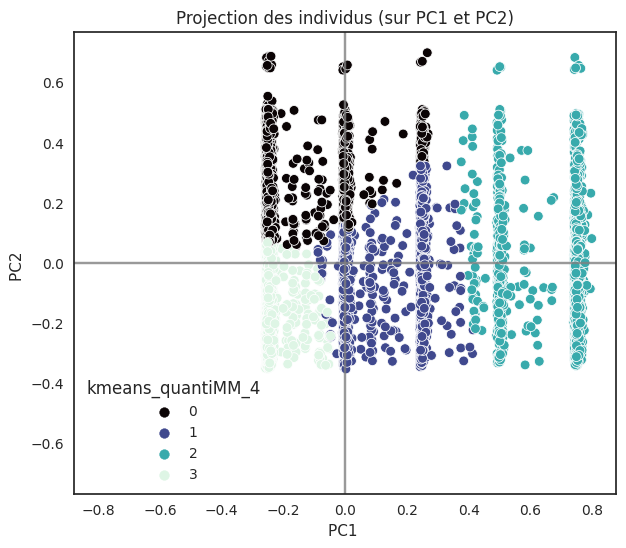

In [218]:
# -------------------
# Customers plotting over PC1 and PC2
x_y = [0, 1]
display_factorial_planes(X_ss_quanti_pca_6, x_y,
                         clusters=df_kmeans_quantiMM_4["kmeans_quantiMM_4"],
                         paletteN=palette4,
                         figsize=(7, 6))

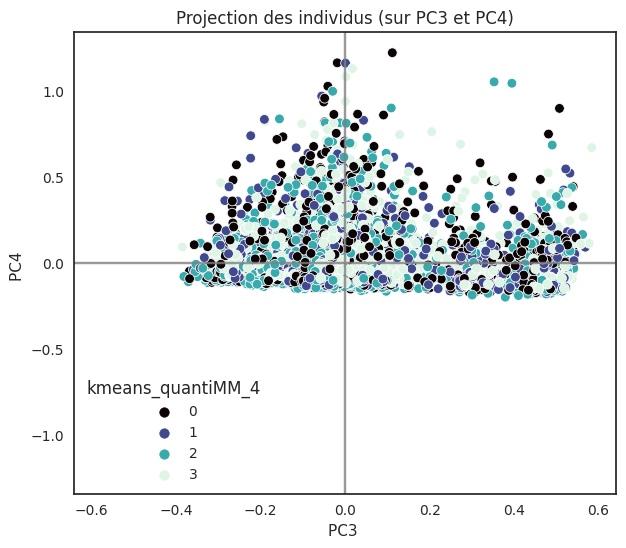

In [219]:
# -------------------
# Customers plotting over PC3 and PC4
x_y = [2, 3]
display_factorial_planes(X_ss_quanti_pca_6, x_y,
                         clusters=df_kmeans_quantiMM_4["kmeans_quantiMM_4"],
                         paletteN=palette4,
                         figsize=(7, 6))

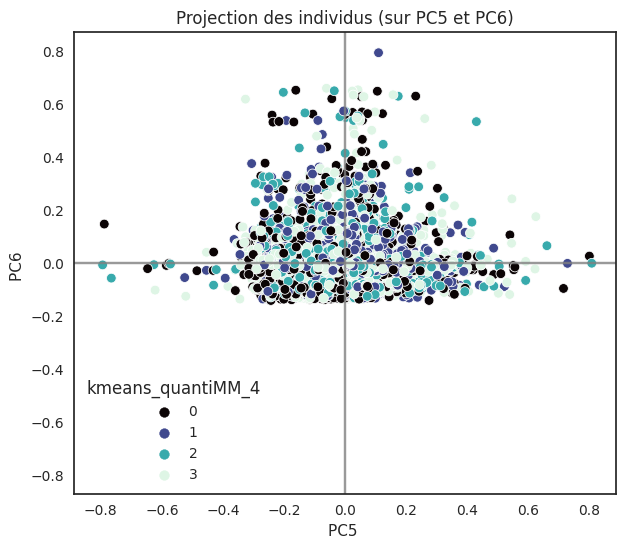

In [220]:
# -------------------
# Customers plotting over PC5 and PC6
x_y = [4, 5]
display_factorial_planes(X_ss_quanti_pca_6, x_y,
                         clusters=df_kmeans_quantiMM_4["kmeans_quantiMM_4"],
                         paletteN=palette4,
                         figsize=(7, 6))

<a id='kmeans_quantiRS_4'></a>

### <span style='background:#0075bc'><span style='color:white'>Quantitative data Robust scaled, k-means, k=4</span></span>


In [221]:
# K-means, Quantitative data, Robust scaler, k=4

kmeans_quantiRS_4 = cluster.KMeans(n_clusters=4, n_init=10, init="k-means++",
                                   random_state=seed)
clusters_kmeans_quantiRS_4 = kmeans_quantiRS_4.fit_predict(X_ss_quanti_RS)
kmeans_quantiRS_4_labels = kmeans_quantiRS_4.labels_

In [222]:
# Adding the cluster assignment to the dataframe
df_kmeans_quantiRS_4 = df_customers_subsample.copy()
df_kmeans_quantiRS_4["kmeans_quantiRS_4"] = kmeans_quantiRS_4.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_quantiRS_4,num_entries,Frequency_%
0,6129,67.233436
3,2144,23.519087
1,732,8.029838
2,111,1.217639


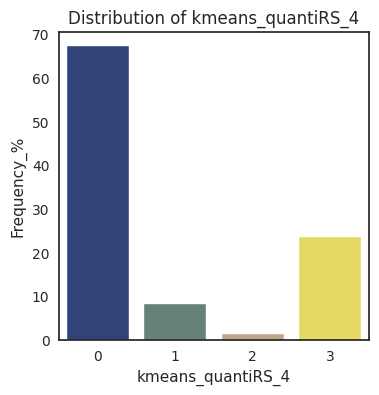

In [223]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_quantiRS_4, "kmeans_quantiRS_4", palette4)

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/3263524917.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterQantiRS_4kmean = df_kmeans_quantiRS_4.groupby("kmeans_quantiRS_4")\


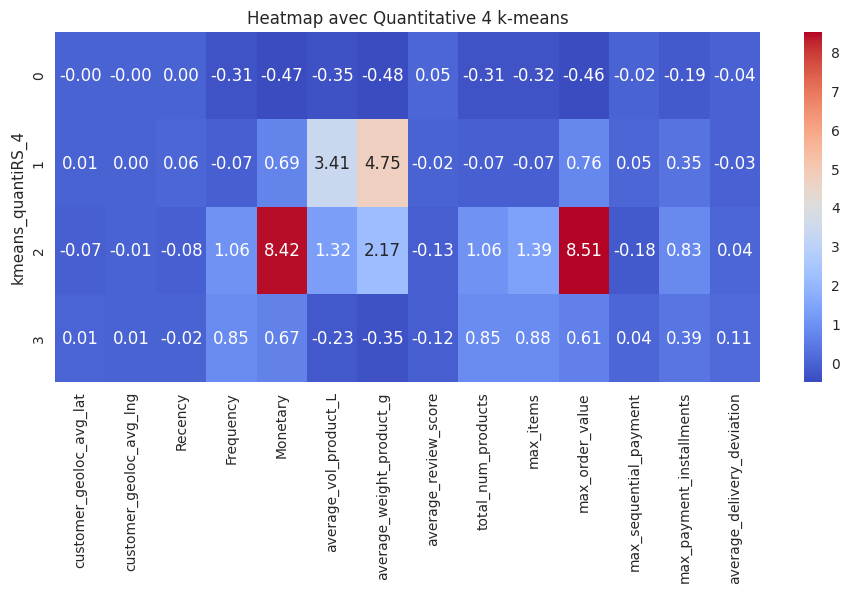

In [224]:
# ------------------------
# Visualization Heatmap :
# ------------------------

# Dataframe preparation
# ----------------------
# Features mean
df_quanti = df_kmeans_quantiRS_4.select_dtypes(include=["float64", "int64"])
df_quanti_mean = df_quanti.mean()

# Calculation of the proportional deviation from the total average
clusterQantiRS_4kmean = df_kmeans_quantiRS_4.groupby("kmeans_quantiRS_4")\
                                            .mean()
prop_quantiRS_4kcluster = clusterQantiRS_4kmean/df_quanti_mean - 1
prop_quantiRS_4kcluster = prop_quantiRS_4kcluster.loc[[0, 1, 2, 3]]


plt.figure(figsize=(25, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_quantiRS_4kcluster, cmap='coolwarm', fmt='.2f', annot=True)
plt.title('Heatmap avec Quantitative 4 k-means')
plt.plot()

plt.show()

<span style='background:#00649a'><span style='color:white'>Projection en 2D, ACP, clusters hue</span></span>

In [225]:
# ----------------------
# Number of components
num_comp = len(features_ss_quanti)

# -------------------
# PCA Instantiation:
pca = PCA(n_components=num_comp)

# ------------------------
# Scaled data training :
pca.fit(df_ss_quanti_RS)

PCA(n_components=14)

In [226]:
# -------------------------------------
# Variance captured by each component
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()
print(scree_cum)

# Components list :
x_list = range(1, num_comp+1)

[ 35.  56.  68.  78.  84.  88.  91.  93.  96.  97.  99. 100. 100. 100.]


In [227]:
scree_cum

array([ 35.,  56.,  68.,  78.,  84.,  88.,  91.,  93.,  96.,  97.,  99.,
       100., 100., 100.])

In [228]:
# PCA with 9 components
n_comp_log = 9
pca_9 = PCA(n_components=n_comp_log)
pca_9.fit(df_ss_quanti_RS)
X_projected_pca_9 = pca_9.transform(df_ss_quanti_RS)

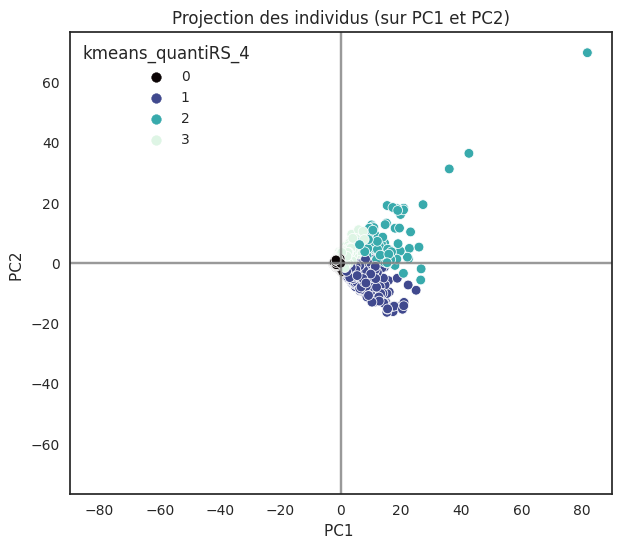

In [229]:
# -------------------
# Customers plotting over PC1 and PC2
x_y = [0, 1]
display_factorial_planes(X_projected_pca_9, x_y,
                         clusters=df_kmeans_quantiRS_4["kmeans_quantiRS_4"],
                         paletteN=palette4,
                         figsize=(7, 6))

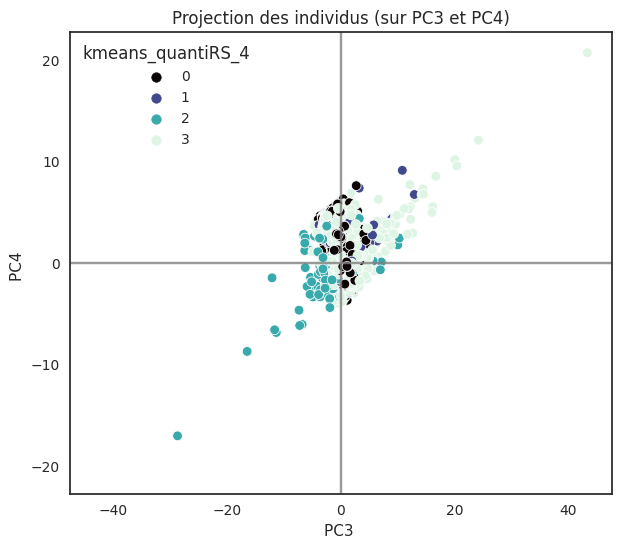

In [230]:
# -------------------
# Customers plotting over PC3 and PC4
x_y = [2, 3]
display_factorial_planes(X_projected_pca_9, x_y,
                         clusters=df_kmeans_quantiRS_4["kmeans_quantiRS_4"],
                         paletteN=palette4,
                         figsize=(7, 6))

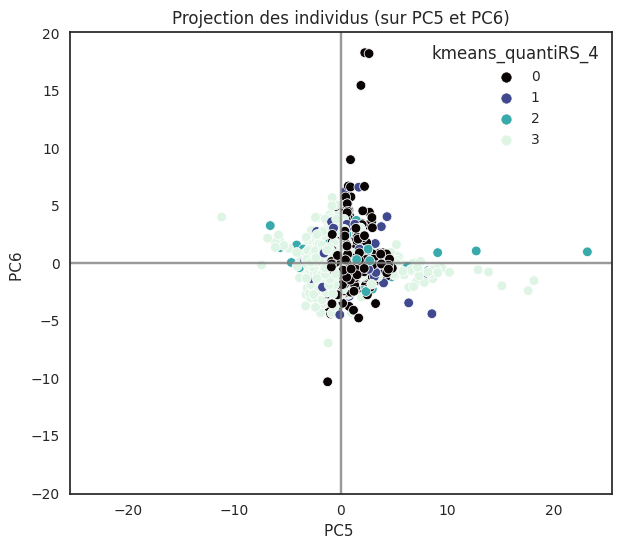

In [231]:
# -------------------
# Customers plotting over PC5 and PC6
x_y = [4, 5]
display_factorial_planes(X_projected_pca_9, x_y,
                         clusters=df_kmeans_quantiRS_4["kmeans_quantiRS_4"],
                         paletteN=palette4,
                         figsize=(7, 6))

<a id='kmeans_quantiRS_5'></a>

### <span style='background:#0075bc'><span style='color:white'>Quantitative data Robust scaled, k-means, k=5</span></span>


In [232]:
# K-means, Quantitative data, Robust scaler, k=5
kmeans_quantiRS_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                                   random_state=seed)
clusters_kmeans_quantiRS_5 = kmeans_quantiRS_5.fit_predict(X_ss_quanti_RS)
kmeans_quantiRS_5_labels = kmeans_quantiRS_5.labels_

In [233]:
# Adding the cluster assignment to the dataframe
df_kmeans_quantiRS_5 = df_customers_subsample.copy()
df_kmeans_quantiRS_5["kmeans_quantiRS_5"] = kmeans_quantiRS_5.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_quantiRS_5,num_entries,Frequency_%
0,5562,61.013602
1,1843,20.217201
2,890,9.763054
3,710,7.788504
4,111,1.217639


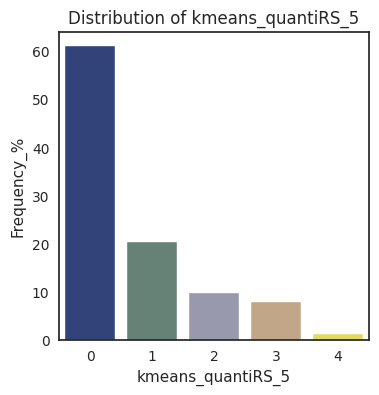

In [234]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_quantiRS_5, "kmeans_quantiRS_5", palette5)

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/2544821929.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterQantiRS_5kmean = df_kmeans_quantiRS_5.groupby("kmeans_quantiRS_5")\


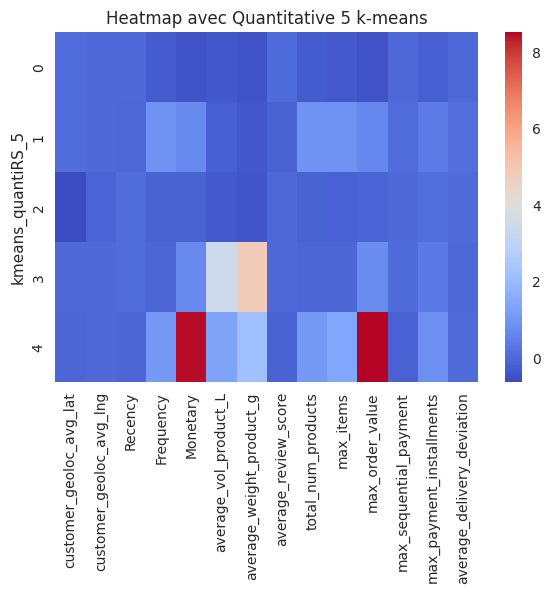

In [235]:
# ------------------------
# Visualization Heatmap :
# ------------------------

# Dataframe preparation
# ----------------------
# Features mean
df_quanti = df_kmeans_quantiRS_5.select_dtypes(include=["float64", "int64"])
df_quanti_mean = df_quanti.mean()

# Calculation of the proportional deviation from the total average
clusterQantiRS_5kmean = df_kmeans_quantiRS_5.groupby("kmeans_quantiRS_5")\
                                            .mean()
prop_quantiRS_5kcluster = clusterQantiRS_5kmean/df_quanti_mean - 1
prop_quantiRS_5kcluster = prop_quantiRS_5kcluster.loc[[0, 1, 2, 3, 4]]


plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_quantiRS_5kcluster, cmap='coolwarm')
plt.title('Heatmap avec Quantitative 5 k-means')
plt.plot()

plt.show()

<span style='background:#00649a'><span style='color:white'>Projection en 2D, ACP, clusters hue</span></span>

In [236]:
# ----------------------
# Number of components
num_comp = len(features_ss_quanti)

# -------------------
# PCA Instantiation:
pca = PCA(n_components=num_comp)

# ------------------------
# Scaled data training :
pca.fit(df_ss_quanti_RS)

PCA(n_components=14)

In [237]:
# -------------------------------------
# Variance captured by each component
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()
print(scree_cum)

# Components list :
x_list = range(1, num_comp+1)

[ 35.  56.  68.  78.  84.  88.  91.  93.  96.  97.  99. 100. 100. 100.]


In [238]:
# PCA with 9 components
n_comp_log = 9
pca_9 = PCA(n_components=n_comp_log)
pca_9.fit(df_ss_quanti_RS)
X_projected_pca_9 = pca_9.transform(df_ss_quanti_RS)

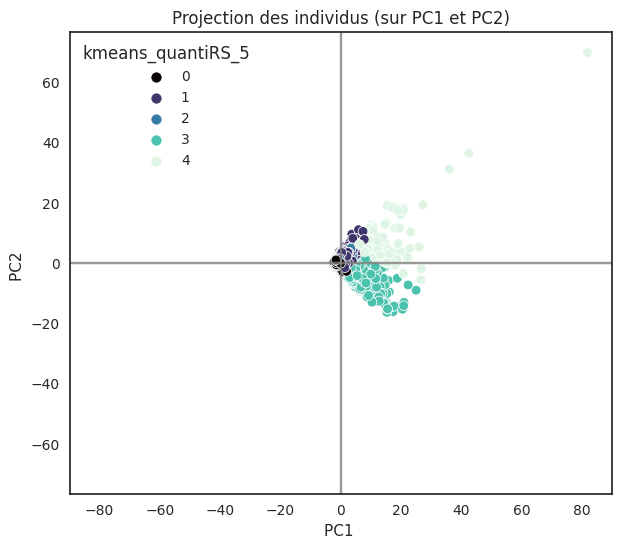

In [239]:
# -------------------
# Customers plotting over PC1 and PC2
x_y = [0, 1]
display_factorial_planes(X_projected_pca_9, x_y,
                         clusters=df_kmeans_quantiRS_5["kmeans_quantiRS_5"],
                         paletteN=palette5,
                         figsize=(7, 6))

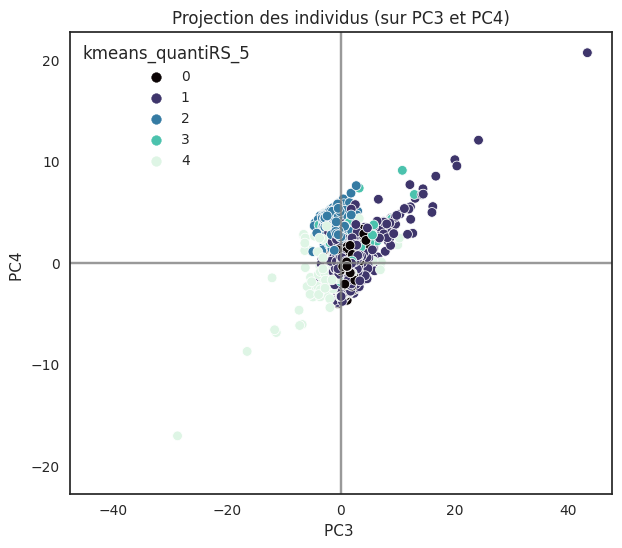

In [240]:
# -------------------
# Customers plotting over PC3 and PC4
x_y = [2, 3]
display_factorial_planes(X_projected_pca_9, x_y,
                         clusters=df_kmeans_quantiRS_5["kmeans_quantiRS_5"],
                         paletteN=palette5,
                         figsize=(7, 6))

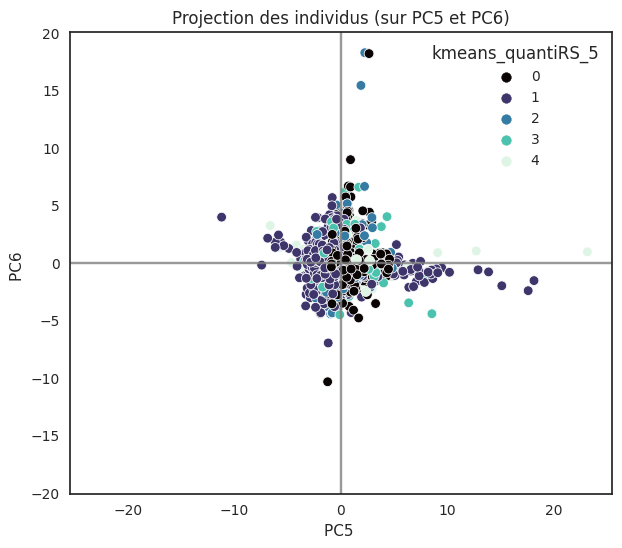

In [241]:
# -------------------
# Customers plotting over PC5 and PC6
x_y = [4, 5]
display_factorial_planes(X_projected_pca_9, x_y,
                         clusters=df_kmeans_quantiRS_5["kmeans_quantiRS_5"],
                         paletteN=palette5,
                         figsize=(7, 6))

<a id='kmeans_quantistdS_4'></a>

### <span style='background:#0075bc'><span style='color:white'>Quantitative data StandardScaler, k-means, k=4</span></span>


In [242]:
# K-means, Quantitative data, Standard scaler, k=4

kmeans_quantistdS_4 = cluster.KMeans(n_clusters=4, n_init=10,
                                     init="k-means++", random_state=seed)
clusters_kmeans_quantistdS_4 = kmeans_quantistdS_4\
                                            .fit_predict(X_ss_quanti_stdS)
kmeans_quantistdS_4_labels = kmeans_quantistdS_4.labels_

In [243]:
# Adding the cluster assignment to the dataframe
df_kmeans_quantistdS_4 = df_customers_subsample.copy()
df_kmeans_quantistdS_4["kmeans_quantistdS_4"] = kmeans_quantistdS_4.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_quantistdS_4,num_entries,Frequency_%
2,6019,66.026766
0,2339,25.658183
1,588,6.450197
3,170,1.864853


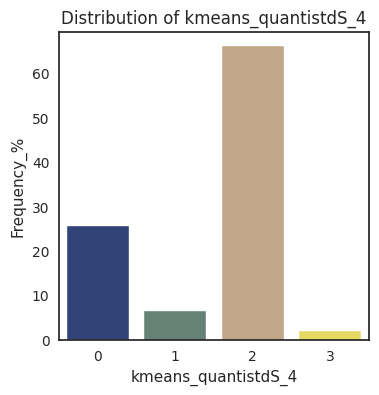

In [244]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_quantistdS_4, "kmeans_quantistdS_4", palette4)

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/396124799.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterQantistdS_4kmean = df_kmeans_quantistdS_4\


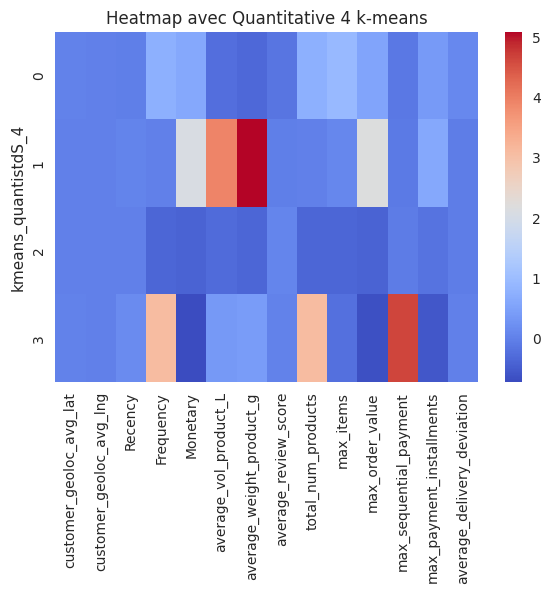

In [245]:
# ------------------------
# Visualization Heatmap :
# ------------------------

# Dataframe preparation
# ----------------------
# Features mean
df_quanti = df_kmeans_quantistdS_4.select_dtypes(include=["float64", "int64"])
df_quanti_mean = df_quanti.mean()

# Calculation of the proportional deviation from the total average
clusterQantistdS_4kmean = df_kmeans_quantistdS_4\
                                .groupby("kmeans_quantistdS_4").mean()
prop_quantistdS_4kcluster = clusterQantistdS_4kmean/df_quanti_mean - 1
prop_quantistdS_4kcluster = prop_quantistdS_4kcluster.loc[[0, 1, 2, 3]]


plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_quantistdS_4kcluster, cmap='coolwarm')
plt.title('Heatmap avec Quantitative 4 k-means')
plt.plot()

plt.show()

<span style='background:#00649a'><span style='color:white'>Projection en 2D, ACP, clusters hue</span></span>

In [246]:
# ----------------------
# Number of components
num_comp = len(features_ss_quanti)

# -------------------
# PCA Instantiation:
pca = PCA(n_components=num_comp)

# ------------------------
# Scaled data training :
pca.fit(df_ss_quanti_stdS)

PCA(n_components=14)

In [247]:
# -------------------------------------
# Variance captured by each component
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()
print(scree_cum)

# Components list :
x_list = range(1, num_comp+1)

[ 23.  39.  50.  60.  69.  76.  83.  88.  93.  97.  99. 100. 100. 100.]


In [248]:
# PCA with 9 components
n_comp_log = 9
pca_9 = PCA(n_components=n_comp_log)
pca_9.fit(df_ss_quanti_stdS)
X_projected_pca_9 = pca_9.transform(df_ss_quanti_stdS)

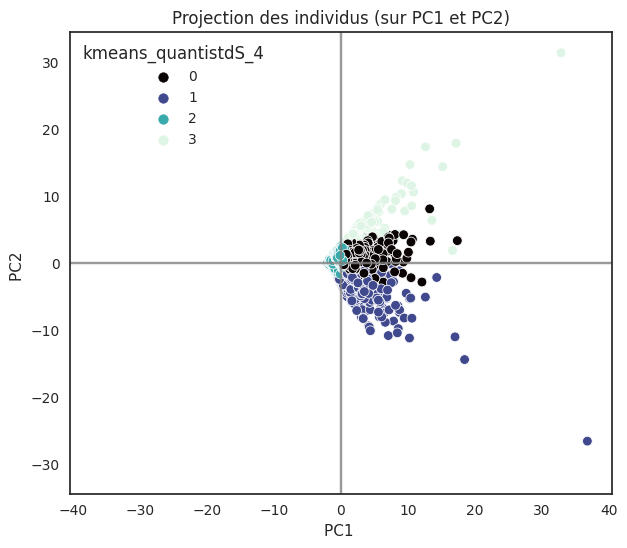

In [249]:
# -------------------
# Customers plotting over PC1 and PC2
x_y = [0, 1]
display_factorial_planes(X_projected_pca_9, x_y,
                    clusters=df_kmeans_quantistdS_4["kmeans_quantistdS_4"],
                         paletteN=palette4,
                         figsize=(7, 6))

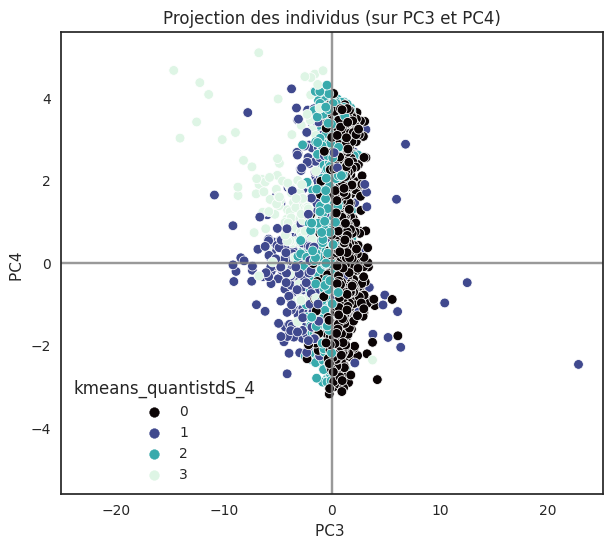

In [250]:
# -------------------
# Customers plotting over PC3 and PC4
x_y = [2, 3]
display_factorial_planes(X_projected_pca_9, x_y,
                    clusters=df_kmeans_quantistdS_4["kmeans_quantistdS_4"],
                         paletteN=palette4,
                         figsize=(7, 6))

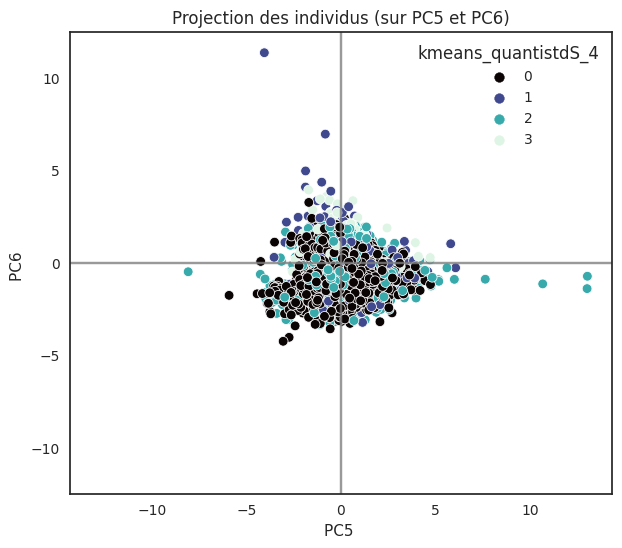

In [251]:
# -------------------
# Customers plotting over PC5 and PC6
x_y = [4, 5]
display_factorial_planes(X_projected_pca_9, x_y,
                    clusters=df_kmeans_quantistdS_4["kmeans_quantistdS_4"],
                         paletteN=palette4,
                         figsize=(7, 6))

<a id='kmeans_quantistdS_5'></a>

### <span style='background:#0075bc'><span style='color:white'>Quantitative data StandardScaler, k-means, k=5</span></span>


In [252]:
# K-means, Quantitative data, Standard scaler, k=5

kmeans_quantistdS_5 = cluster.KMeans(n_clusters=5, n_init=10,
                                     init="k-means++", random_state=seed)
clusters_kmeans_quantistdS_5 = kmeans_quantistdS_5\
                                     .fit_predict(X_ss_quanti_stdS)
kmeans_quantistdS_5_labels = kmeans_quantistdS_5.labels_

In [253]:
# Adding the cluster assignment to the dataframe
df_kmeans_quantistdS_5 = df_customers_subsample.copy()
df_kmeans_quantistdS_5["kmeans_quantistdS_5"] = kmeans_quantistdS_5.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_quantistdS_5,num_entries,Frequency_%
1,5525,60.607723
0,2005,21.994296
2,892,9.784993
4,581,6.373409
3,113,1.239579


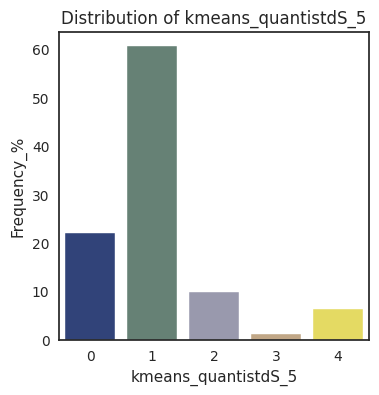

In [254]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_quantistdS_5, "kmeans_quantistdS_5", palette5)

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/2300711880.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterQantistdS_5kmean = df_kmeans_quantistdS_5\


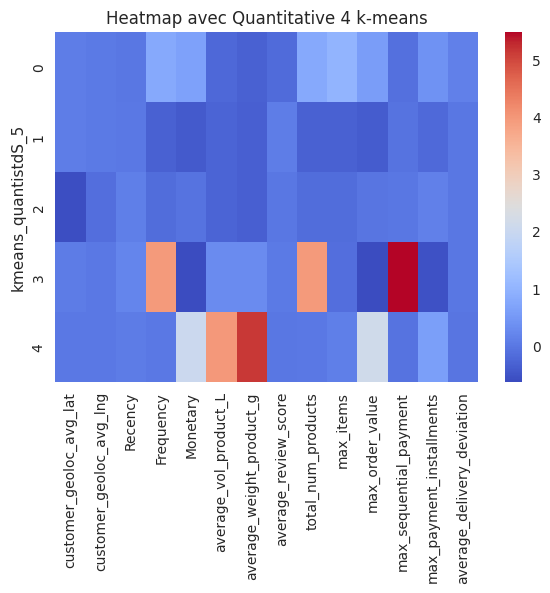

In [255]:
# ------------------------
# Visualization Heatmap :
# ------------------------

# Dataframe preparation
# ----------------------
# Features mean
df_quanti = df_kmeans_quantistdS_5.select_dtypes(include=["float64", "int64"])
df_quanti_mean = df_quanti.mean()

# Calculation of the proportional deviation from the total average
clusterQantistdS_5kmean = df_kmeans_quantistdS_5\
                                        .groupby("kmeans_quantistdS_5").mean()
prop_quantistdS_5kcluster = clusterQantistdS_5kmean/df_quanti_mean - 1
prop_quantistdS_5kcluster = prop_quantistdS_5kcluster.loc[[0, 1, 2, 3, 4]]


plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_quantistdS_5kcluster, cmap='coolwarm')
plt.title('Heatmap avec Quantitative 4 k-means')
plt.plot()

plt.show()

<span style='background:#00649a'><span style='color:white'>Projection en 2D, ACP, clusters hue</span></span>

In [256]:
# ----------------------
# Number of components
num_comp = len(features_ss_quanti)

# -------------------
# PCA Instantiation:
pca = PCA(n_components=num_comp)

# ------------------------
# Scaled data training :
pca.fit(df_ss_quanti_stdS)

PCA(n_components=14)

In [257]:
# -------------------------------------
# Variance captured by each component
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()
print(scree_cum)

# Components list :
x_list = range(1, num_comp+1)

[ 23.  39.  50.  60.  69.  76.  83.  88.  93.  97.  99. 100. 100. 100.]


In [258]:
# PCA with 9 components
n_comp_log = 9
pca_9 = PCA(n_components=n_comp_log)
pca_9.fit(df_ss_quanti_stdS)
X_projected_pca_9 = pca_9.transform(df_ss_quanti_stdS)

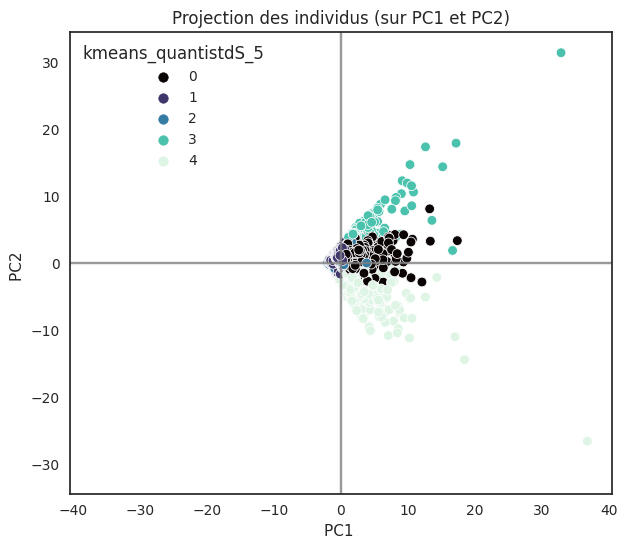

In [259]:
# -------------------
# Customers plotting over PC1 and PC2
x_y = [0, 1]
display_factorial_planes(X_projected_pca_9, x_y,
                clusters=df_kmeans_quantistdS_5["kmeans_quantistdS_5"],
                         paletteN=palette5,
                         figsize=(7, 6))

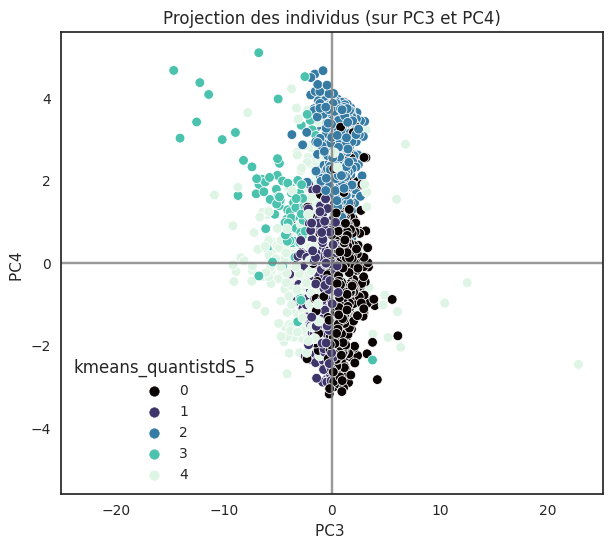

In [260]:
# -------------------
# Customers plotting over PC3 and PC4
x_y = [2, 3]
display_factorial_planes(X_projected_pca_9, x_y,
                    clusters=df_kmeans_quantistdS_5["kmeans_quantistdS_5"],
                         paletteN=palette5,
                         figsize=(7, 6))

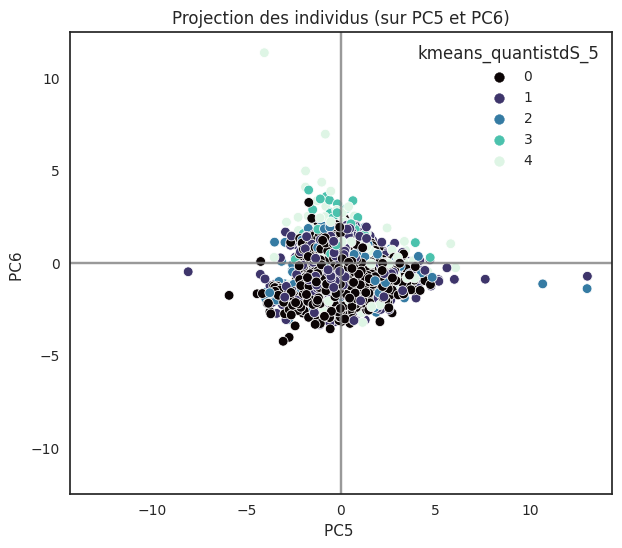

In [261]:
# -------------------
# Customers plotting over PC5 and PC6
x_y = [4, 5]
display_factorial_planes(X_projected_pca_9, x_y,
                      clusters=df_kmeans_quantistdS_5["kmeans_quantistdS_5"],
                         paletteN=palette5,
                         figsize=(7, 6))

<a id='kmeans_qqRS_5'></a>

### <span style='background:#0075bc'><span style='color:white'>Quanti&Quali data Robust scaled, k-means, k=5</span></span>


In [262]:
# K-means, Quanti&Quali data, Robust scaler, k=5
kmeans_qqRS_5 = cluster.KMeans(n_clusters=5, n_init=10, init="k-means++",
                               random_state=seed)
clusters_kmeans_qqRS_5 = kmeans_qqRS_5.fit_predict(X_ss_qq_RS)
kmeans_qqRS_5_labels = kmeans_qqRS_5.labels_

In [263]:
# Adding the cluster assignment to the dataframe
df_kmeans_qqRS_5 = df_customers_subsample.copy()
df_kmeans_qqRS_5["kmeans_qqRS_5"] = kmeans_qqRS_5.labels_

<span style='background:#00649a'><span style='color:white'>Customer per cluster</span></span>

kmeans_qqRS_5,num_entries,Frequency_%
0,5529,60.651602
3,1872,20.535323
4,893,9.795963
1,711,7.799473
2,111,1.217639


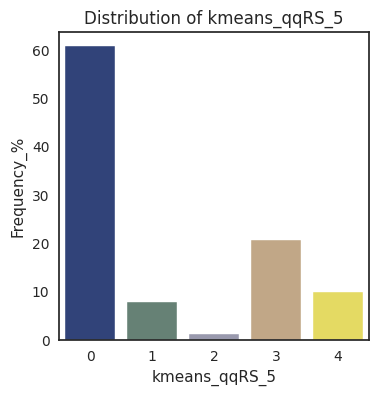

In [264]:
# Customer per cluster
# ------------------------------------------------
segment_size(df_kmeans_qqRS_5, "kmeans_qqRS_5", palette5)

<span style='background:#00649a'><span style='color:white'>Heatmap</span></span>

/tmp/ipykernel_14022/2192367749.py:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  clusterQQRS_5kmean = df_kmeans_qqRS_5.groupby("kmeans_qqRS_5").mean()


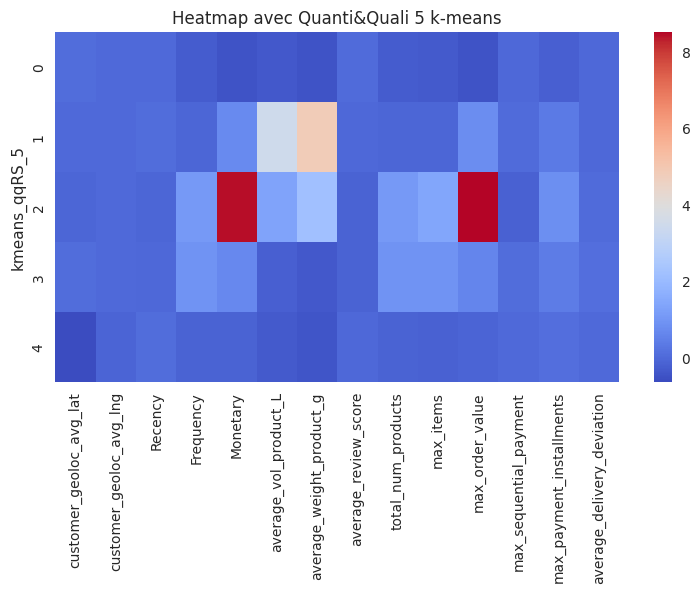

In [265]:
# ------------------------
# Visualization Heatmap :
# ------------------------

# Dataframe preparation
# ----------------------
# Features mean
df_quanti = df_kmeans_qqRS_5.select_dtypes(include=["float64", "int64",
                                                    "uint8"])
df_quanti_mean = df_quanti.mean()

# Calculation of the proportional deviation from the total average
clusterQQRS_5kmean = df_kmeans_qqRS_5.groupby("kmeans_qqRS_5").mean()
prop_qqRS_5kcluster = clusterQQRS_5kmean/df_quanti_mean - 1
prop_qqRS_5kcluster = prop_qqRS_5kcluster.loc[[0, 1, 2, 3, 4]]


plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 2)
sns.heatmap(prop_qqRS_5kcluster, cmap='coolwarm')
plt.title('Heatmap avec Quanti&Quali 5 k-means')
plt.plot()

plt.show()

<span style='background:#00649a'><span style='color:white'>Projection en 2D, ACP, clusters hue</span></span>

In [266]:
# ----------------------
# Number of components
num_comp = len(features_ss_qq)

# -------------------
# PCA Instantiation:
pca = PCA(n_components=num_comp)

# ------------------------
# Scaled data training :
pca.fit(df_ss_qq_RS)

PCA(n_components=56)

In [267]:
# -------------------------------------
# Variance captured by each component
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()
print(scree_cum)

# Components list :
x_list = range(1, num_comp+1)

[ 32.  51.  61.  71.  75.  79.  82.  84.  86.  88.  89.  90.  91.  91.
  92.  92.  93.  93.  94.  94.  95.  95.  95.  96.  96.  96.  97.  97.
  97.  97.  98.  98.  98.  98.  99.  99.  99.  99.  99.  99. 100. 100.
 100. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100.]


In [268]:
# PCA with 13 components, 90% variance
n_comp_log = 13
pca_13 = PCA(n_components=n_comp_log)
pca_13.fit(df_ss_qq_RS)
X_projected_pca_13 = pca_13.transform(df_ss_qq_RS)

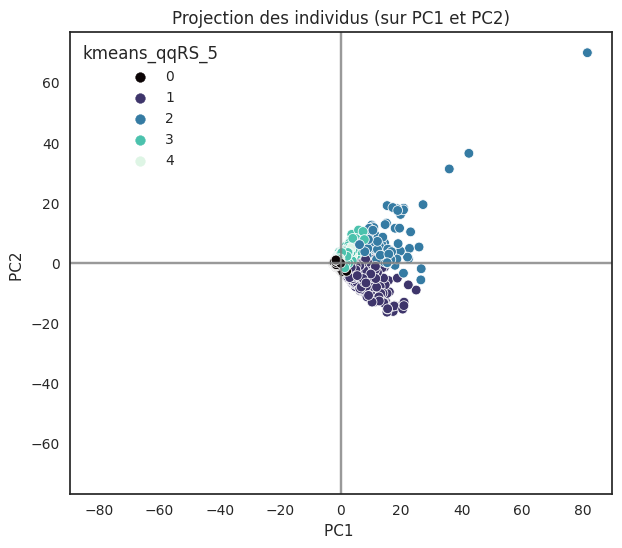

In [269]:
# -------------------
# Customers plotting over PC1 and PC2
x_y = [0, 1]
display_factorial_planes(X_projected_pca_13, x_y,
                         clusters=df_kmeans_qqRS_5["kmeans_qqRS_5"],
                         paletteN=palette5,
                         figsize=(7, 6))

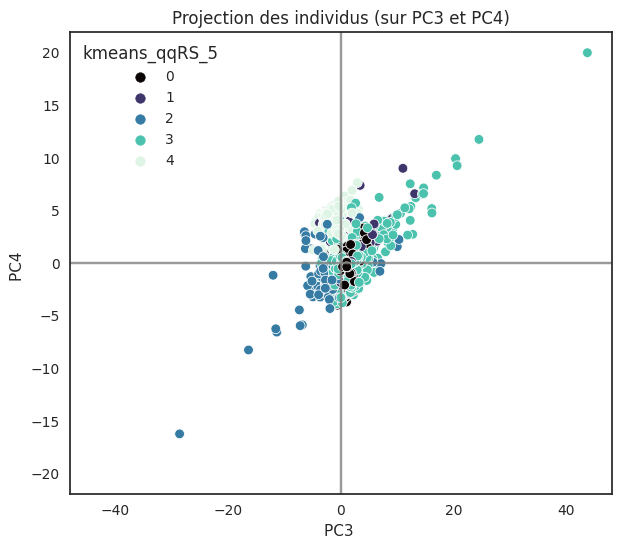

In [270]:
# -------------------
# Customers plotting over PC3 and PC4
x_y = [2, 3]
display_factorial_planes(X_projected_pca_13, x_y,
                         clusters=df_kmeans_qqRS_5["kmeans_qqRS_5"],
                         paletteN=palette5,
                         figsize=(7, 6))

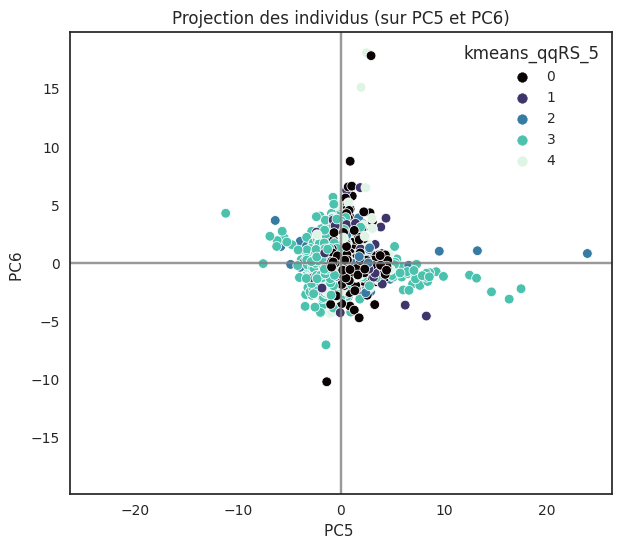

In [271]:
# -------------------
# Customers plotting over PC5 and PC6
x_y = [4, 5]
display_factorial_planes(X_projected_pca_13, x_y,
                         clusters=df_kmeans_qqRS_5["kmeans_qqRS_5"],
                         paletteN=palette5,
                         figsize=(7, 6))

---
---
<a id="performances_summary"></a>

## <font color = '#0085dd'>Summary</font>


The clusters resulting from the configurations with the best characteristics, identified during the comparative performance analysis, have been analyzed.
All retained configurations have an initialization stability of 100%.

A preliminary analysis has been performed to determine which configurations offer the best interpretable results.
During the preliminary analysis we have evaluated :

* Percentage of customers in each cluster
* Projection of the data in 2D (pairplot or PCA), position of the customers in each cluster 
* Impact of each of the variables considered in the analysis on each cluster (heatmap)

| Clustering model | Data set | Scaler | Hyperparameters configuration | Cluster size balancing | Discriminant distribution | Heatmap evaluation |
| --- | --- | ---| ---| --- | --- | --- |
| k-means | RFM | MinMax | k =4 | Excellent | Only over 1 feature | Very poor |
| k-means | RFM | MinMax | k =5 | Excellent | Only over 1 feature | Very poor |
| k-means | RFM | Robust | k =4 | Poor (2 clusters 97% customers) | Medium | Medium |
| k-means | RFM | Robust | k =6 |Medium (2 clusters 86% customers) | Medium | Good |
| k-means | RFM | Standard | k =4 | Poor (2 clusters 87% customers) | Good | Good |
| k-means | RFM | Standard | k =5 | Medium (2 clusters 71% customers) | Good | Good |
| k-means | RFM | Standard | k =6 | Med (2 clusters 68% customers, 2cls <1.2%) | Medium | Medium |
| Hierarchical Ward's method | RFM | Standard | 5 | Good (2 clusters 65% customers) | Good | Good |
| k-means | Quantitative | MinMax | k =4 | Excellent | Medium | Medium |
| k-means | Quantitative | Robust | k =4 | Poor (2 clusters 91% customers) | Medium | Medium |
| k-means | Quantitative | Robust | k =5 | Medium (2 clusters 81% customers) | Medium | Poor |
| k-means | Quantitative | Standard | k =4 | Poor (2 clusters 92% customers) | Medium/Poor | Medium |
| k-means | Quantitative | Standard | k =5 | Medium (2 clusters 82% customers) | Medium/Poor | Medium/Poor |


| k-means | Quanti&Quali | Robust | k =5 | Medium (2 clusters 82% customers) | Poor | Poor |


Based on these results, the configurations retained for further study are as follows

| Clustering model | Data set | Scaler | Hyperparameters configuration | 
| --- | --- | ---| ---| 
| k-means | RFM | Robust | k =6 |
| k-means | RFM | Standard | k =4 | 
| k-means | RFM | Standard | k =5 | 
| k-means | RFM | Standard | k =6 | 
| --- | --- | ---| ---| 
| Hierarchical Ward's method | RFM | Standard | 5 | 
| --- | --- | ---| ---| 
| k-means | Quantitative | MinMax | k =4 | 